# Open Finance Dissertation - Introduction

## Preamble

Premise: We are given 3 csv files, adding up to 100,000 rows. Each row contains information about an individual who resides in the UK. The initial information given includes annual income and debt behaviour. While annual income is static, debt behaviour is given in the form of dynamic time series. In particular, below are the information available for each 100,000 customers. 

1) whether they have access to revolving credit such as overdraft facility, credit  card 1, credit card 2.
2) Whether they took out a short term loan (24-month term loan)
2) If they have access to revolving credit, the monthly balance for each of the product 
3) The credit limit for each of the revolving credit product 
4) The interest rate for late payment for each of revolving credit products and short term loan 
5) Initial balance for each of revolving credit products and short term loan
6) Monthly repayment amount for short term loan
7) Whether they pay the monthly amount due in time (we assume each payment is in full, no partials allowed)
8) If payments are due, by how many days they are due

As we can see, the dataset on debt behaviour is quite rich, but time series data is slightly cumbersome to work with. Preliminary inspection suggests we can mainly distill the data along two axis: 

A) indebtedness / financial health - through metrics such as debt-to-income and credit utilisation 

B) payment behaviour/ financial prudence - % of late payments / number of late days

## Loading Dataset

We start by importing the required packages, and read csv files as 3 different data frames.



In [146]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from scipy.stats import norm
from scipy.stats import beta
import math
import numpy as np
# read, parsing no special types here
df_high = pd.read_csv("Downloads/KB_high_secure.csv")
df_medium = pd.read_csv("Downloads/KB_medium_secure.csv")
df_low = pd.read_csv("Downloads/KB_low_secure.csv")

Concatenate the 3 dataframes into a single dataframe with 100,000 lines

In [2]:
frame = [df_low, df_medium, df_high]
df = pd.concat(frame)
def clean_numeric_columns(df: pd.DataFrame) -> pd.DataFrame:
    # 1. Select all numeric columns (ints and floats)
    numeric_cols = df.select_dtypes(include=["number"]).columns

    # 2. Apply abs() to remove negative signs and then fill NaNs with 0
    df[numeric_cols] = df[numeric_cols].abs().fillna(0)
    return df



df = clean_numeric_columns(df)

df.describe gives insight into some key metrics of the dataframe

In [3]:
df.describe()

,customer_id,income,overdraft,overdraft_credit_limit,overdraft_interest_rate,credit_card_type1,credit_card_type1_credit_limit,credit_card_type1_interest_rate,credit_card_type1_initial_balance,credit_card_type2,...,short_term_loan_total_balance_3,short_term_loan_total_balance_4,short_term_loan_total_balance_5,short_term_loan_total_balance_6,short_term_loan_total_balance_7,short_term_loan_total_balance_8,short_term_loan_total_balance_9,short_term_loan_total_balance_10,short_term_loan_total_balance_11,short_term_loan_total_balance_12
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,1.000000e+05,100000.000000,100000.000000,...,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,17989.500000,40966.691253,0.727520,1865.678006,0.278422,1.0,6145.003630,2.007000e-01,1204.323611,0.574890,...,179.547309,179.547309,179.547309,179.547309,179.624723,179.634800,179.701070,179.777889,179.785831,179.835922
std,11635.917978,17659.981752,0.445238,1465.312146,0.170392,0.0,2648.997246,4.518630e-14,575.152372,0.494362,...,286.897263,286.897263,286.897263,286.897263,287.056227,287.055453,287.185625,287.359963,287.378124,287.450435
min,0.000000,15000.360000,0.000000,0.000000,0.000000,1.0,2250.050000,2.007000e-01,0.220000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8333.000000,26157.002500,0.000000,0.000000,0.000000,1.0,3923.550000,2.007000e-01,778.237500,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,16666.000000,38037.640000,1.000000,1832.650000,0.382700,1.0,5705.645000,2.007000e-01,1147.700000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,26499.250000,53161.012500,1.000000,2992.547500,0.382700,1.0,7974.150000,2.007000e-01,1578.792500,1.000000,...,346.370178,346.370178,346.370178,346.370178,346.466197,346.472276,346.635836,346.635836,346.726115,346.726115
max,44999.000000,79999.570000,1.000000,4799.970000,0.382700,1.0,11999.940000,2.007000e-01,4355.750000,1.000000,...,1073.115063,1073.115063,1073.115063,1073.115063,1361.921357,1477.830531,1421.252581,1451.811147,1464.866562,1464.845045


We then define a new dataframe, where each row is scrambled, as our earlier data from the 3 csv files contains customer data in the order of high, medium and low financial health. 

Scrambling the row orders is essential as we assume that do not have access to these labels in the first place, as they are metadata used for synthetic data generation. 

In [4]:
df_new = df.sample(frac=1, random_state=42)

In [5]:
df_new = df_new.reset_index(drop=True)

# Data augmentation 

## Adding additional static labels

Our dataset is way too minimal to work with. For the business purpose of delivering tailored financial advice, we need more data labels such as age group, region, occupation, as well as information on housing (whether our customer is a renter, mortgagor or outright home owner). 

## A word on modeling philosophy

As we add additional labels to our dataset, we will be relying heavily on the Bayesian approach, as the idea is to have our dataset mimic distributional properties of the general UK population as closely as possible. 

Given existing labels (x1,x2,..xn), to add a categorical label x_n+1, it is desirable if we could first obtain the probability distribution P(x_n+1 | x1, ..., xn). 

However, in real life, this is practically impossible. Most surveys contain aggregated data in the form of a 2-way or 3-way table. As an example, we can get 2-way data on distribution of income quintile by age group, but data on multinomial probability distribution for (age group, income decile, region, occupational label) would be hard to come by. 

In the absence of complete n-dimensional probability distribution, with only lesser probability marginals available, we will rely heavily on the Naive Bayes method, which says that P(x_n+1 | x1, x2, ..., xn) is proportional to P(x_n+1) * P(x1 | x_n+1) * P(x2 | x_n+1) ... * P(xn | x_n+1). This, however, comes with the hefty and (often false) assumption that the x_i are mutually independent, but empirically the results often surprisingly robust (more citation needed).

## Additional labels

Firstly, we categorize each row of the income data into 10 quantiles (1 lowest - 10 highest), based on ONS's Household Finances Survey. 

1st quantile - 0 to 14,544 

2nd quantile - 14,545 to 19,542 

3rd quantile - 19,543 to 23,706

4th quantile - 23,707 to 27,885

5th quantile - 27,886 to 32,367

6th quantile - 32,368 to 37,283

7th quantile - 37,284 to 43,449

8th quantile - 43,450 to 51,169

9th quantile - 51,170 to 66,000

10th quantile - above 66,001 

Source: https://www.ons.gov.uk/peoplepopulationandcommunity/personalandhouseholdfinances/incomeandwealth/adhocs/1406distributionofukhouseholddisposableincomefinancialyearending2022

### The region label

Data from 'Income estimates for small areas, England and Wales: financial year ending 2020' allows us to construct a 2-way distributional table for income quantile x region in the UK (excluding Scotland and Northern Ireland). Each cell in the table represents percentage of population with that particular income quantile and region. 

Income estimates for small areas, England and Wales: financial year ending 2020

Source: https://www.ons.gov.uk/peoplepopulationandcommunity/personalandhouseholdfinances/incomeandwealth/bulletins/smallareamodelbasedincomeestimates/financialyearending2020

We can also construct a 2-way distributional table from the 2020 FCA Financial Lives survey. The table contains information on the average/mean unsecured-debt-to-income level for each of the 10 respective regions in the UK. 

Source:
https://www.fca.org.uk/financial-lives/financial-lives-2020-survey

Through Naive-Bayes, we see that P(region | debt-to-income, income quintile) is proportional to P(dti | region) x P(income quintile|region). 

The original expression by Bayes theorem should have been P(r|dti, incQ) = P(r) x P(dti|r)x P(incQ|r,dti). Note how the Naive Bayes approach incorporate the assumption that given region, income quintile is independent of debt-to-income level. 

Since debt-to-income is continuous, we will assume its distribution is given by Gaussian, with mean for P(dti|region) given by the mean value in our dti.csv file, and standard deviation given by the sample sd of dti ratio of our 100,000 customers.

Our first distributional table (regional.csv) allows us to obtain P(income quintile|region), while our second distributional table (dti.csv) allows us to obtain P(dti | region). After normalization, we obtain an approximation for P(region | debt-to-income, income quintile), from which we sample the 'region' label for our 100,000 customers, each with their unique dti (which we calculate from initial debt data) and income quintile (obtained from our initial classification above)


In [6]:
import pandas as pd
import numpy as np

# Load the dti_FCA.csv file
df = pd.read_csv('Downloads/dti_FCA.csv')

# Function to convert DTI ranges to midpoints
def get_dti_midpoint(dti_range):
    if dti_range == '0':
        return 0
    elif dti_range == '>=2.00':
        # For an open-ended range, use the lower bound as a pragmatic midpoint.
        # In a real-world scenario, domain knowledge might suggest a different approach,
        # e.g., assuming a specific distribution or using a higher bound based on data context.
        return 2.00
    else:
        lower, upper = map(float, dti_range.split('-'))
        return (lower + upper) / 2

# Apply the function to create a new 'dti_midpoint' column
df['dti_midpoint'] = df['dti'].apply(get_dti_midpoint)

# Calculate the weighted mean
weighted_mean = np.average(df['dti_midpoint'], weights=df['Frequency'])

# Calculate the weighted variance
# The formula for weighted variance is sum[w_i * (x_i - mean)^2] / sum[w_i]
# For sample variance, it's sum[w_i * (x_i - mean)^2] / (sum[w_i] - 1)
# Using the population variance formula for grouped data, where we divide by sum[w_i] as is commonly done.
weighted_variance = np.average((df['dti_midpoint'] - weighted_mean)**2, weights=df['Frequency'])

# Calculate the standard deviation by taking the square root of the variance
weighted_std = np.sqrt(weighted_variance)

print(f"Estimated Standard Deviation of DTI Level (FCA Grouped Data): {weighted_std:.4f}")

Estimated Standard Deviation of DTI Level (FCA Grouped Data): 0.2953


In [7]:
import pandas as pd
import numpy as np
from scipy.stats import norm

np.random.seed(10)

# ————————————————
# Step 0: load incomes, assign deciles, load region-prior
# ————————————————

salary_df = df_new[['income']].copy()

# assign income deciles
bins = [0, 14545, 19543, 23707, 27886, 32368, 37284, 43450, 51170, 66001, float('inf')]
labels = list(range(1, 11))
salary_df['incQ'] = pd.cut(salary_df['income'], bins=bins, labels=labels, right=True).astype(int)

# load region-by-incQ priors: P(income decile,region) = P(r) x P(incQ|r)
regional_df = pd.read_csv("Downloads/regional.csv")
prob_df = regional_df.copy()
for col in prob_df.columns[1:]:
    prob_df[col] = prob_df[col].str.rstrip('%').astype(float)/100
regions = prob_df['group'].tolist()
region_prior = {
    int(col): prob_df.set_index('group')[col].reindex(regions).values
    for col in prob_df.columns[1:]
}

# ————————————————
# load customer DTI
# ————————————————

dti_customer = pd.read_csv("Downloads/dti.csv")   # columns: [debt_to_income]
salary_df['dti'] = dti_customer['debt_to_income'].values

# ————————————————
# fit P(dti|region) from region_x_dti.csv
# ————————————————

rxd = pd.read_csv("Downloads/region x debt-to-income.csv")  
# expected columns: ['region','debt_to_income','Observation']

# compute mean & std per region
# after loading salary_df and dti_customer as before:
# global_sigma = dti_customer['debt_to_income'].std()

#0.2953 is estimated from FCA grouped data, but could be less reliable given data is grouped and truncated
global_sigma = 0.2953


# Compute per-region mean only
stats = (rxd
         .groupby('region')['debt-to-income']
         .mean()
         .reset_index()
         .rename(columns={'debt-to-income':'mu'}))
stats['sigma'] = global_sigma

# make a lookup
mu_by_region    = dict(zip(stats['region'], stats['mu']))
sigma_by_region = dict(zip(stats['region'], stats['sigma']))

# ————————————————
# sample region ∼ P(r | incQ, dti)
# ————————————————

def sample_region(row):  # Naive-Bayes approach
    q = row['incQ']
    x = row['dti']
    priors = region_prior[q]          
    # compute likelihoods P(dti=x | region = r)
    likes = np.array([
        norm.pdf(x, loc=mu_by_region[r], scale=sigma_by_region[r])
        for r in regions
    ])
    weights = priors * likes
    # normalization
    weights /= weights.sum()
    return np.random.choice(regions, p=weights)

# sample 'region' label from the derived probability distribution
salary_df['region'] = salary_df.apply(sample_region, axis=1)



End product: salary_df dataframe, consisting of 4 columns (income, income decile, debt-to-income, region)

In [8]:
salary_df

,income,incQ,dti,region
0,47387.57,8,0.235342,South West
1,66577.07,10,0.000000,East
2,33240.98,6,0.000000,South East
3,41529.33,7,0.036065,South West
4,56176.13,9,0.000000,South East
...,...,...,...,...
99995,32075.79,5,0.016850,South West
99996,44287.21,8,0.000000,London
99997,51767.80,9,0.000000,East
99998,16043.91,2,0.000000,Wales


We next wish to assign a SOC code for each of the 100,000 lines. There are 9 SOC labels, which are 

1. Managers, directors and senior officials
2. Professional occupations
3. Associate professional and technical 
4. Administrative and secretarial
5. Skilled trades
6. Caring, leisure and other services
7. Sales and customer services
8. Process, plant and machine operatives
9. Elementary occupations

The ONS dataset 'Earnings and hours worked, region by occupation by two-digit SOC: ASHE Table 3' allows us to construct the two tables below:

1. occupation x region x income three-way table, where each cell in the table is the average income for a particular (SOC occupation code, region) pair.

2. occupation x region two-way prior, where each cell in the table contains frequency of samples for a particular (SOC occupational code, region) pair.

By Bayes theorem, we know that 
$P(SOC | region, income) \propto P(SOC | region) \times P(income | SOC, region) \\
$
$\propto P(SOC | region) \times \exp(-\frac{1}{2}(\frac{income-\mu_{SOC,region}}{\sigma})^2)  $

Note that we use the implicit assumption that the likelihood function follows a normal distribution with the categorical income mean specific to a (SOC, region) pair, but estimates the variance from global data.

We can estimate P(SOC |region) from the second table. We then compute P(income | SOC, region) for all 9 SOC and multiply it with our normalized prior, before sampling at random from this posterior P(SOC | region, income). 

Source: 
https://www.ons.gov.uk/employmentandlabourmarket/peopleinwork/earningsandworkinghours/datasets/regionbyoccupation2digitsocashetable3

In [9]:
import pandas as pd
import numpy as np

# Load the income_band.csv file
df_income = pd.read_csv('Downloads/income_band.csv')

# Define a function to convert income bands to midpoints
def get_income_midpoint(income_band_str):
    # Remove '£' and commas for easier parsing
    clean_band = income_band_str.replace('£', '').replace(',', '')

    if '-' in clean_band:
        # Handle ranges (e.g., '10000-19999')
        lower, upper = map(float, clean_band.split('-'))
        return (lower + upper) / 2
    elif clean_band == '<10000':
        return 5000  # Midpoint for <£10,000 (assumption: half of 10000)
    elif clean_band == '>=160000':
        return 165000 # Midpoint for >=£160,000 (assumption: 160000 + half of 10000, consistent with other bands)
    else:
        # Handle single values (e.g., '0', '1000')
        try:
            return float(clean_band)
        except ValueError:
            # Fallback for any unexpected format not covered
            return np.nan

# Apply the function to create a new 'income_midpoint' column
df_income['income_midpoint'] = df_income['Income band'].apply(get_income_midpoint)

# The frequency column is named 'Frequency'
frequency_column_name = 'Frequency'

# Calculate the weighted mean of income midpoints
weighted_mean_income = np.average(df_income['income_midpoint'], weights=df_income[frequency_column_name])

# Calculate the weighted variance of income midpoints
weighted_variance_income = np.average((df_income['income_midpoint'] - weighted_mean_income)**2, weights=df_income[frequency_column_name])

# Calculate the weighted standard deviation
weighted_std_income = np.sqrt(weighted_variance_income)

print(f"Estimated Standard Deviation for Income: £{weighted_std_income:.2f}")

Estimated Standard Deviation for Income: £21291.26


In [10]:
from collections import Counter

# 1. Load the priors and means, setting SOC as the index
means_df = pd.read_csv('Downloads/occupation x region.csv', index_col=0, thousands=',')
prior_df = pd.read_csv('Downloads/prior2.csv', index_col=0, thousands=',')

# 2. Compute a global income std-dev for the Gaussian likelihood
# alternative sigma determined from ONS grouped data is 21k
# sigma = salary_df['income'].std()
sigma = 21291.26

# 3. Extract the list of SOC labels from the index
soc_labels = prior_df.index.tolist()

# 4. Compute posterior vector for one row:
def compute_posterior(row):
    region = row['region']
    inc    = row['income']
    prior  = prior_df[region].astype(float)
    prior /= prior.sum()
    means     = means_df[region].astype(float)
    likelihood = np.exp(-0.5 * ((inc - means) / sigma) ** 2)
    post       = prior * likelihood
    return post / post.sum()

# 5. Draw 10 samples from that posterior, take the most common label:
# this is optional, we could have just sampled directly
def sample_modal_soc(row, n_samples=10):
    post = compute_posterior(row).values
    draws = np.random.choice(soc_labels, size=n_samples, p=post)
    # Counter.most_common(1) returns [(label, count)]
    return Counter(draws).most_common(1)[0][0]

# 6. Reproducibility
np.random.seed(42)

# 7. Apply to each row
salary_df['SOC_label'] = salary_df.apply(sample_modal_soc, axis=1)

In [11]:
sigma

21291.26

Below are the SOC_labels we used.

In [12]:
soc_labels

['Managers, directors and senior officials',
 'Professional occupations',
 'Associate professional and technical',
 'Administrative and secretarial',
 'Skilled trades',
 'Caring, leisure and other services',
 'Sales and customer services',
 'Process, plant and machine operatives',
 'Elementary occupations']

Now, our dataframe has an additional column: SOC_label.

Note that the we ignore the effect of DTI in $P(SOC | region, income) \propto P(SOC | region) \times P(income | SOC, region) $ as it is difficult to obtain DTI breakdown by SOC code. 

However, due to the existence of the (income, region, SOC) 3-way table, our construction of P(SOC|region, income) is exact, and we didn't resort to Naive Bayes assumption.

Below is the end product, our dataframe now have an additional column - SOC_label


In [13]:
salary_df

,income,incQ,dti,region,SOC_label
0,47387.57,8,0.235342,South West,Professional occupations
1,66577.07,10,0.000000,East,"Managers, directors and senior officials"
2,33240.98,6,0.000000,South East,Professional occupations
3,41529.33,7,0.036065,South West,Professional occupations
4,56176.13,9,0.000000,South East,Professional occupations
...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades
99996,44287.21,8,0.000000,London,Professional occupations
99997,51767.80,9,0.000000,East,Professional occupations
99998,16043.91,2,0.000000,Wales,Professional occupations


Some additional editorial edits - getting rid of white space, create new dataframes for later purposes etc

In [14]:
debt_df  = df_new[['income']].copy()

In [15]:
salary_df.replace('Administrative and secretarial ','Administrative and secretarial', inplace=True)

In [16]:
salary_df.replace('Elementary occupations ','Elementary occupations', inplace=True)

In [17]:
salary_df2 = salary_df.copy()
salary_df2

,income,incQ,dti,region,SOC_label
0,47387.57,8,0.235342,South West,Professional occupations
1,66577.07,10,0.000000,East,"Managers, directors and senior officials"
2,33240.98,6,0.000000,South East,Professional occupations
3,41529.33,7,0.036065,South West,Professional occupations
4,56176.13,9,0.000000,South East,Professional occupations
...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades
99996,44287.21,8,0.000000,London,Professional occupations
99997,51767.80,9,0.000000,East,Professional occupations
99998,16043.91,2,0.000000,Wales,Professional occupations


So far, during label assignment for region and SOC_label, we have only made use of debt-to-income data. However, debt-to-income data does not really capture the full dependencies and the rich information accorded to us by our original dataset.

We attempt to capture the financial prudence aspect accorded by the dataset by looking into late payment flags of our customers. 

The FCA publishes a recontact survey in 2024, which provides data by age-group on percentage of the general population who had fallen behind on/ missed payments for credit commitments for the last 6 months. 

Source: https://www.fca.org.uk/publications/financial-lives/jan-2024-recontact-survey-summary

To streamline our data-processing pipeline, since we are dealing with 12 months of time series data, we will deem individuals who have 3 or more late payments ACROSS ANY OF THE FINANCIAL PRODUCTS within 12 months to have fitted FCA's criteria above. 

(The reason why we didn't go for 2 late payments within 12 months as the qualifying criteria is due to the fact that a lot of the late payments are just late by 1 or 2 days, which perhaps only suggest payment tardiness but not genuine financial difficulty). 

From FCA's data, we can construct the age_group x late_flag table, which gives the average late-flag probability for each age group. 


By Bayes theorem, we should have 

$P(age|SOC,r,income,late) ∝ P(age|SOC,r) x P(income|r,age,SOC) x P(late|age,SOC,r,income)$

(partial) Naive-Bayes assumption allows us to write this as

$P(age∣SOC,r,income,late)∝P(age∣SOC,r)×P(income∣r,age)×P(late∣age)$


Note that here, the implicit assumption is that, given region and age, income is independent of SOC. Additionally, given age, the lateness flag is independent of SOC, region and income. These are rather strong assumptions, but given the lack of data, this is the best we can do. 

We are now ready to fit the label for age_group. 


P(age|region, SOC) can be estimated from the age x region x SOC table.

The posterior P(income|region,age) can be written as N(mu_{region,age_group},sigma^2). Note that mu_{region,age_group} is readily available from the region x age group x mean income table, and sigma is fitted using the local coefficient of variation. (local cv = global sd * local mean / global mean). 

Finally, the age_group x late_flag 2 way table allows us to model P(late|age) as a simple Bernoulli (1 if >= 3 late flags in a year, 0 otherwise).

Finally, for completeness I attach the sources I used in constructing the (region, SOC_label, age_group) and (region, age_group, income) 3-way tables, with associated sampling frequencies. The ONS 2021 census 'variables and dataset' page on Occupation allows us to extract (region, SOC_label, age group) and associated sampling frequency data, link as below.

Source: https://www.ons.gov.uk/filters/1accef5e-385e-484a-a9e7-a7989cdbf42a/dimensions


Meanwhile, our earlier source from ONS dataset 'Earnings and hours worked, region by occupation by two-digit SOC: ASHE Table 3' allows us to extract the (region, age group, income) schema and associated sampling frequency. 

Source: https://www.ons.gov.uk/employmentandlabourmarket/peopleinwork/earningsandworkinghours/datasets/regionbyoccupation2digitsocashetable3

In [18]:
# collapse 12 monthly flags into a late_rate and an any_late flag
product = ['short_term_loan','credit_card_type1','credit_card_type2','overdraft']
flag_cols = [f'{p}_payment_{m}' for p in product for m in range(1,13)]
salary_df2['any_late']  = df_new[flag_cols].sum(axis=1).div(3).astype(int).clip(upper=1)  # 0 or 1


In [19]:
import pandas as pd
import numpy as np
from scipy.stats import norm

# ── 1) Reproducibility ─────────────────────────────────────────────────────────
np.random.seed(42)

# ── 2) LOAD THE TWO MARGINAL TABLES ───────────────────────────────────────────
dist_df_1 = pd.read_csv('Downloads/age_sample.csv',           thousands=',')  
# cols: region, SOC_label, age_group, Observation

dist_df_2 = pd.read_csv('Downloads/age-income-region.csv',    thousands=',')  
# cols: region, age_group, mean_income, frequency

# ── 2b) LOAD THE AVG LATE‐FLAG CPT ─────────────────────────────────────────────
late_df = pd.read_csv('Downloads/age group x late flag.csv', thousands=',')
# Expected cols: age_group, late flag, Observation
# Build a mapping: age_group → P(late=1 | age_group)
p_late1 = dict(zip(late_df['age group'], late_df['late flag']))

# ── 3) BUILD THE PRIOR P(age_group | region, SOC_label) ────────────────────────
df1 = (
    dist_df_1
    .rename(columns={
        'Observation': 'freq',
        'age_group':    'age_group'  # already correct; just ensuring consistency
    })
)
prior_df = (
    df1
    .groupby(['region','SOC_label','age group'], as_index=False)['freq']
    .sum()
)
prior_df['p_age_given_region_soc'] = (
    prior_df
    .groupby(['region','SOC_label'])['freq']
    .transform(lambda x: x / x.sum())
)
p_age_given_region_soc = prior_df[['region','SOC_label','age group','p_age_given_region_soc']] 
# ── 4) BUILD THE LIKELIHOOD P(income | region, age_group) ──────────────────────
df2 = (
    dist_df_2
    .rename(columns={
        'frequency': 'freq2',
        'age_group': 'age_group',    # already correct
        'income': 'mean_income' # assume the CSV column is already "mean_income"
    })
)
# Note: salary_df2 is assumed to be the main DataFrame with columns including 'income' and 'unsecured_debt_to_income'
# global_sigma = salary_df2['income'].std()
global_sigma = 21291.26
global_mean  = salary_df2['income'].mean()
global_cv    = global_sigma / global_mean

df2['std_income'] = df2['mean_income'] * global_cv
income_dists = df2.set_index(['region','age group'])[['mean_income','std_income']]

# ── 4b) LOAD AND BUILD THE DEBT‐RATIO LIKELIHOOD P(debt_ratio | age_group) ─────
dist_df_3 = pd.read_csv('Downloads/age group x dti.csv', thousands=',')
# cols: age_group, dti (avg unsecured debt/income), Observations

df3 = (
    dist_df_3
    .rename(columns={
        'dti':          'mean_dti',
        'Observations': 'obs'
    })
)
# Compute a global CV for unsecured_debt_to_income using the main dataset
# global_sigma_d = salary_df2['dti'].std()
global_sigma_d = 0.2953
global_mean_d  = salary_df2['dti'].mean()
global_cv_d    = global_sigma_d / global_mean_d

# Assign a per‐age_group standard deviation using the same CV trick
df3['std_dti'] = df3['mean_dti'] * global_cv_d
debt_dists = df3.set_index('age_group')[['mean_dti','std_dti']]

# ── 5) DEFINE A SAMPLER (including avg‐late_flag & debt_ratio likelihoods) ────
def sample_age_group(row):
    region = row['region']
    soc    = row['SOC_label']
    inc    = row['income']
    late   = row['any_late']                  # 0 or 1
    debt_r = row['dti']   # continuous ratio

    # 1) Fetch prior P(age | region, soc)
    priors = p_age_given_region_soc[
        (p_age_given_region_soc['region'] == region) &
        (p_age_given_region_soc['SOC_label'] == soc)
    ]
    if priors.empty:
        return np.nan

    joint = []
    for _, r in priors.iterrows():
        age   = r['age group']
        prior = r['p_age_given_region_soc']

        # (a) income likelihood: P(income | region, age)
        try:
            mu_inc, sigma_inc = income_dists.loc[(region, age)]
        except KeyError:
            # no income info for this (region, age) combination → skip
            continue
        inc_like = norm.pdf(inc, loc=mu_inc, scale=sigma_inc)

        # (b) late‐flag likelihood: P(late | age_group)
        p1 = p_late1.get(age, np.nan)
        if np.isnan(p1):
            late_like = 1.0
        else:
            late_like = p1 if late == 1 else (1 - p1)

        # (c) debt_ratio likelihood: P(debt_r | age_group)
        try:
            mu_d, sigma_d = debt_dists.loc[age]
            debt_like = norm.pdf(debt_r, loc=mu_d, scale=sigma_d)
        except KeyError:
            # If no debt info for this age_group, ignore it
            debt_like = 1.0

        # Combine weights: prior × inc_like × late_like × debt_like
        joint.append((age, prior * inc_like * late_like * debt_like))

    # If no valid (region, age) entries found (e.g. income keys missing), fall back to prior only
    if not joint:
        ages  = priors['age_group'].values
        probs = priors['p_age_given_region_soc'].astype(float).values
        probs /= probs.sum()
        return np.random.choice(ages, p=probs)

    ages, weights = zip(*joint)
    w = np.array(weights, dtype=float)
    valid = (w > 0) & ~np.isnan(w)

    # If all weights are zero or NaN, revert to pure prior
    if not valid.any():
        ages  = priors['age_group'].values
        probs = priors['p_age_given_region_soc'].astype(float).values
        probs /= probs.sum()
        return np.random.choice(ages, p=probs)

    # Otherwise, normalize positive, non‐NaN weights and sample
    w      = w[valid]
    ages   = np.array(ages)[valid]
    w     /= w.sum()
    return np.random.choice(ages, p=w)

# ── 6) APPLY TO ALL ROWS ───────────────────────────────────────────────────────
salary_df2['age_group'] = salary_df2.apply(sample_age_group, axis=1)


In [144]:
prior_df

,region,SOC_label,age group,freq,p_age_given_region_soc
0,East,Administrative and secretarial,Aged 24 years and under,28327,0.095278
1,East,Administrative and secretarial,Aged 25 to 34 years,59202,0.199125
2,East,Administrative and secretarial,Aged 35 to 49 years,92265,0.310333
3,East,Administrative and secretarial,Aged 50 to 64 years,101081,0.339985
4,East,Administrative and secretarial,Aged 65 years and over,16435,0.055279
5,East,Associate professional and technical,Aged 24 years and under,43231,0.107268
6,East,Associate professional and technical,Aged 25 to 34 years,108536,0.269307
7,East,Associate professional and technical,Aged 35 to 49 years,140962,0.349764
8,East,Associate professional and technical,Aged 50 to 64 years,97850,0.242792
9,East,Associate professional and technical,Aged 65 years and over,12441,0.030869


In [145]:
dist_df_1.groupby(['region','SOC_label']).sum('Observation')

Observation
region             SOC_label                                            
East               Administrative and secretarial                 297310
                   Associate professional and technical           403020
                   Caring, leisure and other services             274803
                   Elementary occupations                         300465
                   Managers, directors and senior officials       413915
                   Process, plant and machine operatives          209244
                   Professional occupations                       593363
                   Sales and customer services                    212902
                   Skilled trades                                 323622
East Midlands      Administrative and secretarial                 206288
                   Associate professional and technical           271177
                   Caring, leisure and other services             215484
                   Elementary occupations                         287403
                   Managers, directors and senior officials       272040
                   Process, plant and machine operatives          201645
                   Professional occupations                       397271
                   Sales and customer services                    174908
                   Skilled trades                                 246104
London             Administrative and secretarial                 370335
                   Associate professional and technical           668878
                   Caring, leisure and other services             336092
                   Elementary occupations                         402718
                   Managers, directors and senior officials       634406
                   Process, plant and machine operatives          219351
                   Professional occupations                      1123398
                   Sales and customer services                    276860
                   Skilled trades                                 328042
North East         Administrative and secretarial                 111276
                   Associate professional and technical           138463
                   Caring, leisure and other services             120123
                   Elementary occupations                         125979
                   Managers, directors and senior officials       112546
                   Process, plant and machine operatives           93930
                   Professional occupations                       207316
                   Sales and customer services                    107476
                   Skilled trades                                 120941
North West         Administrative and secretarial                 323043
                   Associate professional and technical           422028
                   Caring, leisure and other services             334929
                   Elementary occupations                         366584
                   Managers, directors and senior officials       381837
                   Process, plant and machine operatives          253570
                   Professional occupations                       642943
                   Sales and customer services                    281995
                   Skilled trades                                 334817
South East         Administrative and secretarial                 418155
                   Associate professional and technical           637552
                   Caring, leisure and other services             406892
                   Elementary occupations                         394167
                   Managers, directors and senior officials       665423
                   Process, plant and machine operatives          248362
                   Professional occupations                       948913
                   Sales and customer services                    304995
                   Skilled trades             

In [140]:
dist_df_1.groupby(['age group']).sum('Observation')

,Observation
age group,
Aged 24 years and under,2849744
Aged 25 to 34 years,6410538
Aged 35 to 49 years,9288927
Aged 50 to 64 years,8043287
Aged 65 years and over,1181165


Finished product, dataframe now has age_group label

In [20]:
salary_df2

,income,incQ,dti,region,SOC_label,any_late,age_group
0,47387.57,8,0.235342,South West,Professional occupations,0,Aged 35 to 49 years
1,66577.07,10,0.000000,East,"Managers, directors and senior officials",0,Aged 65 years and over
2,33240.98,6,0.000000,South East,Professional occupations,0,Aged 50 to 64 years
3,41529.33,7,0.036065,South West,Professional occupations,1,Aged 35 to 49 years
4,56176.13,9,0.000000,South East,Professional occupations,0,Aged 25 to 34 years
...,...,...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades,1,Aged 35 to 49 years
99996,44287.21,8,0.000000,London,Professional occupations,1,Aged 35 to 49 years
99997,51767.80,9,0.000000,East,Professional occupations,0,Aged 50 to 64 years
99998,16043.91,2,0.000000,Wales,Professional occupations,0,Aged 35 to 49 years


For the next stage of our modelling, we first need to add another column for income quintle (1-5 with 5 being highest income)

In [21]:
salary_df2.groupby('age_group').agg({'dti':'mean'})

,dti
age_group,
Aged 24 years and under,0.076251
Aged 25 to 34 years,0.086759
Aged 35 to 49 years,0.085954
Aged 50 to 64 years,0.085323
Aged 65 years and over,0.043700


In [24]:
import math
salary_df2['income quintile']=(salary_df2['incQ']+1)//2
robust_alternatives = salary_df2
robust_alternatives.to_csv('Downloads/robust_alternatives.csv')

In [25]:
salary_df2

,income,incQ,dti,region,SOC_label,any_late,age_group,income quintile
0,47387.57,8,0.235342,South West,Professional occupations,0,Aged 35 to 49 years,4
1,66577.07,10,0.000000,East,"Managers, directors and senior officials",0,Aged 65 years and over,5
2,33240.98,6,0.000000,South East,Professional occupations,0,Aged 50 to 64 years,3
3,41529.33,7,0.036065,South West,Professional occupations,1,Aged 35 to 49 years,4
4,56176.13,9,0.000000,South East,Professional occupations,0,Aged 25 to 34 years,5
...,...,...,...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades,1,Aged 35 to 49 years,3
99996,44287.21,8,0.000000,London,Professional occupations,1,Aged 35 to 49 years,4
99997,51767.80,9,0.000000,East,Professional occupations,0,Aged 50 to 64 years,5
99998,16043.91,2,0.000000,Wales,Professional occupations,0,Aged 35 to 49 years,1


The reason for our earlier action is that, we would like to now model housing data. I would like to assign a label- henchforth known as tenure-label, which can be any of the three following options: (owned house outright, still paying mortgage, renting) to each of the 100,000 rows in our dataframe.

This label is useful as there could be heterogeneity between mortgage holders and renters (renters often pay higher housing cost as proportion of their income), so this should come in handy while modelling housing costs per month.

By Naive-Bayes, we can model the conditional probability for the tenure label as follows:

$P(tenure|age group, income quintile, region, dti, late_flag) = P(tenure) \times P(age group|tenure) \times P(income quintile|tenure) \times P(region|tenure) \times P(dti|tenure) \times P(late flag|tenure)$

This approach takes into account an individual's income level, age group, debt-to-income level, debt-payment-behavior and region prior to assign the tenure label (mortgage, own outright, renting). It is rather a comprehensive approach though we implicitly assumed independence between the covariates, which couldn't be true in reality.

We now briefly provide the sources for the data used to construct the 5 required two-way tables above. 

We have data from the English Housing Survey 2022-2023, obtainable (but registration required) from the UK Data Service. This dataset allows us to construct three different 2-way tables, namely (region, tenure label), (age, tenure label), (income quintile, tenure label), from which we can obtain P(age group|tenure), P(income quintile|tenure), P(region|tenure) and P(tenure). Now we see why we need the income quintiles instead of deciles in our original dataframe. The relevant bits (out of 8 tables) are tables 1 and 2.

Source: https://beta.ukdataservice.ac.uk/datacatalogue/series/series?id=200010

We can also construct a 2-way table for (debt-to-income, tenure label) from the 2020 FCA Financial Lives survey. The table contains information on the average/mean unsecured-debt-to-income level for each of the 3 tenure label (mortgage, own outright, renter).

Source: https://www.fca.org.uk/financial-lives/financial-lives-2020-survey

Finally, the FCA publishes a recontact survey in 2024, which provides data by tenure-label on percentage of the general population who had fallen behind on/ missed payments for credit commitments for the last 6 months.This allows us to construct the 2-way table for (late-flag probability, tenure label), which contains information on the average/mean late-flag probability for each of the 3 tenure label (mortgage, own outright, renter).

Source: https://www.fca.org.uk/publications/financial-lives/jan-2024-recontact-survey-summary

In [26]:
import pandas as pd
import numpy as np
from scipy.stats import norm

# ── 1) Reproducibility ─────────────────────────────────────
np.random.seed(123)

# ── 2) Load the three original 2-way marginals ────────────
reg_tab = pd.read_csv('Downloads/mortgage x region.csv')   # cols: region, tenure_label, frequency
inc_tab = pd.read_csv('Downloads/mortgage x income.csv')   # cols: income quintile, tenure_label, frequency
age_tab = pd.read_csv('Downloads/mortgage x age.csv')      # cols: age_group, tenure_label, frequency

# ── 3) Build P(feature | tenure_label) by column‐normalizing each joint table ───────────
def build_likelihood(tab, feature_col, tenure_col='tenure_label'):
    """
    Given a DataFrame `tab` with columns [feature_col, tenure_col, 'frequency'],
    this returns a DataFrame whose index is tenure_col and whose columns are
    the unique values of feature_col, containing
        P(feature = f | tenure = t)
    for each combination of (t, f).
    """
    # 1) Sum up joint counts by (tenure_col, feature_col)
    tmp = (
        tab
        .rename(columns={'frequency': 'f'})
        .groupby([tenure_col, feature_col], as_index=False)['f']
        .sum()
    )
    # 2) Pivot so that rows = tenure_label, columns = feature values, values = frequency
    pivoted = tmp.pivot(index=tenure_col, columns=feature_col, values='f').fillna(0)

    # 3) Now normalize each ROW (i.e. each tenure_label) so that row-sum = 1
    row_sums = pivoted.sum(axis=1)            # Series indexed by tenure_label
    P_feat_given_t = pivoted.div(row_sums, axis=0)

    return P_feat_given_t

# Build column-normalized tables:
#   P(regions | tenure),   P(income quintile | tenure),   P(age_group | tenure)
P_reg = build_likelihood(reg_tab, feature_col='region',        tenure_col='tenure label')
P_inc = build_likelihood(inc_tab, feature_col='income quintile',tenure_col='tenure label')
P_age = build_likelihood(age_tab, feature_col='age group',      tenure_col='tenure label')

# ── 3.1) Compute the prior P(tenure) from any one of the joint tables (they all have the same margins) ───────────
# We can sum up "frequency" across all regions for each tenure to get total counts per tenure:
tenure_counts = reg_tab.groupby('tenure label')['frequency'].sum()
P_t      = tenure_counts / tenure_counts.sum()     # Series: index = tenure_label, value = P(tenure_label)

# ── 3.2) Extract the list of tenure labels (in a fixed order) ─────────────────────────────────────
labels = list(P_t.index)   # e.g. ['Own outright','Mortgage','Renter'], whatever order appears in tenure_counts

# ── 4) Load the new debt-and-late CPTs ──────────────────────
#  4a) P(dti | tenure) via Gaussian with global σ
dti_tab = pd.read_csv('Downloads/mortgage x debt-to-income.csv')
dti_tab = dti_tab.rename(columns={
    'tenure label': 'tenure_label',
    'debt-to-income': 'mean_dti',
    'Observations':   'obs'
})
# compute global σ from your actual customer DTI distribution
# sigma_dti = salary_df2['dti'].std()
sigma_dti = 0.2953

# map tenure -> mean_dti
mu_dti = dict(zip(dti_tab['tenure_label'], dti_tab['mean_dti']))

#  4b) P(late_flag | tenure) as Bernoulli
late_tab = pd.read_csv('Downloads/mortgage x late flag.csv')
late_tab = late_tab.rename(columns={
    'tenure label': 'tenure_label',
    'late flag':   'avg_late_flag',
    'Observations':'obs'
})
p_late1 = dict(zip(late_tab['tenure_label'], late_tab['avg_late_flag']))

# ── 5) Define a sampler using (now) P(features|tenure) + prior P(tenure) + debt & late likelihoods ────────────
def sample_tenure(row):
    r  = row['region']
    iq = row['income quintile']
    ag = row['age_group']
    x  = row['dti']
    lf = row['any_late']   # 0 or 1

    # 5a) Look up P(region = r | tenure = t) for each t in labels
    #     P_reg has index=tenure_label, columns=regions
    pr = np.array([ P_reg.loc[t, r] for t in labels ])      # shape=(n_labels,)

    # 5b) Look up P(income quintile = iq | tenure = t)
    pi = np.array([ P_inc.loc[t, iq] for t in labels ])      # shape=(n_labels,)

    # 5c) Look up P(age_group = ag | tenure = t)
    pa = np.array([ P_age.loc[t, ag] for t in labels ])      # shape=(n_labels,)

    # 5d) Prior P(tenure = t)
    p_prior = np.array([ P_t.loc[t] for t in labels ])       # shape=(n_labels,)

    # 5e) Combine these three discrete probabilities with the prior to get:
    #       P(tenure = t) * P(region=r | t) * P(income=iq | t) * P(age=ag | t)
    w = p_prior * pr * pi * pa   # shape=(n_labels,)

    # 5f) Continuous likelihood term:  P(dti = x | tenure = t)
    l_dti = np.array([ norm.pdf(x, loc=mu_dti[t], scale=sigma_dti)
                       for t in labels ])                # shape=(n_labels,)

    # 5g) Bernoulli likelihood term:  P(any_late = lf | tenure = t)
    l_late = np.array([
        (p_late1[t]     if lf == 1 else (1 - p_late1[t]))
        for t in labels
    ])                                                      # shape=(n_labels,)

    # 5h) Multiply everything together
    w = w * l_dti * l_late

    # 5i) Fallback if degenerate (all zero or NaN)
    if w.sum() <= 0 or np.any(np.isnan(w)):
        w = np.ones_like(w)

    # 5j) Normalize & draw a random tenure
    w = w / w.sum()
    return np.random.choice(labels, p=w)

# ── 6) Apply to your DataFrame ──────────────────────────────
salary_df2['tenure_label'] = salary_df2.apply(sample_tenure, axis=1)


In [27]:
#salary_df2.groupby(['incQ','tenure_label']).agg({'tenure_label':'count'})
#salary_df2.groupby(['tenure_label']).agg({'income':'mean'})
#salary_df2.groupby(['tenure_label']).agg({'income':'mean'})
P_t

tenure label
Mortgage        0.295268
Own outright    0.353802
Renter          0.350930
Name: frequency, dtype: float64

After generating the tenure label, we now would like to model the average proportion of income spent on housing costs. 

Again, data from English Housing Survey 2022-2023 (this time table 6 and table 7) allows us to construct the two 3-way tables of the form (region, tenure label, mean proportion of NI) and (income quintile, tenure label, mean proportion of NI).

Consider the following approach:

1) Interpret the region table as our prior belief. 
2) Interpret the income table as "data" which refines the prior.
3) Exploit Beta-Binomial conjugacy to get an analytic posterior beta.

One way to think about this is, given 100 units of income, each unit of income has a probability of being spent on housing expenses (this can be inferred for each region and each group through the 'mean proportion of NI spent on housing' in the 3-way tables). We then model the distribution for this proportion through beta(alpha,beta), giving us a continuous distribution with support on [0,1].

![GPT1](Downloads/GPT1.png)
![GPT2](Downloads/GPT2.png)
![GPT3](Downloads/GPT3.png)

In [28]:
from scipy.stats import beta

# ── 0) For reproducibility ────────────────────────────────────────────────
np.random.seed(42)

# ── 1) Load your customer data ────────────────────────────────────────────
# salary_df2 has cols: ['income_quintile','region','tenure_label', ...]
#salary_df2 = pd.read_csv('path/to/salary_df2.csv')

# ── 2) Load the two marginal tables ────────────────────────────────────────
# region table: region, tenure_label, prop_mean, frequency
reg_df = pd.read_csv('Downloads/housing cost x region.csv')

# income‐quintile table: income_quintile, tenure_label, prop_mean, frequency
inc_df = pd.read_csv('Downloads/housing cost x income_quintile.csv')

# ── 3) Method‐of‐moments → α, β for each table ──────────────────────────────
#   α = prop_mean * frequency,  β = (1−prop_mean)*frequency

reg_df['alpha_reg'] = reg_df['prop_mean'] * reg_df['frequency']
reg_df['beta_reg']  = (1 - reg_df['prop_mean']) * reg_df['frequency']

inc_df['alpha_inc'] = inc_df['prop_mean'] * inc_df['frequency']
inc_df['beta_inc']  = (1 - inc_df['prop_mean']) * inc_df['frequency']

# ── 4) Merge α,β into the main DataFrame ───────────────────────────────────
df2 = salary_df2.merge(
    reg_df[['region','tenure_label','alpha_reg','beta_reg']],
    on=['region','tenure_label'],
    how='left'
).merge(
    inc_df[['income quintile','tenure_label','alpha_inc','beta_inc']],
    on=['income quintile','tenure_label'],
    how='left'
)

# ── 5) Compute posterior parameters ────────────────────────────────────────
df2['alpha_post'] = df2['alpha_reg'] + df2['alpha_inc']
df2['beta_post']  = df2['beta_reg']  + df2['beta_inc']

# ── 6) Sample proportion from Beta(α_post, β_post) ────────────────────────
def draw_prop(row):
    a, b = row['alpha_post'], row['beta_post']
    # fallback: if params are invalid, use the region‐only mean
    if pd.isna(a) or pd.isna(b) or a <= 0 or b <= 0:
        return row.get('prop_mean', np.nan)
    return beta.rvs(a, b)

df2['proportion_of_income_spent_on_housing_cost'] = df2.apply(draw_prop, axis=1)

# ── 7) (Optional) clean up intermediates ───────────────────────────────────
df2 = df2.drop(columns=[
    'alpha_reg','beta_reg','alpha_inc','beta_inc',
    'alpha_post','beta_post'
])

In [29]:
df2 = df2.fillna(0)
df2

,income,incQ,dti,region,SOC_label,any_late,age_group,income quintile,tenure_label,proportion_of_income_spent_on_housing_cost
0,47387.57,8,0.235342,South West,Professional occupations,0,Aged 35 to 49 years,4,Own outright,0.000000
1,66577.07,10,0.000000,East,"Managers, directors and senior officials",0,Aged 65 years and over,5,Own outright,0.000000
2,33240.98,6,0.000000,South East,Professional occupations,0,Aged 50 to 64 years,3,Mortgage,0.195703
3,41529.33,7,0.036065,South West,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.194871
4,56176.13,9,0.000000,South East,Professional occupations,0,Aged 25 to 34 years,5,Mortgage,0.150307
...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades,1,Aged 35 to 49 years,3,Renter,0.197121
99996,44287.21,8,0.000000,London,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.246667
99997,51767.80,9,0.000000,East,Professional occupations,0,Aged 50 to 64 years,5,Own outright,0.000000
99998,16043.91,2,0.000000,Wales,Professional occupations,0,Aged 35 to 49 years,1,Renter,0.409879


In [30]:
df2['proportion_of_income_spent_on_housing_cost']=df2['proportion_of_income_spent_on_housing_cost'].fillna(0)

In [31]:
df_new = df_new.fillna(0)

Over here, we calculate the monthly debt paid for each category of debt, taking to distinguish between revolving debt (credit card, overdraft) for which the monthly amount due is the balance from last month, as well as fixed-term debt (monthly short term loan repayment amount) for which the amount due is determined beforehand. For payments which are less than 5 days late (so within the grace period), no accrued interest is imposed. Interest accrues at the stated APR for each product if payment is 5 days past due.

In [32]:
import numpy as np
from tqdm import tqdm

GRACE_DAYS = 5
num_customers = 100000

# 1) Initialize columns
for month in range(1, 13):
    debt_df[f"total_debt_paid_{month}"] = 0
    for product in ["credit_card_type1", "credit_card_type2", "overdraft", "short_term_loan"]:
        debt_df[f"{product}_paid_{month}"] = 0

# 2) Fill in per-customer
for customer_id in tqdm(range(num_customers)):
    for product in ["credit_card_type1", "credit_card_type2", "overdraft", "short_term_loan"]:
        if df_new.loc[customer_id, product] != 1:
            continue

        for month in range(1, 13):
            # --- SHORT-TERM LOAN ---
            if product == 'short_term_loan':
                total_STL_paid = 0
                A = [0.1, 30, 60, 90, 120, 150, 180, 210]

                for late_days, delay in zip([0.1, 30, 60, 90, 120, 150, 180], range(1, 8)):
                    prev = month - delay
                    if prev < 1:
                        continue

                    paid_late = df_new.loc[customer_id, f"{product}_late_days_{prev}"]
                    if paid_late <= GRACE_DAYS:
                        continue

                    p = A[delay]
                    if late_days < paid_late <= p:
                        total_STL_paid += (
                            df_new.loc[customer_id, "STL_monthly_repayment"]
                            * (1 + df_new.loc[customer_id, f"{product}_interest_rate"] * paid_late/365)
                        )

                # override “miss flag” if paid within grace
                late_now       = df_new.loc[customer_id, f"{product}_late_days_{month}"]
                raw_flag       = df_new.loc[customer_id, f"{product}_payment_{month}"]
                effective_flag = 0 if late_now <= GRACE_DAYS else raw_flag

                debt_df.loc[customer_id, f"{product}_paid_{month}"] = (
                    df_new.loc[customer_id, "STL_monthly_repayment"] * (1 - effective_flag)
                    + total_STL_paid
                )

            # --- REVOLVING PRODUCTS ---
            else:
                total_paid = 0
                A = [0.1, 30, 60, 90, 120, 150, 180, 210]

                for late_days, delay in zip([0.1, 30, 60, 90, 120, 150, 180], range(2, 9)):
                    prev = month - delay
                    if prev < 1:
                        continue

                    paid_late = df_new.loc[customer_id, f"{product}_late_days_{prev+1}"]
                    if paid_late <= GRACE_DAYS:
                        continue

                    p = A[delay - 1]
                    if late_days < paid_late <= p:
                        total_paid += (
                            df_new.loc[customer_id, f"{product}_new_balance_{prev}"]
                            * (1 + df_new.loc[customer_id, f"{product}_interest_rate"] * paid_late/365)
                        )

                late_now       = df_new.loc[customer_id, f"{product}_late_days_{month}"]
                raw_flag       = df_new.loc[customer_id, f"{product}_payment_{month}"]
                effective_flag = 0 if late_now <= GRACE_DAYS else raw_flag

                if month == 1:
                    if product == 'credit_card_type1':
                        init = 'credit_card_type1_initial_balance'
                        debt_df.loc[customer_id, f"{product}_paid_{month}"] = (
                            df_new.loc[customer_id, init] * (1 - effective_flag)
                        )
                    elif product == 'credit_card_type2':
                        init = 'credit_card_type2_initial_balance'
                        debt_df.loc[customer_id, f"{product}_paid_{month}"] = (
                            df_new.loc[customer_id, init] * (1 - effective_flag)
                        )
                    else:
                        debt_df.loc[customer_id, f"{product}_paid_{month}"] = 0
                        continue

                else:
                    prev = month - 1
                    bal_prev = df_new.loc[customer_id, f"{product}_new_balance_{prev}"]
                    debt_df.loc[customer_id, f"{product}_paid_{month}"] = (
                        bal_prev * (1 - effective_flag)
                        + total_paid
                    )

# 3) Sum across products
for month in range(1, 13):
    debt_df[f"total_debt_paid_{month}"] = sum(
        debt_df[f"{prod}_paid_{month}"]
        for prod in ["credit_card_type1", "credit_card_type2", "overdraft", "short_term_loan"]
    )



  0%|                                                | 0/100000 [00:00<?, ?it/s]/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/506905299.py:79: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1398.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  debt_df.loc[customer_id, f"{product}_paid_{month}"] = (
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/506905299.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1343.3542835890169' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  debt_df.loc[customer_id, f"{product}_paid_{month}"] = (
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/506905299.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a fu

In [33]:
debt_df['housing_cost']=debt_df['income']*df2['proportion_of_income_spent_on_housing_cost']

In [34]:
debt_df['housing_cost_per_month']=debt_df['housing_cost']/12

In [35]:
debt_df = debt_df.fillna(0)
df_new = df_new.fillna(0)

In [36]:
debt_df

,income,total_debt_paid_1,credit_card_type1_paid_1,credit_card_type2_paid_1,overdraft_paid_1,short_term_loan_paid_1,total_debt_paid_2,credit_card_type1_paid_2,credit_card_type2_paid_2,overdraft_paid_2,...,credit_card_type2_paid_11,overdraft_paid_11,short_term_loan_paid_11,total_debt_paid_12,credit_card_type1_paid_12,credit_card_type2_paid_12,overdraft_paid_12,short_term_loan_paid_12,housing_cost,housing_cost_per_month
0,47387.57,3958.402733,1398.50,1922.63,0,637.272733,3759.878289,1343.354284,1779.251273,0.000000,...,3300.843524,0.000000,637.272733,6147.992421,1961.493079,3549.226609,0.0,637.272733,0.000000,0.000000
1,66577.07,2669.050000,1415.73,1253.32,0,0.000000,2645.549604,1413.585192,1231.964412,0.000000,...,1252.584857,0.000000,0.000000,2668.152711,1456.471339,1211.681372,0.0,0.000000,0.000000,0.000000
2,33240.98,1551.220000,656.28,894.94,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,6505.366694,542.113891
3,41529.33,3984.370000,1644.35,2340.02,0,0.000000,3961.117926,1665.306274,2295.811653,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,8092.882774,674.406898
4,56176.13,2997.290000,1285.68,1711.61,0,0.000000,3409.280312,1184.481716,1799.468079,425.330518,...,2194.076537,326.732739,0.000000,3331.383733,1241.124243,2090.259490,0.0,0.000000,8443.657549,703.638129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,1073.450000,1073.45,0.00,0,0.000000,1128.212424,1128.212424,0.000000,0.000000,...,0.000000,0.000000,0.000000,3302.477880,3302.477880,0.000000,0.0,0.000000,6322.810632,526.900886
99996,44287.21,2378.670000,731.33,1647.34,0,0.000000,2408.571568,755.820219,1652.751349,0.000000,...,2132.650215,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,10924.197499,910.349792
99997,51767.80,2578.670000,2578.67,0.00,0,0.000000,2957.548730,2631.564128,0.000000,325.984602,...,0.000000,312.126843,0.000000,4150.481908,4150.481908,0.000000,0.0,0.000000,0.000000,0.000000
99998,16043.91,221.740000,221.74,0.00,0,0.000000,226.439033,226.439033,0.000000,0.000000,...,0.000000,0.000000,0.000000,359.008949,359.008949,0.000000,0.0,0.000000,6576.054946,548.004579


The IPF approach is used to impute the amount spent on other essentials (as a multiple of housing costs). We used marginals for (region, multiple) and (income decile, multiple) to obtain a joint distribution for (region, income decile, multiple) which respects these 2 marginals. 

In [37]:
import numpy as np
import pandas as pd

# 1) Marginal means
region_means = {
    'North East': 2.82352941176471,
    'North West': 2.8125,
    'Yorkshire & Humber': 2.875,
    'East Midlands': 2.875,
    'West Midlands': 2.8125,
    'East': 2.52941176470588,
    'London': 1.38461538461538,
    'South East': 2.6875,
    'South West': 2.52941176470588,
    'Wales': 2.8125
}

decile_means = {
    1: 1.16129032258065,
    2: 1.70833333333333,
    3: 1.625,
    4: 2,
    5: 2,
    6: 2.15789473684211,
    7: 2.22222222222222,
    8: 2.5625,
    9: 2.8,
    10: 2.4
}

regions = list(region_means.keys())
deciles = list(decile_means.keys())

# 2) Initialize table of ones
table = pd.DataFrame(
    np.ones((len(deciles), len(regions))),
    index=deciles,
    columns=regions
)

# 3) Compute target row‐ and column‐sums
nR = len(regions)
nD = len(deciles)
row_targets = {d: decile_means[d] * nR for d in deciles}
col_targets = {r: region_means[r] * nD for r in regions}

# 4) IPF: alternate scaling rows and cols
for _ in range(200):
    # scale rows
    rs = table.sum(axis=1)
    for d in deciles:
        table.loc[d] *= row_targets[d] / rs[d]
    # scale cols
    cs = table.sum(axis=0)
    for r in regions:
        table[r] *= col_targets[r] / cs[r]

# 5) Now **do NOT** divide by nR or nD—`table.loc[d,r]` is already your cell mean.
#    Check:
print("Row‐means (should = decile_means):")
print(table.mean(axis=1).round(4))
print("\nColumn‐means (should = region_means):")
print(table.mean(axis=0).round(4))

# And view the full 10×10:
print("\nTwo‐way table of ex‐housing multiples:")
print(table.round(3))

Row‐means (should = decile_means):
1     1.4711
2     2.1640
3     2.0584
4     2.5335
5     2.5335
6     2.7335
7     2.8150
8     3.2460
9     3.5469
10    3.0402
dtype: float64

Column‐means (should = region_means):
North East            2.8235
North West            2.8125
Yorkshire & Humber    2.8750
East Midlands         2.8750
West Midlands         2.8125
East                  2.5294
London                1.3846
South East            2.6875
South West            2.5294
Wales                 2.8125
dtype: float64

Two‐way table of ex‐housing multiples:
    North East  North West  Yorkshire & Humber  East Midlands  West Midlands  \
1        1.589       1.583               1.618          1.618          1.583   
2        2.337       2.328               2.380          2.380          2.328   
3        2.223       2.215               2.264          2.264          2.215   
4        2.736       2.726               2.786          2.786          2.726   
5        2.736       2.726          

In [38]:
table.loc[1,'North East']

1.5888448667039194

In [39]:
debt_df['other essential spending'] = 0
for u in tqdm(range(100000)):
    debt_df.loc[u,'other essential spending'] = debt_df.loc[u,'housing_cost_per_month'] * table.loc[df2.loc[u,'incQ'],df2.loc[u,'region']]

  0%|                                                | 0/100000 [00:00<?, ?it/s]/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/4063783598.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1523.4129279436067' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  debt_df.loc[u,'other essential spending'] = debt_df.loc[u,'housing_cost_per_month'] * table.loc[df2.loc[u,'incQ'],df2.loc[u,'region']]
100%|█████████████████████████████████| 100000/100000 [00:11<00:00, 8832.69it/s]


In [40]:
debt_df['other essential spending']

0           0.000000
1           0.000000
2        1523.412928
3        1836.865665
4        2565.690356
            ...     
99995    1291.596415
99996    1565.127406
99997       0.000000
99998    1275.844382
99999    1758.994478
Name: other essential spending, Length: 100000, dtype: float64

In [41]:
df2.columns

Index(['income', 'incQ', 'dti', 'region', 'SOC_label', 'any_late', 'age_group',
       'income quintile', 'tenure_label',
       'proportion_of_income_spent_on_housing_cost'],
      dtype='object')

For outright home owners, since housing cost is 0, we impute the amount spent on other essentials using the conditional mean for the particular (region, income decile) to which they belong. 

In [42]:
debt_df['region']=df2['region']

debt_df['income decile'] = df2['incQ']
# 1) Compute the group means, *ignoring* the zero rows
group_means = (
    debt_df
    .loc[debt_df['other essential spending'] > 0]
    .groupby(['income decile', 'region'])['other essential spending']
    .mean()
    .rename('group_avg')
    .reset_index()
)

# 2) Merge the group means back onto debt_df
debt_df = debt_df.merge(group_means, on=['income decile', 'region'], how='left')

# 3) Wherever discretionary spending is zero, replace it by the group_avg
mask = debt_df['other essential spending'] == 0
debt_df.loc[mask, 'other essential spending'] = debt_df.loc[mask, 'group_avg']

# 4) Drop the helper column
debt_df.drop(columns='group_avg', inplace=True)



In [43]:
debt_df['other essential spending']

0        2236.884191
1        2696.029020
2        1523.412928
3        1836.865665
4        2565.690356
            ...     
99995    1291.596415
99996    1565.127406
99997    2508.514107
99998    1275.844382
99999    1758.994478
Name: other essential spending, Length: 100000, dtype: float64

In [44]:
debt_df['other essential spending'].mean()

1744.070261012803

We repeat the same IPF exercise to obtain the initial savings for 100,000 customers. From two different (age group, initial savings) and (income decile, initial savings) marginals, we can obtain a joint distribution for (age group, income decile, initial savings) which respect the two marginals above.

In [45]:
import numpy as np
import pandas as pd

# 1) Marginal means
age_means = {
    'Aged 24 years and under':3636,
    'Aged 25 to 34 years':3748,
    'Aged 35 to 49 years': 7558,
    'Aged 50 to 64 years': 13824,
    'Aged 65 years and over': 27683
}

decile_means = {
    1: 126,
    2: 714,
    3: 1780,
    4: 3572,
    5: 5933,
    6: 8693,
    7: 12040,
    8: 16432,
    9: 23921,
    10: 50263
}

age = list(age_means.keys())
deciles = list(decile_means.keys())

# 2) Initialize table of ones
table2 = pd.DataFrame(
    np.ones((len(deciles), len(age))),
    index=deciles,
    columns=age
)

# 3) Compute target row‐ and column‐sums
nR = len(age)
nD = len(deciles)
row_targets = {d: decile_means[d] * nR for d in deciles}
col_targets = {r: age_means[r] * nD for r in age}

# 4) IPF: alternate scaling rows and cols
for _ in range(200):
    # scale rows
    rs = table2.sum(axis=1)
    for d in deciles:
        table2.loc[d] *= row_targets[d] / rs[d]
    # scale cols
    cs = table2.sum(axis=0)
    for r in age:
        table2[r] *= col_targets[r] / cs[r]

# 5) Now **do NOT** divide by nR or nD—`table.loc[d,r]` is already your cell mean.
#    Check:
print("Row‐means (should = decile_means):")
print(table2.mean(axis=1).round(4))
print("\nColumn‐means (should = age_means):")
print(table2.mean(axis=0).round(4))

# And view the full 10×10:
print("\nTwo‐way table of initial savings:")
print(table2.round(3))

Row‐means (should = decile_means):
1       115.2076
2       652.8433
3      1627.5365
4      3266.0451
5      5424.8168
6      7948.4127
7     11008.7299
8     15024.5391
9     21872.0788
10    45957.7901
dtype: float64

Column‐means (should = age_means):
Aged 24 years and under     3636.0
Aged 25 to 34 years         3748.0
Aged 35 to 49 years         7558.0
Aged 50 to 64 years        13824.0
Aged 65 years and over     27683.0
dtype: float64

Two‐way table of initial savings:
    Aged 24 years and under  Aged 25 to 34 years  Aged 35 to 49 years  \
1                    37.104               38.247               77.126   
2                   210.255              216.732              437.048   
3                   524.165              540.311             1089.561   
4                  1051.865             1084.265             2186.466   
5                  1747.120             1800.937             3631.664   
6                  2559.871             2638.723             5321.095   
7       

We introduce some stochasticity by drawing initial savings from a Gaussian distribution, with conditional mean determined by the age group and income decile of an individual, and standard deviation of 30%

In [46]:
import random
np.random.seed(1000)
for row in tqdm(range(len(debt_df))):
    age_group    = df2.loc[row, 'age_group']
    decile    = debt_df.loc[row, 'income decile']
    multiplier = table2.loc[decile, age_group]
    a = max(-1,np.random.normal(0,0.3))
    debt_df.loc[row, 'initial_savings'] = (
        multiplier * (1 + a)
    )

100%|████████████████████████████████| 100000/100000 [00:06<00:00, 15036.40it/s]


Creating a new dataframe cash_flow_df for later purposes.

In [47]:
cash_flow_df = debt_df[['income','housing_cost_per_month']]
cash_flow_df['other essential spending'] = debt_df['other essential spending']
column_list = cash_flow_df.columns.to_list()
new_column_order = [f"total_debt_paid_{month}" for month in range(1, 13)]      
cash_flow_df = debt_df[column_list + new_column_order]
cash_flow_df = cash_flow_df.fillna(0)
cash_flow_df['initial_savings']=debt_df['initial_savings']

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/3866586308.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cash_flow_df['other essential spending'] = debt_df['other essential spending']


In [48]:
df2['housing_cost']=debt_df['housing_cost']
df2['other essential spending']=debt_df['other essential spending']

Saving this initial dataframe for robustness checks purposes (in another jupyter notebook)

In [49]:
df2.to_csv('Downloads/robustness_df2.csv')


In [50]:
cash_flow_df

,income,housing_cost_per_month,other essential spending,total_debt_paid_1,total_debt_paid_2,total_debt_paid_3,total_debt_paid_4,total_debt_paid_5,total_debt_paid_6,total_debt_paid_7,total_debt_paid_8,total_debt_paid_9,total_debt_paid_10,total_debt_paid_11,total_debt_paid_12,initial_savings
0,47387.57,0.000000,2236.884191,3958.402733,3759.878289,3665.604747,4279.217948,4497.783542,5532.368696,5959.203373,6268.456031,6005.990397,5980.164622,5957.218223,6147.992421,7630.806118
1,66577.07,0.000000,2696.029020,2669.050000,2645.549604,3328.510120,2740.950872,2873.964677,3664.408536,2973.813822,4123.579689,3704.194231,3191.099092,2742.186087,2668.152711,123539.921306
2,33240.98,542.113891,1523.412928,1551.220000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9658.173635
3,41529.33,674.406898,1836.865665,3984.370000,3961.117926,4052.749916,4121.113640,4618.082442,3029.614754,4787.095752,6294.945721,10049.962687,2854.821129,3065.749281,0.000000,8794.404958
4,56176.13,703.638129,2565.690356,2997.290000,3409.280312,3093.220578,2972.919870,3111.180999,3316.866197,2995.511502,3662.178007,3056.047487,3311.824470,3747.004574,3331.383733,6605.880457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,526.900886,1291.596415,1073.450000,1128.212424,1098.657577,1138.570115,1148.460725,1121.164045,1245.276246,1325.429928,0.000000,0.000000,1570.199442,3302.477880,5583.428803
99996,44287.21,910.349792,1565.127406,2378.670000,2408.571568,2356.013248,2438.512719,2494.199370,2633.674607,2575.633824,2664.187612,2577.951250,2600.163497,2943.579442,0.000000,10257.778832
99997,51767.80,0.000000,2508.514107,2578.670000,2957.548730,2865.178910,2493.425658,2536.917916,2661.609789,2661.445373,3528.105866,4232.433554,4036.460716,4370.695240,4150.481908,43297.653599
99998,16043.91,548.004579,1275.844382,221.740000,226.439033,220.868227,267.665266,0.000000,725.913301,371.393624,401.822914,387.531628,370.246934,353.814506,359.008949,395.588410


In [51]:
#cash_flow_df['initial_savings'] = 0.0 * cash_flow_df['income']
cash_flow_df['income_decile']=df2['incQ']
cash_flow_df['age_group']=df2['age_group']

A function for iterative procedure of IPF (Iterative Proportional Fitting), a technique often used to obtain a joint distribution which is consistent with all its marginals. 

In [52]:
def ipf_nonzero(A, r_target, c_target, max_iter=2000, tol=1e-8):
    """
    Iterative Proportional Fitting that handles zero‐marginal rows/columns.
    
    A:        initial matrix (n_rows × n_cols), positive entries
    r_target: 1D array of length n_rows, desired row sums
    c_target: 1D array of length n_cols, desired column sums
    """
    A = A.copy().astype(float)
    n_rows, n_cols = A.shape

    # Pre‐identify which rows/cols must remain zero
    zero_rows = np.isclose(r_target, 0.0)
    zero_cols = np.isclose(c_target, 0.0)

    # For any row i with r_target[i] == 0, set A[i, :] = 0 once and for all
    for i in np.where(zero_rows)[0]:
        A[i, :] = 0.0

    # For any col j with c_target[j] == 0, set A[:, j] = 0 once and for all
    for j in np.where(zero_cols)[0]:
        A[:, j] = 0.0

    for iteration in range(max_iter):
        # 1) Row‐scaling step
        # Compute current row sums, ignoring zero‐rows (they stay zero by construction)
        row_sums = A.sum(axis=1)
        row_factors = np.ones(n_rows, dtype=float)
        for i in range(n_rows):
            if not zero_rows[i]:
                if row_sums[i] <= 0:
                    # If row_sums[i] is zero but r_target[i] > 0, IPF is infeasible.
                    raise ValueError(f"Row {i} has sum 0 but target {r_target[i]} > 0.")
                row_factors[i] = r_target[i] / row_sums[i]

        # Apply row_factors to all *non‐zero‐row* rows
        A = (A.T * row_factors).T

        # 2) Column‐scaling step
        col_sums = A.sum(axis=0)
        col_factors = np.ones(n_cols, dtype=float)
        for j in range(n_cols):
            if not zero_cols[j]:
                if col_sums[j] <= 0:
                    # If col_sums[j] is zero but c_target[j] > 0, IPF is infeasible.
                    raise ValueError(f"Column {j} has sum 0 but target {c_target[j]} > 0.")
                col_factors[j] = c_target[j] / col_sums[j]

        # Apply col_factors to all *non‐zero‐column* columns
        A = A * col_factors

        # 3) Check convergence (max difference in margins)
        max_row_diff = np.max(np.abs(A.sum(axis=1) - r_target))
        max_col_diff = np.max(np.abs(A.sum(axis=0) - c_target))

        if max(max_row_diff, max_col_diff) < tol:
            # Converged
            break

    return A



We impute the savings rate, from which we derive the discretionary spend ratio through 1 - savings rate. We again rely on the IPF approach, which obtain a joint distribution of savings rate given age group and income decile from the two respective marginals. 

In [53]:
import numpy as np
import pandas as pd

# 1) Define marginals
age_groups = [
    'Aged 24 years and under',
    'Aged 25 to 34 years',
    'Aged 35 to 49 years',
    'Aged 50 to 64 years',
    'Aged 65 years and over'
]
age_marginal = {
    'Aged 24 years and under':  0.086,
    'Aged 25 to 34 years':       0.080,
    'Aged 35 to 49 years':       0.074,
    'Aged 50 to 64 years':       0.076,
    'Aged 65 years and over':    0.082,
}

income_deciles = list(range(1, 11))
decile_marginal = {
     1: 0.00,
     2: 0.00,
     3: 0.05,
     4: 0.07,
     5: 0.09,
     6: 0.10,
     7: 0.12,
     8: 0.14,
     9: 0.20,
    10: 0.40,
}

# 2) Build target row/col sums
age_targets = np.array([age_marginal[a] for a in age_groups])  # shape (5,)
r = 10.0 * age_targets   # each age‐row must sum to r[i]

decile_targets = np.array([decile_marginal[d] for d in income_deciles])  # shape (10,)
c = 5.0 * decile_targets  # each decile‐col must sum to c[j]

# 3) Initial matrix of ones
X_init = np.ones((5, 10), dtype=float)

# 4) Run the “zero‐safe” IPF
joint_mat = ipf_nonzero(X_init, r, c)

# 5) Put into a pandas DataFrame for lookup
joint_df = pd.DataFrame(
    joint_mat,
    index=age_groups,          # row labels
    columns=income_deciles     # column labels 1..10
)

# 6) Verify:
print("Row sums vs. targets:")
print(np.round(joint_df.sum(axis=1).values, 6), " vs ", np.round(r, 6))

print("\nColumn sums vs. targets:")
print(np.round(joint_df.sum(axis=0).values, 6), " vs ", np.round(c, 6))

# joint_df now contains no NaNs and obeys the marginals exactly.

Row sums vs. targets:
[1.26407  1.175879 1.087688 1.117085 1.205276]  vs  [0.86 0.8  0.74 0.76 0.82]

Column sums vs. targets:
[0.   0.   0.25 0.35 0.45 0.5  0.6  0.7  1.   2.  ]  vs  [0.   0.   0.25 0.35 0.45 0.5  0.6  0.7  1.   2.  ]


We introduce some stochasticity for savings rate by adding a noise term to the base savings rate (by age group and income decile) above, which is sampled from a zero mean, 10% standard deviation Gaussian distribution. Finally, we cap the savings rate to be between 0 and 80%. 

In [54]:
def derive_base_save_fraction(age_series, decile_series, noise_scale=0.10):
    n = len(age_series)
    result = np.zeros(n, dtype=float)

    for idx in range(n):
        a = age_series.iat[idx]
        d = decile_series.iat[idx]
        base = joint_df.loc[a, d]

        noisy = base + np.random.normal(loc=0.0, scale=noise_scale)
        clipped = np.clip(noisy, 0.0, 0.8)
        result[idx] = clipped

    return result

We now compute the monthly cash flow for each customer. From a customer's monthly salary, we subtract their monthly housing costs and spending on essential items. We then consider the impact of debt dynamics. If less debt is drawn than being paid down, there is a negative impact on cash flow (and a corresponding reduction in debt liabilities) as a customer pays down his or her debt. If more debt is being drawn than being paid down, we do not record the excess as positive cash flow residual which is available for savings or investment, but rather additional expenses which are drawn to cover a particular emergency or shortfall. 

If there is a shortfall, we draw down on the cusotmer's bank account balance. If their bank account balance is insufficient to cover the shortfall, we assume additional help from family/benefits are sought (which are not modeled here, but the negative shortfall is recorded for future feature engineering). 

If there is a postiive residual, the customer first spends a portion of the residual on discretionary items (based on savings rate derived above), before subsequently splitting the remaining money between risk-free bank account and risky investments. The split is determined by a (age group, income decile) glide path, and sampled from a Dirichlet distribution which introduces heterogeneity.


In [55]:
import numpy as np
import pandas as pd
import random

random.seed(321)
np.random.seed(321)

# --- (A) Assumptions on cash_flow_df & df_new already in memory ---

# --- (B) Precompute Dirichlet‐based p_sav / p_inv -------------------
mu_savings_table = np.array([
    [0.85, 0.80, 0.75, 0.70, 0.65], 
    [0.80, 0.75, 0.70, 0.65, 0.60], 
    [0.75, 0.70, 0.65, 0.60, 0.55], 
    [0.70, 0.65, 0.60, 0.55, 0.50], 
    [0.80, 0.75, 0.70, 0.65, 0.60], 
])
age_idx_map = {
    'Aged 24 years and under': 0,
    'Aged 25 to 34 years':     1,
    'Aged 35 to 49 years':     2,
    'Aged 50 to 64 years':     3,
    'Aged 65 years and over':  4,
}
r_monthly = 0.04 / 12.0
phi = 10.0

age_idx    = cash_flow_df['age_group'].map(age_idx_map)
decile_bin = ((cash_flow_df['income_decile'] - 1) // 2).clip(0, 4)
mu_sav     = mu_savings_table[age_idx, decile_bin]
mu_inv     = 1.0 - mu_sav

alphas        = np.vstack((mu_sav, mu_inv)).T * phi
gamma_samples = np.random.gamma(alphas, 1.0)
proportions   = gamma_samples / gamma_samples.sum(axis=1, keepdims=True)
p_sav = proportions[:, 0]
p_inv = proportions[:, 1]

save_per = derive_base_save_fraction(
    age_series    = cash_flow_df['age_group'],
    decile_series = cash_flow_df['income_decile'],
    noise_scale   = 0.10
)
cash_flow_df['disc_split'] = 1.0 - save_per

n = len(cash_flow_df)

# --- (C) Build a Normal(1,0.10²) multiplier for essential spending ----
ess_mult = np.random.normal(loc=1.0, scale=0.10, size=(n, 12))
ess_mult = np.clip(ess_mult, 0.5, 1.5)

# --- (D) The 12‐month loop, splitting debt draws properly ---------------
for month in range(1, 13):
    # 1) Read new balances & payments
    new_balances = (
        df_new[f'overdraft_new_balance_{month}'] +
        df_new[f'credit_card_type1_new_balance_{month}'] +
        df_new[f'credit_card_type2_new_balance_{month}']
    )
    payments = cash_flow_df[f'total_debt_paid_{month}']
    net_debt = new_balances - payments
    cash_flow_df[f'net_debt_{month}'] = net_debt

    debt_draw_expense    = np.maximum(net_debt, 0)
    debt_repayment_cash  = np.minimum(net_debt, 0)

    # 2) Evolve savings from prior month (with interest)
    if month == 1:
        prev_sav = cash_flow_df['initial_savings']
    else:
        prev_sav = cash_flow_df[f'savings_account_{month-1}'] * (1 + r_monthly)

    # 3) Jittered essential spending
    other_ess_spend = cash_flow_df['other essential spending'] * ess_mult[:, month-1]

    # 4) Raw cash flow before tapping savings or using debt_for_essentials
    raw_cf = (
         cash_flow_df['income'] / 12.0
        - cash_flow_df['housing_cost_per_month']
        - other_ess_spend
        + debt_repayment_cash
    )
    cf = raw_cf.copy()
    cash_flow_df[f'raw_cf_{month}'] = raw_cf

    # 5) Draw from SAVINGS if cf < 0
    required = -cf
    draw_sav = np.where(cf < 0, np.minimum(required, prev_sav), 0.0)
    cf_after_sav     = cf + draw_sav
    new_sav_balance  = prev_sav - draw_sav

    # 6) Use debt to cover any remaining shortfall in essentials
    shortfall = np.maximum(-cf_after_sav, 0.0)
    debt_for_essentials    = np.minimum(debt_draw_expense, shortfall)
    debt_for_discretionary = debt_draw_expense - debt_for_essentials

    # 7) Final cash in hand for this month
    cf_final = cf_after_sav + debt_for_essentials

    # 8) Record intermediate results
    cash_flow_df[f'debt_for_essentials_{month}']    = debt_for_essentials
    cash_flow_df[f'debt_for_discretionary_{month}'] = debt_for_discretionary
    cash_flow_df[f'new_cf_{month}']                 = cf_final
    cash_flow_df[f'savings_account_{month}']        = new_sav_balance

    # 9) If cf_final > 0, split it into savings vs investments
    mask_pos_cf = cf_final > 0
    sav_flow = cf_final * p_sav * mask_pos_cf * save_per
    inv_flow = cf_final * p_inv * mask_pos_cf * save_per

    cash_flow_df[f'savings_flow_{month}']    = sav_flow
    cash_flow_df[f'investment_flow_{month}'] = inv_flow

    # 10) Effective monthly savings/investment rates
    cash_flow_df[f'savings_rate_{month}']    = np.where(
        cf_final > 0,
        sav_flow / cf_final,
        np.nan
    )
    cash_flow_df[f'investment_rate_{month}'] = np.where(
        cf_final > 0,
        inv_flow / cf_final,
        np.nan
    )

    # 11) Update the savings account by adding sav_flow
    cash_flow_df[f'savings_account_{month}'] += sav_flow

# --- (E) End of loop: compute 12‐month average rates & discretionary spend ---
sum_sav_rate = 0.0
sum_inv_rate = 0.0

for m in range(1, 13):
    # (a) Only positive cash‐in‐hand can be allocated to planned discretionary:
    positive_cf = np.maximum(cash_flow_df[f'new_cf_{m}'], 0.0)
    base_disc = positive_cf * cash_flow_df['disc_split']

    # (b) Any portion of debt_draw not used for essentials is purely discretionary:
    debt_disc = cash_flow_df[f'debt_for_discretionary_{m}']

    # (c) Sum them for total discretionary spending that month:
    cash_flow_df[f'disc_spend_{m}'] = base_disc + debt_disc

    # (d) Accumulate for the 12‐month average rates
    sum_sav_rate += cash_flow_df[f'savings_rate_{m}'].fillna(0)
    sum_inv_rate += cash_flow_df[f'investment_rate_{m}'].fillna(0)

cash_flow_df['savings_rate']    = sum_sav_rate / 12.0
cash_flow_df['investment_rate'] = sum_inv_rate / 12.0

cash_flow_df = cash_flow_df.fillna(0)


/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/4236201229.py:104: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cash_flow_df[f'savings_account_{month}']        = new_sav_balance
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/4236201229.py:111: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cash_flow_df[f'savings_flow_{month}']    = sav_flow
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/4236201229.py:112: PerformanceWarning: DataFrame is highly fragmented.  This is usually the

In [56]:
cash_flow_df['investment_rate'].describe()

count    100000.000000
mean          0.053827
std           0.065457
min           0.000000
25%           0.003540
50%           0.030544
75%           0.078655
max           0.549856
Name: investment_rate, dtype: float64

In [57]:
cash_flow_df['new_cf_12'].describe()

count    100000.000000
mean        908.562979
std        1029.719462
min      -10467.028871
25%         211.885299
50%         722.474562
75%        1384.362830
max        5521.216426
Name: new_cf_12, dtype: float64

In [58]:
A = cash_flow_df.loc[525]
print(A.to_string())

income                                   18687.3
housing_cost_per_month                       0.0
other essential spending             1162.348534
total_debt_paid_1                         246.06
total_debt_paid_2                     245.934782
total_debt_paid_3                      253.82623
total_debt_paid_4                      272.52336
total_debt_paid_5                     279.056455
total_debt_paid_6                     274.260859
total_debt_paid_7                     270.290268
total_debt_paid_8                     279.047803
total_debt_paid_9                     271.329587
total_debt_paid_10                    285.278573
total_debt_paid_11                    302.692275
total_debt_paid_12                    306.332796
initial_savings                          277.457
income_decile                                  2
age_group                    Aged 35 to 49 years
disc_split                                   1.0
net_debt_1                             -0.125218
raw_cf_1            

In [59]:
cash_flow_df.groupby(['income_decile']).agg({'savings_account_5':'mean'})

,savings_account_5
income_decile,
2,144.377151
3,1064.615746
4,1959.430231
5,4051.361268
6,6138.682288
7,9408.589092
8,13311.484102
9,20603.874405
10,46046.597549


In [60]:
(cash_flow_df['savings_account_12']==0).sum()

12558

Subsequently, we evolve the bank account and investment account monthly balances. We apply an annual interest rate of 4% compounded monthly for bank account balances, and assume investment account balances follow a geometric brownian motion with mean of 8% and standard deviation of 20%. 

In [61]:
import numpy as np
import pandas as pd

# 0. Assumptions / inputs
n = len(cash_flow_df)           # e.g. 100_000
S0 = 100.0                      # starting stock price
mu = 0.08                       # annual drift (8%)
sigma = 0.20                    # annual volatility (20%)
T = 1.0                         # total horizon in years
steps = 12
dt = T / steps

# 1. Initialize
np.random.seed(3216)
cash_flow_df['initial_investment'] = cash_flow_df['initial_savings']*cash_flow_df['investment_rate']/cash_flow_df['savings_rate']
cash_flow_df['initial_investment'] = cash_flow_df['initial_investment'].fillna(0)
cash_flow_df['initial_investment'] = cash_flow_df[['initial_investment', 'initial_savings']].min(axis=1)

# 2. Simulate one common GBM path for the stock
#    S_t = S_{t-1} * exp((mu - 0.5*sigma^2)*dt + sigma*sqrt(dt)*Z_t)
Z = np.random.randn(steps)
increments = (mu - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * Z
log_path = np.concatenate([[np.log(S0)], np.log(S0) + np.cumsum(increments)])
stock_prices = np.exp(log_path)  # length = steps+1

# 3. Loop months and build investment account
units = np.zeros(n)  # share holdings per row

for m in range(1, steps + 1):
    S_t = stock_prices[m]
    # 3.1 value previous holdings (implicit in units * S_t)
    # 3.2 buy new shares with investment_flow_m
    invest_amt = cash_flow_df[f'investment_flow_{m}']
    new_units = invest_amt / S_t
    units += new_units
    
    # 3.3 record end-of-month account value
    cash_flow_df[f'investment_account_{m}'] = units * S_t

# At the end, cash_flow_df has:
#   - 'initial_savings'
#   - 'investment_account_1' … 'investment_account_12'
# alongside the existing 'investment_flow_#' columns.


/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/549736001.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cash_flow_df['initial_investment'] = cash_flow_df['initial_savings']*cash_flow_df['investment_rate']/cash_flow_df['savings_rate']
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/549736001.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cash_flow_df[f'investment_account_{m}'] = units * S_t
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/549736001.py:38: PerformanceW

In [62]:
cash_flow_df['initial_investment'].describe()

count    100000.000000
mean       8147.102440
std       15140.458494
min           0.000000
25%         148.659500
50%        2105.470517
75%        9243.898221
max      211323.390903
Name: initial_investment, dtype: float64

In [63]:
cash_flow_df['savings_account_1'].unique()

array([  7643.10991014, 123723.52540448,   9102.80253977, ...,
         5626.49729091,  10450.5044556 ,  43421.32278299])

In [64]:
df2

,income,incQ,dti,region,SOC_label,any_late,age_group,income quintile,tenure_label,proportion_of_income_spent_on_housing_cost,housing_cost,other essential spending
0,47387.57,8,0.235342,South West,Professional occupations,0,Aged 35 to 49 years,4,Own outright,0.000000,0.000000,2236.884191
1,66577.07,10,0.000000,East,"Managers, directors and senior officials",0,Aged 65 years and over,5,Own outright,0.000000,0.000000,2696.029020
2,33240.98,6,0.000000,South East,Professional occupations,0,Aged 50 to 64 years,3,Mortgage,0.195703,6505.366694,1523.412928
3,41529.33,7,0.036065,South West,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.194871,8092.882774,1836.865665
4,56176.13,9,0.000000,South East,Professional occupations,0,Aged 25 to 34 years,5,Mortgage,0.150307,8443.657549,2565.690356
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades,1,Aged 35 to 49 years,3,Renter,0.197121,6322.810632,1291.596415
99996,44287.21,8,0.000000,London,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.246667,10924.197499,1565.127406
99997,51767.80,9,0.000000,East,Professional occupations,0,Aged 50 to 64 years,5,Own outright,0.000000,0.000000,2508.514107
99998,16043.91,2,0.000000,Wales,Professional occupations,0,Aged 35 to 49 years,1,Renter,0.409879,6576.054946,1275.844382


In [65]:
cash_flow_df.columns

Index(['income', 'housing_cost_per_month', 'other essential spending',
       'total_debt_paid_1', 'total_debt_paid_2', 'total_debt_paid_3',
       'total_debt_paid_4', 'total_debt_paid_5', 'total_debt_paid_6',
       'total_debt_paid_7',
       ...
       'investment_account_3', 'investment_account_4', 'investment_account_5',
       'investment_account_6', 'investment_account_7', 'investment_account_8',
       'investment_account_9', 'investment_account_10',
       'investment_account_11', 'investment_account_12'],
      dtype='object', length=166)

Create a dataframe asset_df for later purposes

In [66]:
import pandas as pd

# Assume cash_flow_df already exists and has the necessary columns

# 1. Create the new DataFrame
asset_df = pd.DataFrame()

# 2. Copy over income
asset_df['income'] = cash_flow_df['income']

# 3. Compute initial_liquid_asset = initial_savings + initial_investment
#    If `initial_investment` doesn't yet exist, assume zero
if 'initial_investment' not in cash_flow_df.columns:
    cash_flow_df['initial_investment'] = 0.0

asset_df['initial_liquid_asset'] = (
    cash_flow_df['initial_savings'] +
    cash_flow_df['initial_investment']
)

# 4. For each month, sum savings_account_{m} + investment_account_{m}
for m in range(1, 13):
    sav_col = f'savings_account_{m}'
    inv_col = f'investment_account_{m}'
    asset_df[f'liquid_asset_{m}'] = (
        cash_flow_df[sav_col] +
        cash_flow_df[inv_col]
    )

# asset_df now has:
#   - 'income'
#   - 'initial_liquid_asset'
#   - 'liquid_asset_1', …, 'liquid_asset_12'
asset_df['age_group'] = df2['age_group']

In [67]:
asset_df


,income,initial_liquid_asset,liquid_asset_1,liquid_asset_2,liquid_asset_3,liquid_asset_4,liquid_asset_5,liquid_asset_6,liquid_asset_7,liquid_asset_8,liquid_asset_9,liquid_asset_10,liquid_asset_11,liquid_asset_12,age_group
0,47387.57,15261.612235,7658.823977,7724.515167,7788.973627,7856.325530,7939.099362,8014.346129,8100.008134,8144.046674,8209.151185,8243.763710,8326.847078,8410.109326,Aged 35 to 49 years
1,66577.07,171205.598751,123794.365775,124481.341836,125155.860714,125873.561640,126555.974921,127152.467071,127888.319066,128528.021964,129081.190443,129704.032766,130460.234591,131178.162695,Aged 65 years and over
2,33240.98,17036.136057,9102.802540,9247.925696,9363.716523,9543.055150,9594.479841,9744.678822,9890.663793,10016.476158,10143.733589,10214.532311,10371.438771,10489.992834,Aged 50 to 64 years
3,41529.33,13666.629875,8899.146182,8990.565178,9085.637907,9193.202821,9328.733511,9443.428837,9581.907322,9705.169981,8095.605214,8158.377930,8249.248085,8352.707019,Aged 35 to 49 years
4,56176.13,13211.760914,6646.387274,6703.200753,6778.108001,6853.772403,6930.289980,7002.404468,7092.029806,7151.896613,7223.718562,7275.369186,7348.229159,7414.856100,Aged 25 to 34 years
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,7143.942734,5638.534514,5716.622254,5786.152543,5859.180268,5913.109761,5985.234944,6070.932149,6126.260914,6210.740379,6272.357650,6345.228457,6210.305566,Aged 35 to 49 years
99996,44287.21,19075.847015,10616.180448,10951.685920,11411.071094,11835.020528,12156.233133,12581.406768,13123.797869,13562.727116,14011.145675,14310.357329,14844.782651,15238.416379,Aged 35 to 49 years
99997,51767.80,86595.307199,43655.015667,44150.949599,44607.231208,45206.164854,45543.940052,45990.728918,46683.048464,47196.085284,47589.864308,47926.811649,48471.261242,48949.908904,Aged 50 to 64 years
99998,16043.91,395.588410,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Aged 35 to 49 years


In [68]:
(asset_df['liquid_asset_12']==0).sum()

10305

In [69]:
df2['housing_cost_per_month']=debt_df['housing_cost_per_month']

In [70]:
df2.groupby(['age_group','tenure_label']).agg({'housing_cost_per_month':'mean'})

housing_cost_per_month
age_group               tenure_label                        
Aged 24 years and under Mortgage                  543.085258
                        Own outright                0.000000
                        Renter                    618.704056
Aged 25 to 34 years     Mortgage                  635.824173
                        Own outright                0.000000
                        Renter                    743.360715
Aged 35 to 49 years     Mortgage                  660.167027
                        Own outright                0.000000
                        Renter                    743.396784
Aged 50 to 64 years     Mortgage                  653.319331
                        Own outright                0.000000
                        Renter                    714.694782
Aged 65 years and over  Mortgage                  693.269553
                        Own outright                0.000000
                        Renter                    810.741962

In [71]:
df2['tenure_label'].unique()


array(['Own outright', 'Mortgage', 'Renter'], dtype=object)

In [72]:
df2

,income,incQ,dti,region,SOC_label,any_late,age_group,income quintile,tenure_label,proportion_of_income_spent_on_housing_cost,housing_cost,other essential spending,housing_cost_per_month
0,47387.57,8,0.235342,South West,Professional occupations,0,Aged 35 to 49 years,4,Own outright,0.000000,0.000000,2236.884191,0.000000
1,66577.07,10,0.000000,East,"Managers, directors and senior officials",0,Aged 65 years and over,5,Own outright,0.000000,0.000000,2696.029020,0.000000
2,33240.98,6,0.000000,South East,Professional occupations,0,Aged 50 to 64 years,3,Mortgage,0.195703,6505.366694,1523.412928,542.113891
3,41529.33,7,0.036065,South West,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.194871,8092.882774,1836.865665,674.406898
4,56176.13,9,0.000000,South East,Professional occupations,0,Aged 25 to 34 years,5,Mortgage,0.150307,8443.657549,2565.690356,703.638129
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades,1,Aged 35 to 49 years,3,Renter,0.197121,6322.810632,1291.596415,526.900886
99996,44287.21,8,0.000000,London,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.246667,10924.197499,1565.127406,910.349792
99997,51767.80,9,0.000000,East,Professional occupations,0,Aged 50 to 64 years,5,Own outright,0.000000,0.000000,2508.514107,0.000000
99998,16043.91,2,0.000000,Wales,Professional occupations,0,Aged 35 to 49 years,1,Renter,0.409879,6576.054946,1275.844382,548.004579


Over here we impute the house price for home owners and mortgagors. 

For mortgagors, current house price was inferred from their monthly mortgage pay- ments. A standard loan amortization formula was inverted to determine the loan principal (P), assuming a 25-year term at an annual interest rate of 4%. Using a 20% down payment ratio, the original purchase price was estimated from this principal. To estimate the current house price, the number of years the mortgage had been held (’years held’) was dynamically simulated. This simulation involved drawing a base age from a normal distribution (mean 32 years, standard deviation 5 years), which was then adjusted based on the customer’s income decile (e.g., higher income deciles saw a reduction of 2 years from this base age, while lower deciles added 2 years). The ‘years held’ was calculated by subtracting this inferred purchase age from the customer’s current age, with a cap at 24 years to maintain consistency with the amortization term. Finally, an annual house price appreciation rate of 3.2% was then compounded over these ’years held’ to arrive at the estimated current house price.

For outright owners, house prices were imputed using the conditional mean of im- puted mortgagor house prices within identical age group and income decile cohorts. This ensured consistency with comparable market segments. Renters were assigned a house price of zero.


In [73]:
import numpy as np
import pandas as pd

# --- Assumptions & constants ---
annual_rate = 0.04        # 4% p.a.
term_years  = 25          # 25-year amortization
down_pct    = 0.20        # 20% down
appreciation = 0.032      # 3.2% annual HPI growth

# For tenure → synthetic 'years held' draw:
ftb_mean, ftb_sd = 32, 5  

# Income-based shift in first-buy age:
def income_shift(decile):
    if decile >= 9: return -2
    if decile <= 2: return +2
    return 0

# Loan‐payment inversion:
r = annual_rate / 12.0
N = term_years * 12
def financed_principal(M):
    """Given monthly payment M, return loan principal P."""
    return M * ((1 + r)**N - 1) / (r * (1 + r)**N)

# 1. Prep a working DF
df = asset_df.copy().join(df2['tenure_label'])
# Assume monthly mortgage payment = housing_cost_per_month for mortgagors
df['payment'] = debt_df['housing_cost_per_month']

# 2. Mortgagors: infer purchase price & current price
mort = df['tenure_label'] == 'Mortgage'

# 2a. financed principal and purchase price
df.loc[mort, 'loan_principal'] = financed_principal(df.loc[mort, 'payment'])
df.loc[mort, 'purchase_price'] = df.loc[mort, 'loan_principal'] / (1 - down_pct)

# 2b. simulate years held
np.random.seed(321)
# map age_group → midpoint
age_mid = {
    'Aged 24 years and under': 22,
    'Aged 25 to 34 years':     30,
    'Aged 35 to 49 years':     42,
    'Aged 50 to 64 years':     57,
    'Aged 65 years and over':  70,
}
df['current_age'] = df2['age_group'].map(age_mid)
draws = np.random.normal(ftb_mean, ftb_sd, size=len(df))
shifts = df2['incQ'].map(income_shift)
df['purchase_age'] = (draws + shifts).clip(18, df['current_age'])
df['years_held'] = (df['current_age'] - df['purchase_age']).astype(int)
df['years_held'] = df['years_held'].where(~mort, df['years_held'].clip(upper=24))


# 2c. apply appreciation
df.loc[mort, 'house_price'] = (
    df.loc[mort, 'purchase_price'] *
    (1 + appreciation) ** df.loc[mort, 'years_held']
)
df['age_group']=df2['age_group']
df['income_decile']=df2['incQ']
# 3. Own outright: cohort average
cohort = ['age_group', 'income_decile']
# compute average house_price among mortgagors in each cohort
avg_price = (
    df[mort]
    .groupby(cohort)['house_price']
    .mean()
    .rename('cohort_avg_price')
)
df = df.join(avg_price, on=cohort)

# assign to outright owners
own = df['tenure_label'] == 'Own outright'
df.loc[own, 'house_price'] = df.loc[own, 'cohort_avg_price']

# 4. Renters remain at zero; drop helpers
df['house_price'] = df['house_price'].fillna(0)
df['years_left'] = 25 - df['years_held']
#df = df.drop(columns=['payment','loan_principal','purchase_price',
#                      'current_age','purchase_age','years_held','cohort_avg_price'])

# Finally, update asset_df
asset_df['house_price'] = df['house_price']


In [74]:
df['years_held'].describe()

count    100000.000000
mean         11.710520
std          12.626455
min           0.000000
25%           0.000000
50%           8.000000
75%          23.000000
max          52.000000
Name: years_held, dtype: float64

In [75]:
asset_df['house_price'].describe()

count    100000.000000
mean     129501.749542
std      135500.473693
min           0.000000
25%           0.000000
50%      125618.429559
75%      231494.096082
max      539481.266408
Name: house_price, dtype: float64

In [76]:
asset_df.groupby(['age_group']).agg({'house_price':'mean'})

,house_price
age_group,
Aged 24 years and under,10917.236389
Aged 25 to 34 years,71542.253546
Aged 35 to 49 years,139354.454110
Aged 50 to 64 years,226279.350505
Aged 65 years and over,248817.604728


In [108]:
## only enable if need to debug
asset_df
for u in range(0,13):
    asset_df = asset_df.drop(f'lt_liability_{u}',axis=1)

KeyError: "['lt_liability_0'] not found in axis"

Over here we calculate the monthly PV of housing loan liability, which allows us to gain better insights into a customer's financial health and position. 

In [77]:
import numpy as np

# 1. Constants
annual_rate = 0.05
r = annual_rate / 12.0
original_term_months = 25 * 12

# 2. Identify mortgagors and compute months paid/remaining
mort = df['tenure_label'] == 'Mortgage'
df.loc[mort, 'months_paid']      = df.loc[mort, 'years_held'] * 12
df.loc[mort, 'months_remaining'] = original_term_months - df.loc[mort, 'months_paid']

# 3. Present value of an annuity function
def pv_annuity(M, r, n):
    """PV of n payments of size M at rate r per period."""
    # for n > 0: M * (1 - (1 + r)**(-n)) / r; else 0
    return np.where(n > 0, M * (1 - (1 + r) ** -n) / r, 0.0)

# 4. Base monthly payment (pull from df2 or df as appropriate)
df['monthly_payment'] = df2['housing_cost_per_month']

# 5. Compute LT liability at t=0…12 using np.where masking
#    t = 0 (today)
pv0 = pv_annuity(
    df['monthly_payment'].values,
    r,
    df['months_remaining'].fillna(0).astype(int).values
)
df['lt_liability_0'] = np.where(mort, pv0, 0.0)

#    for each future month t, term shortens by t
for t in range(1, 13):
    n_remain = (df['months_remaining'] - t).clip(lower=0).fillna(0).astype(int)
    pvt = pv_annuity(
        df['monthly_payment'].values,
        r,
        n_remain.values
    )
    df[f'lt_liability_{t}'] = np.where(mort, pvt, 0.0)

# 6. Push back into asset_df
liab_cols = [f'lt_liability_{t}' for t in range(13)]
asset_df = asset_df.join(df[liab_cols])


In [78]:
asset_df[100:120]

,income,initial_liquid_asset,liquid_asset_1,liquid_asset_2,liquid_asset_3,liquid_asset_4,liquid_asset_5,liquid_asset_6,liquid_asset_7,liquid_asset_8,...,lt_liability_3,lt_liability_4,lt_liability_5,lt_liability_6,lt_liability_7,lt_liability_8,lt_liability_9,lt_liability_10,lt_liability_11,lt_liability_12
100,51107.83,6347.232882,3587.085031,2761.478417,2360.631045,1531.061658,1430.398627,1084.772148,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
101,62218.56,44232.117598,22255.354420,22462.742812,22594.764988,22847.947379,23028.613917,23243.648778,23565.224736,23732.724953,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
102,57689.20,28885.375879,23758.835483,24379.166339,24750.344808,25280.179516,25808.700946,26358.984012,26860.207048,27456.561128,...,52141.311048,51681.128710,51219.028946,50755.003767,50289.045149,49821.145037,49351.295341,48879.487938,48405.714670,47929.967348
103,43508.28,8876.082902,4516.955266,4612.468443,4698.666329,4797.431386,4882.174632,4969.613856,5094.669063,5185.445452,...,75260.812778,75058.318562,74854.980620,74650.795437,74445.759483,74239.869212,74033.121065,73825.511467,73617.036829,73407.693547
104,43502.47,30520.480677,15333.454943,15277.456299,15384.749537,15629.368541,15835.302801,15592.938140,15680.983572,15799.923982,...,40354.285479,39848.280059,39340.166282,38829.935366,38317.578487,37803.086787,37286.451373,36767.663311,36246.713631,35723.593329
105,15658.18,272.021172,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
106,33017.15,8765.101639,4383.576383,4401.002332,4416.659914,4433.852117,4451.809654,4469.442648,4486.530628,4503.502774,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
107,34994.47,17768.779128,9151.880465,9288.481189,9415.211257,9575.267894,9690.765091,9839.648094,10050.241382,10178.644387,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
108,65007.72,10031.059099,8548.318518,8987.537426,9303.068483,9750.635773,10199.577222,10678.319959,11207.772787,11460.410342,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
109,55989.83,6048.930846,5304.585535,5643.877254,5973.354186,6295.539939,6636.325796,6941.494923,7285.685119,7655.263315,...,120259.358259,120038.695103,119817.112518,119594.606671,119371.173717,119146.809792,118921.511018,118695.273499,118468.093323,118239.966563


In [79]:
asset_df.columns

Index(['income', 'initial_liquid_asset', 'liquid_asset_1', 'liquid_asset_2',
       'liquid_asset_3', 'liquid_asset_4', 'liquid_asset_5', 'liquid_asset_6',
       'liquid_asset_7', 'liquid_asset_8', 'liquid_asset_9', 'liquid_asset_10',
       'liquid_asset_11', 'liquid_asset_12', 'age_group', 'house_price',
       'lt_liability_0', 'lt_liability_1', 'lt_liability_2', 'lt_liability_3',
       'lt_liability_4', 'lt_liability_5', 'lt_liability_6', 'lt_liability_7',
       'lt_liability_8', 'lt_liability_9', 'lt_liability_10',
       'lt_liability_11', 'lt_liability_12'],
      dtype='object')

In [80]:
A = df_new.loc[99999]
print(A.to_string())

customer_id                                                       15795
income                                                          27108.2
overdraft                                                           0.0
overdraft_credit_limit                                              0.0
overdraft_interest_rate                                             0.0
credit_card_type1                                                   1.0
credit_card_type1_credit_limit                                  4066.23
credit_card_type1_interest_rate                                  0.2007
credit_card_type1_initial_balance                               1012.53
credit_card_type2                                                   1.0
credit_card_type2_credit_limit                                  4066.23
credit_card_type2_interest_rate                                    0.25
credit_card_type2_initial_balance                                833.07
short_term_loan                                                 

We create a dataframe liab_df to store the value of monthly debt payments (including interests for arrears payment), monthly outstanding liabilities and monthly debt payments in arrears. 

In [81]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from math import ceil

# --- Parameters ---
GRACE_DAYS           = 5
MAX_LOOKBACK_MONTHS  = 6      # ~180 days
STL_TERM_MONTHS      = 24     # original loan term
NUM_MONTHS           = 12     # only 12 months of data available
products             = [
    "credit_card_type1",
    "credit_card_type2",
    "overdraft",
    "short_term_loan"
]

# --- Prepare output DataFrame ---
liab_df = pd.DataFrame(index=df_new.index)
for m in range(1, NUM_MONTHS+1):
    for prod in products:
        liab_df[f"{prod}_liability_{m}"] = 0.0
        liab_df[f"{prod}_arrears_{m}"] = 0.0
    liab_df[f"total_liability_{m}"] = 0.0
    liab_df[f"total_arrears_{m}"] = 0.0

# --- Main loop ---
for cust in tqdm(df_new.index, leave=False):

    # 1) Precompute “actual payment month” for STL installments
    max_stl_k = min(STL_TERM_MONTHS, NUM_MONTHS)
    stl_pay_month = {}
    for k in range(1, max_stl_k + 1):
        flag = df_new.at[cust, f"short_term_loan_payment_{k}"]
        late = df_new.at[cust, f"short_term_loan_late_days_{k}"]
        if flag == 0 or (flag == 1 and late <= GRACE_DAYS):
            pay_month = k
        else:
            extra_months = ceil((late - GRACE_DAYS) / 30)
            pay_month    = k + extra_months
        stl_pay_month[k] = pay_month

    # 2) Precompute “actual payment month” for each revolving product
    rev_pay_month = {}
    for prod in ["credit_card_type1", "credit_card_type2", "overdraft"]:
        rev_pay_month[prod] = {}
        for k in range(1, NUM_MONTHS+1):
            flag = df_new.at[cust, f"{prod}_payment_{k}"]
            late = df_new.at[cust, f"{prod}_late_days_{k}"]
            if flag == 0 or (flag == 1 and late <= GRACE_DAYS):
                pay_month = k
            else:
                extra_months = ceil((late - GRACE_DAYS) / 30)
                pay_month    = k + extra_months
            rev_pay_month[prod][k] = pay_month

    # 3) Compute liabilities and arrears for each month m = 1..12
    for m in range(1, NUM_MONTHS + 1):
        total_m = 0.0
        stl_arrears = 0.0
        # --- Short-Term Loan ---
        r_stl = df_new.at[cust, "short_term_loan_interest_rate"]
        # how many installments truly paid by month m
        cleared = sum(1 for k, pay_m in stl_pay_month.items() if pay_m <= m)
        # principal still unpaid and in arrears
        principal_unpaid = df_new.at[cust, "STL_monthly_repayment"] * max(0, STL_TERM_MONTHS - cleared)
        principal_arrears = df_new.at[cust, "STL_monthly_repayment"] * max(0, m - cleared)
        # interest on truly late installments up to m
        interest_unpaid = 0.0
        for k in range(1, max_stl_k + 1):
            if k > m:
                break
            flag = df_new.at[cust, f"short_term_loan_payment_{k}"]
            late = df_new.at[cust, f"short_term_loan_late_days_{k}"]
            if flag == 1 and late > GRACE_DAYS and pay_m > m:
                interest_unpaid += (
                    df_new.at[cust, "STL_monthly_repayment"]
                    * r_stl
                    * (late - GRACE_DAYS)
                    / 365
                )
        liab_stl = principal_unpaid + interest_unpaid
        stl_arrears = principal_arrears + interest_unpaid
        liab_df.at[cust, f"short_term_loan_liability_{m}"] = liab_stl
        liab_df.at[cust,f"short_term_loan_arrears_{m}"] = stl_arrears
        total_m += liab_stl

        # --- Revolving Products ---
        
        rev_arrears = 0.0
        for prod in ["credit_card_type1", "credit_card_type2", "overdraft"]:
            r = df_new.at[cust, f"{prod}_interest_rate"]
            principal_unpaid = 0.0
            interest_unpaid  = 0.0

            # look back up to MAX_LOOKBACK_MONTHS before month m
            for k in range(max(1, m - MAX_LOOKBACK_MONTHS + 1), m):
                flag = df_new.at[cust, f"{prod}_payment_{k}"]
                late = df_new.at[cust, f"{prod}_late_days_{k}"]
                pay_m = rev_pay_month[prod][k]

                # determine balance due in month k
                if k == 1:
                    bal = 0.0 if prod == "overdraft" else df_new.at[cust, f"{prod}_initial_balance"]
                else:
                    bal = df_new.at[cust, f"{prod}_new_balance_{k-1}"]

                # only count if truly late beyond grace AND still unpaid at m
                if flag == 1 and late > GRACE_DAYS and pay_m > m:
                    principal_unpaid += bal
                    interest_unpaid  += bal * r * (late - GRACE_DAYS) / 365

            # always include the current month’s outstanding principal
            bal_m = df_new.at[cust, f"{prod}_new_balance_{m}"]
            liab_rev = principal_unpaid + interest_unpaid + bal_m
            liab_df.at[cust, f"{prod}_liability_{m}"] = liab_rev
            rev_arrears += principal_unpaid + interest_unpaid
            liab_df.at[cust,f"{prod}_arrears_{m}"] = principal_unpaid + interest_unpaid
            total_m += liab_rev

        # --- Sum across all products for month m ---
        liab_df.at[cust, f"total_liability_{m}"] = total_m
        liab_df.at[cust,f"total_arrears_{m}"] = stl_arrears + rev_arrears

# After the loop, `liab_df` contains the per‐product and total liabilities
# for each customer and month, using the updated “still‐unpaid” logic.


/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/1827496242.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  liab_df[f"{prod}_liability_{m}"] = 0.0
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/1827496242.py:23: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  liab_df[f"{prod}_arrears_{m}"] = 0.0
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/1827496242.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times,

In [82]:
liab_df['short_term_loan_liability_1'].describe()

count    100000.000000
mean       4129.588116
std        6598.637047
min           0.000000
25%           0.000000
50%           0.000000
75%        7966.514084
max       24681.646442
Name: short_term_loan_liability_1, dtype: float64

In [117]:
# comment out if unnecessary
deti = pd.DataFrame()
deti['debt_to_income'] = pd.Series(0.0, index=liab_df.index)

for m in range(1, 13):
    # Calculate the sum of arrears for the current month 'm'
    # Ensure these columns exist in liab_df for all 'm' in range(1, 13)
    monthly_arrears = (
        liab_df[f'credit_card_type1_arrears_{m}'] +
        liab_df[f'credit_card_type2_arrears_{m}'] +
        liab_df[f'overdraft_arrears_{m}'] +
        liab_df[f'short_term_loan_liability_{m}']
    )
    deti['debt_to_income'] += (1/12) * monthly_arrears

deti['debt_to_income'] = deti['debt_to_income'] / df2['income']
    
deti.to_csv('Downloads/dti.csv')
    

In [83]:
print(liab_df.columns.tolist())

['credit_card_type1_liability_1', 'credit_card_type1_arrears_1', 'credit_card_type2_liability_1', 'credit_card_type2_arrears_1', 'overdraft_liability_1', 'overdraft_arrears_1', 'short_term_loan_liability_1', 'short_term_loan_arrears_1', 'total_liability_1', 'total_arrears_1', 'credit_card_type1_liability_2', 'credit_card_type1_arrears_2', 'credit_card_type2_liability_2', 'credit_card_type2_arrears_2', 'overdraft_liability_2', 'overdraft_arrears_2', 'short_term_loan_liability_2', 'short_term_loan_arrears_2', 'total_liability_2', 'total_arrears_2', 'credit_card_type1_liability_3', 'credit_card_type1_arrears_3', 'credit_card_type2_liability_3', 'credit_card_type2_arrears_3', 'overdraft_liability_3', 'overdraft_arrears_3', 'short_term_loan_liability_3', 'short_term_loan_arrears_3', 'total_liability_3', 'total_arrears_3', 'credit_card_type1_liability_4', 'credit_card_type1_arrears_4', 'credit_card_type2_liability_4', 'credit_card_type2_arrears_4', 'overdraft_liability_4', 'overdraft_arrears

In [84]:
for month in range(1, 13):
    cf_col = f'new_cf_{month}'
    shortfall_col = f'shortfall_{month}'
    # clip positives to 0, keep negatives as-is
    cash_flow_df[shortfall_col] = cash_flow_df[cf_col].clip(upper=0)

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/946990849.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cash_flow_df[shortfall_col] = cash_flow_df[cf_col].clip(upper=0)
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/946990849.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cash_flow_df[shortfall_col] = cash_flow_df[cf_col].clip(upper=0)
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/946990849.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually 

In [85]:
liab_df['credit_card_type1_liability_4'].describe()

count    100000.000000
mean       1072.491089
std         733.631877
min           0.000000
25%         548.329043
50%        1071.837193
75%        1573.228953
max        5480.814266
Name: credit_card_type1_liability_4, dtype: float64

In [86]:
df2

,income,incQ,dti,region,SOC_label,any_late,age_group,income quintile,tenure_label,proportion_of_income_spent_on_housing_cost,housing_cost,other essential spending,housing_cost_per_month
0,47387.57,8,0.235342,South West,Professional occupations,0,Aged 35 to 49 years,4,Own outright,0.000000,0.000000,2236.884191,0.000000
1,66577.07,10,0.000000,East,"Managers, directors and senior officials",0,Aged 65 years and over,5,Own outright,0.000000,0.000000,2696.029020,0.000000
2,33240.98,6,0.000000,South East,Professional occupations,0,Aged 50 to 64 years,3,Mortgage,0.195703,6505.366694,1523.412928,542.113891
3,41529.33,7,0.036065,South West,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.194871,8092.882774,1836.865665,674.406898
4,56176.13,9,0.000000,South East,Professional occupations,0,Aged 25 to 34 years,5,Mortgage,0.150307,8443.657549,2565.690356,703.638129
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,32075.79,5,0.016850,South West,Skilled trades,1,Aged 35 to 49 years,3,Renter,0.197121,6322.810632,1291.596415,526.900886
99996,44287.21,8,0.000000,London,Professional occupations,1,Aged 35 to 49 years,4,Renter,0.246667,10924.197499,1565.127406,910.349792
99997,51767.80,9,0.000000,East,Professional occupations,0,Aged 50 to 64 years,5,Own outright,0.000000,0.000000,2508.514107,0.000000
99998,16043.91,2,0.000000,Wales,Professional occupations,0,Aged 35 to 49 years,1,Renter,0.409879,6576.054946,1275.844382,548.004579


In [87]:
debt_df.columns

Index(['income', 'total_debt_paid_1', 'credit_card_type1_paid_1',
       'credit_card_type2_paid_1', 'overdraft_paid_1',
       'short_term_loan_paid_1', 'total_debt_paid_2',
       'credit_card_type1_paid_2', 'credit_card_type2_paid_2',
       'overdraft_paid_2', 'short_term_loan_paid_2', 'total_debt_paid_3',
       'credit_card_type1_paid_3', 'credit_card_type2_paid_3',
       'overdraft_paid_3', 'short_term_loan_paid_3', 'total_debt_paid_4',
       'credit_card_type1_paid_4', 'credit_card_type2_paid_4',
       'overdraft_paid_4', 'short_term_loan_paid_4', 'total_debt_paid_5',
       'credit_card_type1_paid_5', 'credit_card_type2_paid_5',
       'overdraft_paid_5', 'short_term_loan_paid_5', 'total_debt_paid_6',
       'credit_card_type1_paid_6', 'credit_card_type2_paid_6',
       'overdraft_paid_6', 'short_term_loan_paid_6', 'total_debt_paid_7',
       'credit_card_type1_paid_7', 'credit_card_type2_paid_7',
       'overdraft_paid_7', 'short_term_loan_paid_7', 'total_debt_paid_8',
   

In [88]:
cash_flow_df.columns

Index(['income', 'housing_cost_per_month', 'other essential spending',
       'total_debt_paid_1', 'total_debt_paid_2', 'total_debt_paid_3',
       'total_debt_paid_4', 'total_debt_paid_5', 'total_debt_paid_6',
       'total_debt_paid_7',
       ...
       'shortfall_3', 'shortfall_4', 'shortfall_5', 'shortfall_6',
       'shortfall_7', 'shortfall_8', 'shortfall_9', 'shortfall_10',
       'shortfall_11', 'shortfall_12'],
      dtype='object', length=178)

In [89]:
asset_df.columns

Index(['income', 'initial_liquid_asset', 'liquid_asset_1', 'liquid_asset_2',
       'liquid_asset_3', 'liquid_asset_4', 'liquid_asset_5', 'liquid_asset_6',
       'liquid_asset_7', 'liquid_asset_8', 'liquid_asset_9', 'liquid_asset_10',
       'liquid_asset_11', 'liquid_asset_12', 'age_group', 'house_price',
       'lt_liability_0', 'lt_liability_1', 'lt_liability_2', 'lt_liability_3',
       'lt_liability_4', 'lt_liability_5', 'lt_liability_6', 'lt_liability_7',
       'lt_liability_8', 'lt_liability_9', 'lt_liability_10',
       'lt_liability_11', 'lt_liability_12'],
      dtype='object')

The following code snippet computes the number of months out fo 12 whereby a customer experiences negative cash flow prior to drawing down on bank account (financial distress), as well as negative cash flow after drawing down on bank account (severe financial distress)

In [90]:
# 1) Total late days from df_new
late_cols = [c for c in df_new.columns if "late_days_" in c]
df_new["total_late_days"] = df_new[late_cols].sum(axis=1)

# 2) Financial distress tallies in cash_flow_df
def _compute_distress(row):
    fin = 0
    sev = 0
    prev_sav = row["initial_savings"]
    for m in range(1, 13):
        sav = row[f"savings_account_{m}"]
        cf  = row[f"new_cf_{m}"]
        # financial distress: savings drew down (sav < prev) when cf == 0
        if sav < prev_sav and cf == 0:
            fin += 1
        # severe distress: savings at zero AND cf negative
        if sav == 0 and cf < 0:
            sev += 1
        prev_sav = sav
    return pd.Series({
        "financial_distress": fin,
        "severe_financial_distress": sev
    })

distress_df = cash_flow_df.apply(_compute_distress, axis=1)
cash_flow_df = cash_flow_df.join(distress_df)

Code for visualizing a randomly selected customer's financial position (assets and liabilities), financial health (savings and debts)

Customer ID: 14443
Age group: Aged 50 to 64 years
Income: 52083.6
Income Decile (category): 9
Region: East
SOC Occupational Code (SOC_label): Associate professional and technical
Tenure Label: Renter

Liquid liability to income ratio (month 12): 0.27
Total late days: 411.4314015664589
Months of financial distress: 2 / 12
Months of severe financial distress: 0 / 12


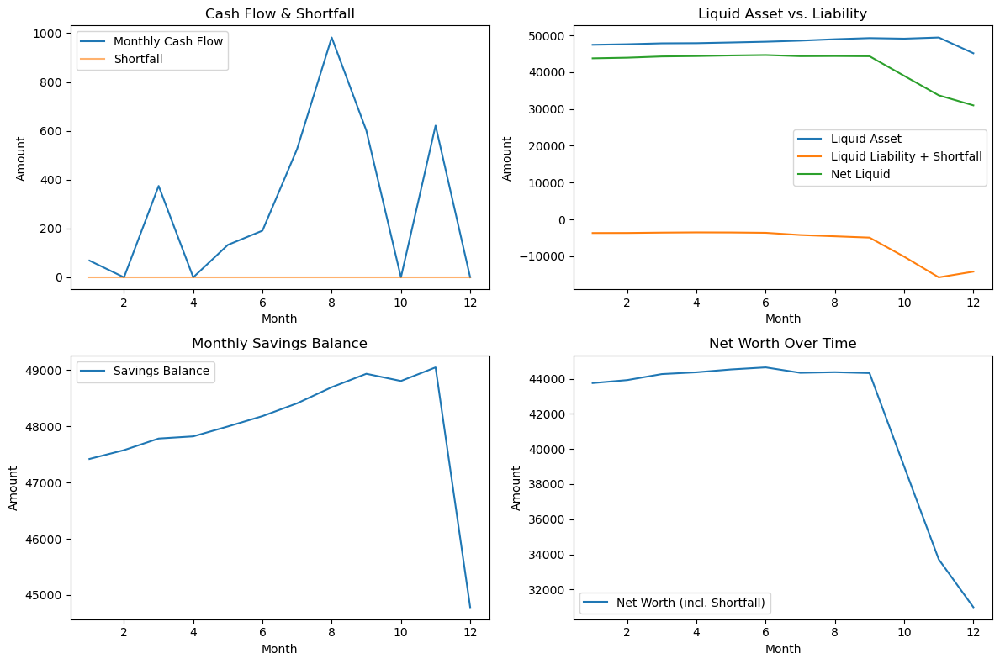

In [91]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ── Visualization for one sampled customer ─────────────────────────────────────

# Fix seed for reproducibility (optional)
# random.seed(321)

# Sample a random customer ID
#sample_id = random.randint(0, len(cash_flow_df) - 1)
sample_id = 14443  # or fix a specific ID

# Static info
info = df2.loc[sample_id, [
    "income", "age_group", "incQ", "region", "SOC_label", "tenure_label"
]]

print(f"Customer ID: {sample_id}")
print(f"Age group: {info['age_group']}")
print(f"Income: {info['income']}")
print(f"Income Decile (category): {info['incQ']}")
print(f"Region: {info['region']}")
print(f"SOC Occupational Code (SOC_label): {info['SOC_label']}")
print(f"Tenure Label: {info['tenure_label']}")

# New metric prints (space before these)
# month-12 liquid liability we calculated below
# total late days from df_new
# distress tallies from cash_flow_df
print()
# compute month-12 liquid liability (+ shortfall)
la  = asset_df.loc[sample_id, [f"liquid_asset_{m}"        for m in range(1,13)]].values
stl = liab_df .loc[sample_id, [f"total_liability_{m}"    for m in range(1,13)]].values
sf  = cash_flow_df.loc[sample_id, [f"shortfall_{m}"         for m in range(1,13)]].values
liquid_liab = -stl + sf
m12_liab    = liquid_liab[-1]
ratio       = - m12_liab / info["income"] if info["income"] != 0 else np.nan

print(f"Liquid liability to income ratio (month 12): {ratio:.2f}")
print(f"Total late days: {df_new.at[sample_id, 'total_late_days']}")
print(f"Months of financial distress: {cash_flow_df.at[sample_id, 'financial_distress']} / 12")
print(f"Months of severe financial distress: {cash_flow_df.at[sample_id, 'severe_financial_distress']} / 12")

# Prepare months
months = np.arange(1, 13)

# 1) Cash flow & shortfall
cash_flow = cash_flow_df.loc[sample_id, [f"new_cf_{m}"     for m in months]].values
shortfall = cash_flow_df.loc[sample_id, [f"shortfall_{m}"  for m in months]].values

# 2) Liquid assets & liabilities (including shortfall)
liquid_asset = asset_df.loc[sample_id, [f"liquid_asset_{m}" for m in months]].values
short_term_liab = liab_df.loc[sample_id, [f"total_liability_{m}" for m in months]].values
liquid_liab = - short_term_liab + shortfall      # incorporate shortfall
net_liquid  = liquid_asset + liquid_liab

# 3) Savings time series
savings = cash_flow_df.loc[sample_id, [f"savings_account_{m}" for m in months]].values

# 4) Net worth including shortfall
house_price  = asset_df.at[sample_id, "house_price"]
lt_liability = asset_df.loc[sample_id, [f"lt_liability_{m}" for m in months]].values
net_worth    = liquid_asset + house_price + liquid_liab - lt_liability

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()

# Plot 1: monthly cash flow & shortfall
axs[0].plot(months, cash_flow, label="Monthly Cash Flow")
axs[0].plot(months, shortfall, label="Shortfall", alpha=0.6)
axs[0].set_title("Cash Flow & Shortfall")
axs[0].set_xlabel("Month")
axs[0].set_ylabel("Amount")
axs[0].legend()

# Plot 2: liquid asset vs. (liquid liability + shortfall) and net liquid
axs[1].plot(months, liquid_asset, label="Liquid Asset")
axs[1].plot(months, liquid_liab, label="Liquid Liability + Shortfall")
axs[1].plot(months, net_liquid, label="Net Liquid")
axs[1].set_title("Liquid Asset vs. Liability")
axs[1].set_xlabel("Month")
axs[1].set_ylabel("Amount")
axs[1].legend()

# Plot 3: savings over time
axs[2].plot(months, savings, label="Savings Balance")
axs[2].set_title("Monthly Savings Balance")
axs[2].set_xlabel("Month")
axs[2].set_ylabel("Amount")
axs[2].legend()

# Plot 4: net worth including shortfall
axs[3].plot(months, net_worth, label="Net Worth (incl. Shortfall)")
axs[3].set_title("Net Worth Over Time")
axs[3].set_xlabel("Month")
axs[3].set_ylabel("Amount")
axs[3].legend()

plt.tight_layout()
plt.show()


Code to visualize temporal evolution of customer's financial position and financial health (comparing month 1 against month 12)

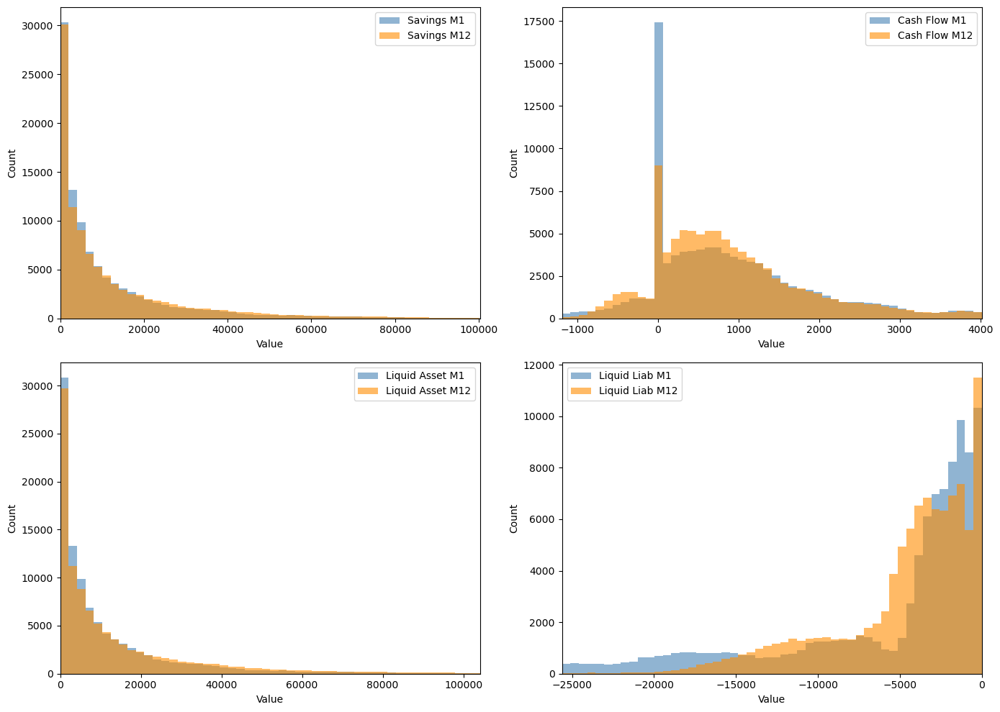

In [92]:
import numpy as np
import matplotlib.pyplot as plt

def filtered_hist(ax, data1, data2, label1, label2, percentiles=(1, 99), bins=50, colors=('steelblue','darkorange')):
    # Compute percentile cutoffs on the combined data
    low, high = np.percentile(np.concatenate([data1, data2]), percentiles)
    # Filter both series
    d1 = data1[(data1 >= low) & (data1 <= high)]
    d2 = data2[(data2 >= low) & (data2 <= high)]
    # Plot
    ax.hist(d1, bins=bins, alpha=0.6, label=label1, color=colors[0])
    ax.hist(d2, bins=bins, alpha=0.6, label=label2, color=colors[1])
    ax.set_xlim(low, high)
    ax.legend()

# Extract Series as before
sav1  = cash_flow_df['savings_account_1'].values
sav12 = cash_flow_df['savings_account_12'].values
cf1   = cash_flow_df['new_cf_1'].values
cf12  = cash_flow_df['new_cf_12'].values
la1   = asset_df['liquid_asset_1'].values
la12  = asset_df['liquid_asset_12'].values
ll1   = -liab_df['total_liability_1'].values  + cash_flow_df['shortfall_1'].values
ll12  = -liab_df['total_liability_12'].values + cash_flow_df['shortfall_12'].values

fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Savings
filtered_hist(axs[0,0], sav1, sav12,
              label1='Savings M1', label2='Savings M12')

# Cash flow
filtered_hist(axs[0,1], cf1, cf12,
              label1='Cash Flow M1', label2='Cash Flow M12')

# Liquid assets
filtered_hist(axs[1,0], la1, la12,
              label1='Liquid Asset M1', label2='Liquid Asset M12')

# Liquid liabilities
filtered_hist(axs[1,1], ll1, ll12,
              label1='Liquid Liab M1', label2='Liquid Liab M12')

for ax in axs.flatten():
    ax.set_xlabel("Value")
    ax.set_ylabel("Count")

plt.tight_layout()
plt.show()




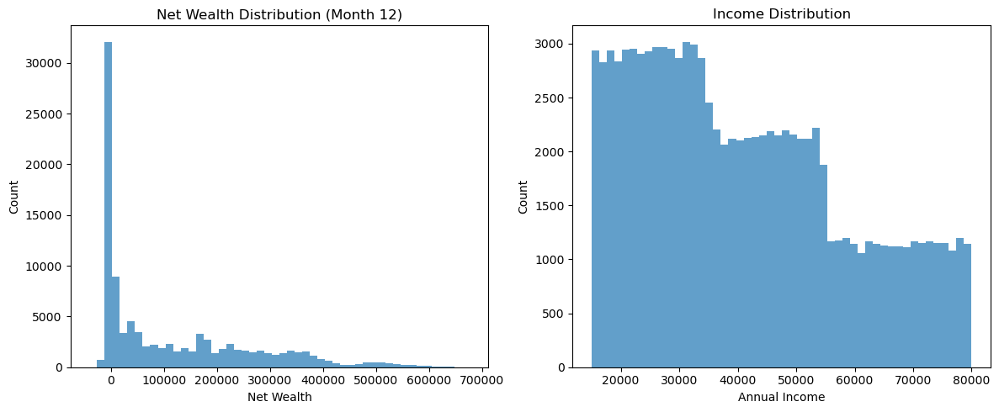

In [93]:
import matplotlib.pyplot as plt

# Compute net worth for month 12 across all customers
liquid_asset12    = asset_df['liquid_asset_12']
short_term_liab12 = liab_df['total_liability_12']
shortfall12       = cash_flow_df['shortfall_12']
liquid_liab12     = -short_term_liab12 + shortfall12
lt_liab12         = asset_df['lt_liability_12']
house_price       = asset_df['house_price']

net_worth = liquid_asset12 + house_price + liquid_liab12 - lt_liab12
income    = cash_flow_df['income']

# Plotting two histograms side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Net wealth distribution
axs[0].hist(net_worth.dropna(), bins=50, alpha=0.7)
axs[0].set_title('Net Wealth Distribution (Month 12)')
axs[0].set_xlabel('Net Wealth')
axs[0].set_ylabel('Count')

# Income distribution
axs[1].hist(income.dropna(), bins=50, alpha=0.7)
axs[1].set_title('Income Distribution')
axs[1].set_xlabel('Annual Income')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [94]:
import pandas as pd
import numpy as np
from scipy.stats import skew

# 1) Identify your monthly surplus columns
cf_cols = [col for col in cash_flow_df.columns if col.startswith("new_cf")]

# 2) Initialize features_df, aligned by index (or customer_id)
features_df = pd.DataFrame(index=cash_flow_df.index)

# --- Cash-Flow Health features ---

# 1. Avg. Monthly Surplus
features_df["avg_monthly_surplus"] = cash_flow_df[cf_cols].mean(axis=1)

# 2. Surplus volatility
# Keep signed CV (can be negative if mean < 0)
features_df["surplus_cv_signed"] = (
    cash_flow_df[cf_cols].std(axis=1)
    / features_df["avg_monthly_surplus"].replace(0, np.nan)
)

# Add absolute CV (always ≥ 0)
features_df["surplus_cv_abs"] = (
    cash_flow_df[cf_cols].std(axis=1)
    / features_df["avg_monthly_surplus"].abs().replace(0, np.nan)
)


# 3. Worst-Month Surplus (Min)
features_df["min_surplus"] = cash_flow_df[cf_cols].min(axis=1)

# 4. Pct. Months Negative Surplus
features_df["pct_months_negative_surplus"] = (
    (cash_flow_df[cf_cols] < 0).sum(axis=1) / len(cf_cols)
)

# 8. Surplus Skewness
features_df["surplus_skewness"] = cash_flow_df[cf_cols].apply(skew, axis=1)


# --- Expense Ratios from debt_df ---

# Assume:
#   debt_df["income"] is annual income
#   debt_df["housing_cost_per_month"] and debt_df["other_essential_spending"] are monthly

# Convert to annual expense before ratio, or equivalently compare to monthly income:
#   monthly_income = income / 12
#   so expense_ratio = monthly_expense / (income/12) = 12 * monthly_expense / income

features_df["housing_expense_ratio"] = (
    12 * debt_df["housing_cost_per_month"] / debt_df["income"]
)
features_df["essentials_expense_ratio"] = (
    12 * debt_df["other essential spending"] / debt_df["income"]
)

# (Optional) Fill or clip infinities if any incomes were zero:
features_df.replace([np.inf, -np.inf], np.nan, inplace=True)

features_df['surplus_to_income_ratio'] = features_df['avg_monthly_surplus'] * 12/debt_df['income']

# Now features_df has the six desired features:
print(features_df.columns)
# Index(['avg_monthly_surplus', 'surplus_cv', 'min_surplus',
#        'pct_months_negative_surplus', 'surplus_skewness',
#        'housing_expense_ratio', 'essentials_expense_ratio'],
#       dtype='object')


Index(['avg_monthly_surplus', 'surplus_cv_signed', 'surplus_cv_abs',
       'min_surplus', 'pct_months_negative_surplus', 'surplus_skewness',
       'housing_expense_ratio', 'essentials_expense_ratio',
       'surplus_to_income_ratio'],
      dtype='object')


In [95]:
# assume features_df already exists with your 8 cash-flow columns
# and cash_flow_df has savings_rate_1…_12 & investment_rate_1…_12

# 1. Define the monthly rate columns
rate_sav_cols = [f'savings_rate_{m}'    for m in range(1, 13)]
rate_inv_cols = [f'investment_rate_{m}' for m in range(1, 13)]

# 2. Compute **unconditional** average monthly rates (zeros kept)
avg_sav = cash_flow_df[rate_sav_cols].mean(axis=1)
avg_inv = cash_flow_df[rate_inv_cols].mean(axis=1)

# 3. Compute **unconditional** tilt: normalized difference of the averages
sav = avg_sav
inv = avg_inv
tilt_uncond = (inv - sav) / (inv + sav + 1e-9)  # small eps to avoid 0/0

# 4. Assign into features_df
features_df['avg_savings_rate_uncond']    = avg_sav
features_df['avg_investment_rate_uncond'] = avg_inv
features_df['sav_inv_tilt_uncond']        = tilt_uncond

# 5. Quick check
print(features_df[['avg_savings_rate_uncond', 
                   'avg_investment_rate_uncond', 
                   'sav_inv_tilt_uncond']].head())


   avg_savings_rate_uncond  avg_investment_rate_uncond  sav_inv_tilt_uncond
0                 0.014212                    0.018151             0.121718
1                 0.066606                    0.025699            -0.443176
2                 0.066850                    0.051068            -0.133846
3                 0.051583                    0.028578            -0.286990
4                 0.014792                    0.017692             0.089267


In [96]:
import numpy as np
import pandas as pd

# --- Assumptions ---
# cash_flow_df contains columns: 'net_debt_1' … 'net_debt_12'
# liab_df      contains columns: 
#    '<product>_liability_1' … '<product>_liability_12' for each product
#    and 'total_liability_1' … 'total_liability_12'
# cash_flow_df also has 'income' (annual)
# features_df already exists with your prior features

# 1. Debt change columns
net_debt_cols = [f'net_debt_{m}' for m in range(1, 13)]

# 2. Compute average net debt change
features_df['avg_net_debt_change'] = cash_flow_df[net_debt_cols].mean(axis=1)

# 3. Compute debt volatility (std of net debt change)
#    If a customer never draws (all zeros), std() → 0
features_df['debt_volatility'] = cash_flow_df[net_debt_cols].std(axis=1)

# 4. Compute max single‐month debt spike (max positive net debt)
features_df['max_debt_spike'] = cash_flow_df[net_debt_cols].max(axis=1)

# --- Debt‐to‐Income Ratio (end‐of‐period) ---
# 5. Use month‐12 total liability
features_df['debt_to_income'] = (
    liab_df['total_liability_12'] / cash_flow_df['income']
)

# --- High‐Interest Debt Ratio ---
# 6. compute monthly HI‐debt ratios, then average

hi_monthly = []
for m in range(1, 13):
    num = (
        liab_df[f'overdraft_liability_{m}'] +
        liab_df[f'credit_card_type1_liability_{m}'] +
        liab_df[f'credit_card_type2_liability_{m}'] 
    )
    den = (
        liab_df[f'overdraft_liability_{m}'] +
        liab_df[f'credit_card_type1_liability_{m}'] +
        liab_df[f'credit_card_type2_liability_{m}'] +
        liab_df[f'short_term_loan_liability_{m}']
    )
    # avoid 0/0 → treat no‐debt as 0% high‐int
    monthly_hi = np.where(den > 0, num / den, 0.0)
    hi_monthly.append(pd.Series(monthly_hi, index=liab_df.index))


# stack into DataFrame and average
hi_monthly_df = pd.concat(hi_monthly, axis=1)  # shape (n_customers, 12)
features_df['hi_int_debt_ratio'] = hi_monthly_df.mean(axis=1)

# --- End result: features_df now has the new debt dynamics features ---
print(features_df[[
    'avg_net_debt_change',
    'debt_volatility',
    'max_debt_spike',
    'debt_to_income',
    'hi_int_debt_ratio'
]].head())


   avg_net_debt_change  debt_volatility  max_debt_spike  debt_to_income  \
0          -416.315596       375.952455      397.312421        0.287415   
1            -0.937488       595.425075     1149.765868        0.039921   
2          -129.268333       447.798642        0.000000        0.000000   
3          1943.273193      3281.686044     9316.265490        0.460574   
4            20.611376       392.034900      666.666505        0.057758   

   hi_int_debt_ratio  
0           0.305122  
1           1.000000  
2           0.000000  
3           1.000000  
4           1.000000  


In [97]:
print(cash_flow_df.columns.to_list())

['income', 'housing_cost_per_month', 'other essential spending', 'total_debt_paid_1', 'total_debt_paid_2', 'total_debt_paid_3', 'total_debt_paid_4', 'total_debt_paid_5', 'total_debt_paid_6', 'total_debt_paid_7', 'total_debt_paid_8', 'total_debt_paid_9', 'total_debt_paid_10', 'total_debt_paid_11', 'total_debt_paid_12', 'initial_savings', 'income_decile', 'age_group', 'disc_split', 'net_debt_1', 'raw_cf_1', 'debt_for_essentials_1', 'debt_for_discretionary_1', 'new_cf_1', 'savings_account_1', 'savings_flow_1', 'investment_flow_1', 'savings_rate_1', 'investment_rate_1', 'net_debt_2', 'raw_cf_2', 'debt_for_essentials_2', 'debt_for_discretionary_2', 'new_cf_2', 'savings_account_2', 'savings_flow_2', 'investment_flow_2', 'savings_rate_2', 'investment_rate_2', 'net_debt_3', 'raw_cf_3', 'debt_for_essentials_3', 'debt_for_discretionary_3', 'new_cf_3', 'savings_account_3', 'savings_flow_3', 'investment_flow_3', 'savings_rate_3', 'investment_rate_3', 'net_debt_4', 'raw_cf_4', 'debt_for_essentials_

In [98]:
# assume features_df already exists and cash_flow_df has the disc_spend_* cols

disc_cols = [col for col in cash_flow_df.columns if col.startswith("disc_spend")]

# 1. Average discretionary spend **as a % of monthly income**
#    (income is annual, so monthly income = income/12)
monthly_inc = cash_flow_df['income'] / 12
features_df['avg_discretionary_spend'] = (
    (cash_flow_df[disc_cols].div(monthly_inc, axis=0))
    .mean(axis=1)
)

# 2. Discretionary spend volatility (std of absolute £ spend)
features_df['disc_spend_volatility'] = cash_flow_df[disc_cols].std(axis=1)

# 3. Pct. months with zero discretionary spend
features_df['pct_months_zero_discretionary'] = (
    (cash_flow_df[disc_cols] == 0).sum(axis=1) / 12.0
)

# Quick sanity check
print(features_df[
    ['avg_discretionary_spend','disc_spend_volatility','pct_months_zero_discretionary']
].head())


   avg_discretionary_spend  disc_spend_volatility  \
0                 0.317963             462.673995   
1                 0.483060             755.297446   
2                 0.212305             265.791042   
3                 0.847288            3020.915357   
4                 0.333475             359.540418   

   pct_months_zero_discretionary  
0                       0.000000  
1                       0.000000  
2                       0.083333  
3                       0.083333  
4                       0.000000  


In [99]:
import pandas as pd

# --- Assumes ---
# df2: DataFrame with columns ['tenure_label','age_group','SOC_label','region']
# features_df: existing DataFrame indexed by the same customer IDs/index

# 1. One-hot encode tenure_label, age_group, region
tenure_dummies = pd.get_dummies(df2['tenure_label'], prefix='tenure')
age_dummies    = pd.get_dummies(df2['age_group'],    prefix='age')
region_dummies = pd.get_dummies(df2['region'],       prefix='region')

# 2. Map SOC_label → broad occupational class
soc_map = {
    'Managers, directors and senior officials':        'Managerial',
    'Professional occupations':                       'Professional',
    'Associate professional and technical':            'Professional',
    'Administrative and secretarial':                  'Clerical',
    'Skilled trades':                                  'SkilledTrade',
    'Caring, leisure and other services':              'Service',
    'Sales and customer services':                     'Service',
    'Process, plant and machine operatives':           'Operative',
    'Elementary occupations':                          'Elementary'
}
df2['occup_class'] = df2['SOC_label'].map(soc_map)

# 3. One-hot encode that new occupational class
occup_dummies = pd.get_dummies(df2['occup_class'], prefix='occup')

# 4. Concatenate all new dummies to features_df
features_df = pd.concat([
    features_df,
    tenure_dummies,
    age_dummies,
    region_dummies,
    occup_dummies
], axis=1)

# 5. (Optional) If you prefer ordinal age instead of one-hot, you could map age_groups:
# age_order = {
#     'Aged 24 years and under':   0,
#     'Aged 25 to 34 years':       1,
#     'Aged 35 to 49 years':       2,
#     'Aged 50 to 64 years':       3,
#     'Aged 65 years and over':    4,
# }
# features_df['age_group_ord'] = df2['age_group'].map(age_order)

# 6. Quick sanity check
print(features_df.filter(like='tenure_').head())
print(features_df.filter(like='age_').head())
print(features_df.filter(like='region_').head())
print(features_df.filter(like='occup_').head())


   tenure_Mortgage  tenure_Own outright  tenure_Renter
0            False                 True          False
1            False                 True          False
2             True                False          False
3            False                False           True
4             True                False          False
   age_Aged 24 years and under  age_Aged 25 to 34 years  \
0                        False                    False   
1                        False                    False   
2                        False                    False   
3                        False                    False   
4                        False                     True   

   age_Aged 35 to 49 years  age_Aged 50 to 64 years  \
0                     True                    False   
1                    False                    False   
2                    False                     True   
3                     True                    False   
4                    False              

In [100]:
print(df_new.columns.to_list())

['customer_id', 'income', 'overdraft', 'overdraft_credit_limit', 'overdraft_interest_rate', 'credit_card_type1', 'credit_card_type1_credit_limit', 'credit_card_type1_interest_rate', 'credit_card_type1_initial_balance', 'credit_card_type2', 'credit_card_type2_credit_limit', 'credit_card_type2_interest_rate', 'credit_card_type2_initial_balance', 'short_term_loan', 'short_term_loan_borrowing_amount', 'short_term_loan_interest_rate', 'short_term_loan_initial_balance', 'STL_monthly_repayment', 'life_changing_events', 'financial_health_status_orig', 'financial_health_status', 'credit_card_type1_new_balance_1', 'credit_card_type1_new_balance_2', 'credit_card_type1_new_balance_3', 'credit_card_type1_new_balance_4', 'credit_card_type1_new_balance_5', 'credit_card_type1_new_balance_6', 'credit_card_type1_new_balance_7', 'credit_card_type1_new_balance_8', 'credit_card_type1_new_balance_9', 'credit_card_type1_new_balance_10', 'credit_card_type1_new_balance_11', 'credit_card_type1_new_balance_12', 

In [101]:
import numpy as np
import pandas as pd

# --- Assumptions ---
# df_new has, for each product in:
products = ['credit_card_type1','credit_card_type2','overdraft','short_term_loan']
#  - payment flags:           f'{prod}_payment_{m}'    (0=on-time or no debt, 1=late)
#  - days past due columns:   f'{prod}_late_days_{m}'  (0 if on-time)

# months 1..12
months = range(1, 13)

# 1) Build per-month aggregates
# --------------------------------------------------

# 1a) On‐time flag per month: True if *all* products on time (i.e. all flags == 0)
on_time_month = pd.DataFrame(
    {m: (df_new[[f'{p}_payment_{m}' for p in products]] == 0).all(axis=1)
          for m in months}
)

# 1b) Average days past due per product-month: flatten all product-month days, treating NaNs as 0
days_cols = [f'{p}_late_days_{m}' for p in products for m in months]
days_past = df_new[days_cols].fillna(0)

# 1c) For monthly‐level severity & serious delinquency, compute per‐month sums & flags
monthly_days_sum = pd.DataFrame(
    {m: df_new[[f'{p}_late_days_{m}' for p in products]].fillna(0).sum(axis=1)
     for m in months}
)
monthly_serious = pd.DataFrame(
    {m: (df_new[[f'{p}_late_days_{m}' for p in products]].fillna(0) > 30).any(axis=1)
     for m in months}
)

# 2) Compute features
# --------------------------------------------------

# 2.1 On-Time Payment Rate = % of months all payments on-time
features_df['on_time_payment_rate'] = on_time_month.sum(axis=1) / 12.0

# 2.2 Average Days Past Due = mean over *all* product-month days (zeros included)
features_df['avg_days_past_due'] = days_past.mean(axis=1)

# 2.3 Max Days Past Due = max over all product-month days
features_df['max_days_past_due'] = days_past.max(axis=1)

# 2.4 Delinquency Severity Index = average monthly sum of days past due
features_df['delinq_severity_index'] = monthly_days_sum.mean(axis=1)

# 2.5 % of Serious Delinquencies = fraction of months with any >30-day late
features_df['pct_serious_delinquencies'] = monthly_serious.sum(axis=1) / 12.0

# 2.6 Trend in Days Past Due = slope of linear fit on monthly average days
#     First compute monthly average days (sum across products ÷ count of products)
monthly_days_avg = monthly_days_sum / len(products)
def slope_of_series(row):
    # x = 1..12, y = row[1..12]
    x = np.arange(1, 13)
    y = row.values
    # if all y are zero, slope=0
    if np.all(y == 0):
        return 0.0
    # linear regression slope
    return np.polyfit(x, y, 1)[0]

features_df['days_past_due_trend'] = monthly_days_avg.apply(slope_of_series, axis=1)

# 3) Quick sanity check
print(features_df[[
    'on_time_payment_rate',
    'avg_days_past_due',
    'max_days_past_due',
    'delinq_severity_index',
    'pct_serious_delinquencies',
    'days_past_due_trend'
]].head())


   on_time_payment_rate  avg_days_past_due  max_days_past_due  \
0              0.916667           0.020833           1.000000   
1              0.916667           0.020833           1.000000   
2              0.916667           0.020833           1.000000   
3              0.583333           6.533863          74.946087   
4              1.000000           0.000000           0.000000   

   delinq_severity_index  pct_serious_delinquencies  days_past_due_trend  
0               0.083333                   0.000000             0.004371  
1               0.083333                   0.000000            -0.006119  
2               0.083333                   0.000000             0.002622  
3              26.135454                   0.333333             1.926764  
4               0.000000                   0.000000             0.000000  


In [102]:
features_df

,avg_monthly_surplus,surplus_cv_signed,surplus_cv_abs,min_surplus,pct_months_negative_surplus,surplus_skewness,housing_expense_ratio,essentials_expense_ratio,surplus_to_income_ratio,avg_savings_rate_uncond,...,occup_Operative,occup_Professional,occup_Service,occup_SkilledTrade,on_time_payment_rate,avg_days_past_due,max_days_past_due,delinq_severity_index,pct_serious_delinquencies,days_past_due_trend
0,1263.401602,0.321860,0.321860,573.532056,0.00,-0.030319,0.000000,0.566448,0.319932,0.014212,...,False,True,False,False,0.916667,0.020833,1.000000,0.083333,0.000000,0.004371
1,2699.559727,0.211351,0.211351,1344.877636,0.00,-1.302331,0.000000,0.485938,0.486575,0.066606,...,False,False,False,False,0.916667,0.020833,1.000000,0.083333,0.000000,-0.006119
2,674.922840,0.451947,0.451947,0.000000,0.00,-0.954728,0.195703,0.549952,0.243647,0.066850,...,False,True,False,False,0.916667,0.020833,1.000000,0.083333,0.000000,0.002622
3,834.771986,0.405217,0.405217,0.000000,0.00,-1.067862,0.194871,0.530767,0.241209,0.051583,...,False,True,False,False,0.583333,6.533863,74.946087,26.135454,0.333333,1.926764
4,1431.480871,0.157987,0.157987,1043.552609,0.00,0.026954,0.150307,0.548067,0.305784,0.014792,...,False,True,False,False,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,742.988377,0.360376,0.360376,0.000000,0.00,-1.884265,0.197121,0.483204,0.277962,0.045323,...,False,False,False,True,0.750000,3.541483,99.528537,14.165933,0.166667,0.927459
99996,1212.880767,0.107663,0.107663,940.238334,0.00,-0.695714,0.246667,0.424085,0.328640,0.168379,...,False,True,False,False,0.833333,0.743301,18.200880,2.973202,0.000000,0.337817
99997,1872.090691,0.168541,0.168541,1312.212804,0.00,-0.209147,0.000000,0.581484,0.433959,0.061851,...,False,True,False,False,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
99998,-364.011123,-0.559324,0.559324,-790.568341,1.00,-0.582710,0.409879,0.954264,-0.272261,0.000000,...,False,True,False,False,0.833333,0.313945,13.069360,1.255780,0.000000,-0.036021


In [103]:
import numpy as np
import pandas as pd

# --- Assumptions ---
# liab_df has columns:
#   '{product}_liab_{m}' for m in 1..12, plus 'total_liability_{m}'
# df_new has columns:
#   '{product}_credit_limit' for each product, and 'income' (annual)
# features_df already exists and aligns by index with liab_df & df_new

products = ['credit_card_type1', 'credit_card_type2', 'overdraft']
months = range(1, 13)

# 1. Per‐product monthly utilization ratios
#    utilization_m = balance_m / credit_limit
#    we’ll treat credit_limit == 0 as NaN (so they don’t contribute to mean/std)
util_monthly = {}
for prod in products:
    limit = df_new[f'{prod}_credit_limit']
    # build a DataFrame of monthly utilizations for this product
    util_df = pd.DataFrame({
        m: liab_df[f'{prod}_liability_{m}'] / limit.replace(0, np.nan)
        for m in months
    })
    util_monthly[prod] = util_df

# 2. Compute per‐product summary stats, and collect into features_df
for prod, util_df in util_monthly.items():
    features_df[f'{prod}_util_mean'] = util_df.mean(axis=1, skipna=True).fillna(0)
    features_df[f'{prod}_util_max']  = util_df.max(axis=1, skipna=True).fillna(0)
    features_df[f'{prod}_util_std']  = util_df.std(axis=1, skipna=True).fillna(0)

# 3. Total Available Credit
credit_limits = [f'{prod}_credit_limit' for prod in products]
features_df['total_available_credit'] = df_new[credit_limits].sum(axis=1)

# 4. Credit Concentration Ratio
#    largest single limit / total_available_credit
features_df['max_credit_limit'] = df_new[credit_limits].max(axis=1)
features_df['credit_concentration_ratio'] = (
    features_df['max_credit_limit'] 
    / features_df['total_available_credit'].replace(0, np.nan)
).fillna(0)

# 5. Credit‐to‐Income Capacity
features_df['credit_to_income_capacity'] = (
    features_df['total_available_credit'] 
    / df_new['income'].replace(0, np.nan)
).fillna(0)

# 6. Clean up auxiliary column
features_df.drop(columns=['max_credit_limit'], inplace=True)

# --- Quick sanity check ---
print(features_df[[
    # per-product means
    'credit_card_type1_util_mean',
    'credit_card_type2_util_mean',
    'overdraft_util_mean',
    #'short_term_loan_util_mean',
    # per-product maxes
    'credit_card_type1_util_max',
    # total and ratios
    'total_available_credit',
    'credit_concentration_ratio',
    'credit_to_income_capacity'
]].head())


   credit_card_type1_util_mean  credit_card_type2_util_mean  \
0                     0.262739                     0.313409   
1                     0.157097                     0.127922   
2                     0.000000                     0.000000   
3                     0.403403                     0.573672   
4                     0.137930                     0.223009   

   overdraft_util_mean  credit_card_type1_util_max  total_available_credit  \
0             0.022196                    0.316097                18951.39   
1             0.065878                    0.176440                23967.74   
2             0.000000                    0.000000                11966.76   
3             0.000000                    0.593257                15229.40   
4             0.068113                    0.152701                20223.41   

   credit_concentration_ratio  credit_to_income_capacity  
0                    0.474899                   0.399923  
1                    0.416667     

In [104]:
import numpy as np
import pandas as pd

# --- Assumptions ---
# features_df, cash_flow_df, liab_df, df_new share the same index
# Revolving products (no short_term_loan):
products = ['credit_card_type1', 'credit_card_type2', 'overdraft']
months   = range(1, 13)

# 1) # of Active Credit Products
limits = df_new[[f'{p}_credit_limit' for p in products]]
features_df['n_active_credit_products'] = (limits > 0).sum(axis=1)

# 2) Credit Mix Diversity (Herfindahl index)
total_limit = limits.sum(axis=1).replace(0, np.nan)
shares = limits.div(total_limit, axis=0).fillna(0)
features_df['credit_mix_herfindahl'] = (shares**2).sum(axis=1)

# 3) Overall average utilization across the three products
#    and prepare for the util_vs_surplus correlation
#    Monthly revolving liability sum
rev_liab = pd.DataFrame({
    m: liab_df[[f'{p}_liability_{m}' for p in products]].sum(axis=1)
    for m in months
})
#    Total revolving credit (constant)
total_rev_credit = total_limit
#    Monthly utilization rate
util_total = rev_liab.div(total_rev_credit, axis=0).fillna(0)
#    Avg utilization
features_df['avg_util_overall'] = util_total.mean(axis=1)

# 4) Utilization vs. Surplus Correlation
surplus_df = pd.DataFrame({m: cash_flow_df[f'new_cf_{m}'] for m in months})
def pearson_corr(x, y):
    return 0.0 if x.nunique()<=1 or y.nunique()<=1 else x.corr(y)
features_df['util_surplus_corr'] = [
    pearson_corr(util_total.loc[idx], surplus_df.loc[idx])
    for idx in features_df.index
]

# 5) Delinquency vs. Discretionary Spend Correlation
days_past = pd.DataFrame({
    m: df_new[[f'{p}_late_days_{m}' for p in products]].fillna(0).sum(axis=1)
    for m in months
})
disc_spend = pd.DataFrame({m: cash_flow_df[f'disc_spend_{m}'] for m in months})
features_df['delinq_disc_spend_corr'] = [
    pearson_corr(days_past.loc[idx], disc_spend.loc[idx])
    for idx in features_df.index
]

# 6) Payment Timeliness vs. Net Debt Δ Correlation
on_time_month = pd.DataFrame({
    m: (df_new[[f'{p}_payment_{m}' for p in products]] == 0).all(axis=1)
    for m in months
}).astype(int)
net_debt_df = pd.DataFrame({m: cash_flow_df[f'net_debt_{m}'] for m in months})
features_df['timely_vs_netdebt_corr'] = [
    pearson_corr(on_time_month.loc[idx], net_debt_df.loc[idx])
    for idx in features_df.index
]

# 7) Flags
features_df['chronic_revolver_flag'] = (
    (features_df['avg_util_overall'] > 0.60) &
    (on_time_month.mean(axis=1) < 0.90)
).astype(int)

features_df['high_limit_low_util_flag'] = (
    (features_df['total_available_credit'] / df_new['income'] > 0.3) &
    (features_df['avg_util_overall'] < 0.30)
).astype(int)

# --- Sanity check ---
print(features_df[[
    'n_active_credit_products',
    'credit_mix_herfindahl',
    'avg_util_overall',
    'util_surplus_corr',
    'delinq_disc_spend_corr',
    'timely_vs_netdebt_corr',
    'chronic_revolver_flag',
    'high_limit_low_util_flag'
]].head())


   n_active_credit_products  credit_mix_herfindahl  avg_util_overall  \
0                         3               0.388717          0.250714   
1                         3               0.375000          0.129738   
2                         3               0.375000          0.000000   
3                         2               0.516548          0.504025   
4                         3               0.375000          0.161743   

   util_surplus_corr  delinq_disc_spend_corr  timely_vs_netdebt_corr  \
0           0.298066               -0.086093                0.206719   
1          -0.087533               -0.052091                0.310262   
2           0.000000                0.066446               -0.090909   
3          -0.092557                0.941458               -0.795156   
4           0.177927                0.000000                0.000000   

   chronic_revolver_flag  high_limit_low_util_flag  
0                      0                         1  
1                      0    

In [105]:
(features_df['chronic_revolver_flag']==1).sum()

601

In [106]:
features_df['income']=df2['income']
features_df['income_quintle']=df2['income quintile']
features_df['initial_savings']=debt_df['initial_savings']
features_df['house_price']=asset_df['house_price']
features_df['total_liab_end']=asset_df['lt_liability_12']+liab_df['total_liability_12']
features_df['financial_distress'] = cash_flow_df['financial_distress']
features_df['severe_financial_distress']=cash_flow_df['severe_financial_distress']
features_df['disc_split']=cash_flow_df['disc_split']

In [107]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm

# tqdm setup (use `from tqdm.notebook import tqdm` if in a Jupyter notebook)
tqdm.pandas(desc="Progress")

# --- Step 1: Infer binary vs. numeric ---
binary_cols = [
    col for col in features_df.columns
    if set(features_df[col].dropna().unique()).issubset({0, 1})
]
numeric_cols = [col for col in features_df.columns if col not in binary_cols]

# --- Step 2: Scale numeric features ---
scaler = StandardScaler()
scaled_num = pd.DataFrame(
    scaler.fit_transform(features_df[numeric_cols]),
    index=features_df.index,
    columns=numeric_cols
)
scaled = pd.concat([scaled_num, features_df[binary_cols]], axis=1)

# --- Step 3: Variance threshold on numeric ---
vt = VarianceThreshold(threshold=0.01)
vt.fit(scaled[numeric_cols])
keep_num = [c for c, keep in zip(numeric_cols, vt.get_support()) if keep]
reduced = pd.concat([scaled[keep_num], scaled[binary_cols]], axis=1)

# --- Step 4: Drop highly correlated numeric features ---
corr = reduced[keep_num].corr().abs()
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
drop_corr = [col for col in upper.columns if (upper[col] > 0.9).any()]
pruned = reduced.drop(columns=drop_corr)

# --- Step 5: Fill NaNs in numeric columns ---
numeric_pruned = [c for c in keep_num if c not in drop_corr]
pruned[numeric_pruned] = pruned[numeric_pruned].fillna(0)

# --- Step 6: PCA-driven selection of top features ---
pca = PCA(n_components=0.8, svd_solver='full', random_state=42)
pca.fit(pruned[numeric_pruned])
loadings = pd.DataFrame(
    pca.components_.T,
    index=numeric_pruned,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)]
)

top_feats = set()
for pc in tqdm(loadings.columns, desc="Selecting top PCA features"):
    top_feats.update(loadings[pc].abs().nlargest(2).index)

# --- Step 7: Final feature list ---
final_features = list(top_feats) + binary_cols
features_final = pruned[final_features]

# --- Step 8: Evaluate KMeans from k=2 to k=10 ---
results = []
for k in tqdm(range(2, 11), desc="Evaluating KMeans"):
    km = KMeans(n_clusters=k, random_state=42).fit(features_final)
    sil = silhouette_score(features_final, km.labels_)
    results.append({'k': k, 'inertia': km.inertia_, 'silhouette': sil})

results_df = pd.DataFrame(results)
print(results_df)


Evaluating KMeans: 100%|██████████████████████████| 9/9 [10:36<00:00, 70.76s/it]

    k       inertia  silhouette
0   2  2.083674e+06    0.129397
1   3  1.842344e+06    0.147016
2   4  1.710413e+06    0.126307
3   5  1.628695e+06    0.116487
4   6  1.565177e+06    0.113341
5   7  1.468473e+06    0.113652
6   8  1.399539e+06    0.118666
7   9  1.328878e+06    0.125357
8  10  1.294151e+06    0.129322


In [108]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm

# tqdm setup (use `from tqdm.notebook import tqdm` if in a Jupyter notebook)
tqdm.pandas(desc="Progress")

# Identify binary vs. numeric features
binary_cols = [
    col for col in features_df.columns
    if set(features_df[col].dropna().unique()).issubset({0, 1})
]
numeric_cols = [col for col in features_df.columns if col not in binary_cols]

# Scale numeric features
scaler = StandardScaler()
scaled_num = pd.DataFrame(
    scaler.fit_transform(features_df[numeric_cols]),
    index=features_df.index,
    columns=numeric_cols
)
scaled = pd.concat([scaled_num, features_df[binary_cols]], axis=1)

# Remove low-variance numerics
t = 0.01
vt = VarianceThreshold(threshold=t)
vt.fit(scaled[numeric_cols])
keep_num = [c for c, keep in zip(numeric_cols, vt.get_support()) if keep]
reduced = pd.concat([scaled[keep_num], scaled[binary_cols]], axis=1)

# Drop highly correlated numeric features
corr = reduced[keep_num].corr().abs()
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
drop_corr = [col for col in upper.columns if (upper[col] > 0.9).any()]
pruned = reduced.drop(columns=drop_corr)

# Prepare final numeric list and fill NaNs
numeric_pruned = [c for c in keep_num if c not in drop_corr]
pruned[numeric_pruned] = pruned[numeric_pruned].fillna(0)

# Grid search over PCA variance explained
pca_variances = [0.7, 0.8, 0.9]
all_results = []

for var in tqdm(pca_variances):
    # PCA for given explained variance
    pca = PCA(n_components=var, svd_solver='full', random_state=42)
    pca.fit(pruned[numeric_pruned])
    loadings = pd.DataFrame(
        pca.components_.T,
        index=numeric_pruned,
        columns=[f'PC{i+1}' for i in range(pca.n_components_)]
    )

    # Select top 2 features per PC
    top_feats = set()
    for pc in loadings.columns:
        top_feats.update(loadings[pc].abs().nlargest(2).index)

    # Combine with binary features
    final_features = list(top_feats) + binary_cols
    features_final = pruned[final_features]

    # KMeans evaluation for k=2 to 10
    for k in tqdm(range(2, 11)):
        km = KMeans(n_clusters=k, random_state=42).fit(features_final)
        sil = silhouette_score(features_final, km.labels_)
        all_results.append({
            'pca_variance': var,
            'k': k,
            'inertia': km.inertia_,
            'silhouette': sil
        })

# Compile results into DataFrame
results_df = pd.DataFrame(all_results)
print(results_df)


100%|████████████████████████████████████████████| 3/3 [27:45<00:00, 555.11s/it]

    pca_variance   k       inertia  silhouette
0            0.7   2  1.620315e+06    0.150902
1            0.7   3  1.421520e+06    0.160907
2            0.7   4  1.318340e+06    0.124573
3            0.7   5  1.199593e+06    0.142033
4            0.7   6  1.132368e+06    0.146204
5            0.7   7  1.052683e+06    0.155785
6            0.7   8  1.009254e+06    0.159644
7            0.7   9  9.836929e+05    0.146775
8            0.7  10  9.580333e+05    0.145414
9            0.8   2  2.083674e+06    0.129397
10           0.8   3  1.842344e+06    0.147016
11           0.8   4  1.710413e+06    0.126307
12           0.8   5  1.628695e+06    0.116487
13           0.8   6  1.565177e+06    0.113341
14           0.8   7  1.468473e+06    0.113652
15           0.8   8  1.399539e+06    0.118666
16           0.8   9  1.328878e+06    0.125357
17           0.8  10  1.294151e+06    0.129322
18           0.9   2  2.425668e+06    0.197822
19           0.9   3  2.097650e+06    0.142538
20           

In [109]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from tqdm import tqdm

# Function to evaluate clustering algorithms on a single dataset sample
def evaluate_once(data, k_list, dbscan_params):
    results = []
    for k in k_list:
        # KMeans
        try:
            km = KMeans(n_clusters=k, random_state=42).fit(data)
            sil = silhouette_score(data, km.labels_)
        except:
            sil = np.nan
        results.append({'model': 'KMeans', 'k': k, 'silhouette': sil})
        # Agglomerative
        try:
            agg = AgglomerativeClustering(n_clusters=k, linkage='ward').fit(data)
            sil = silhouette_score(data, agg.labels_)
        except:
            sil = np.nan
        results.append({'model': 'Agglomerative', 'k': k, 'silhouette': sil})
        # GMM
        try:
            gmm = GaussianMixture(n_components=k, random_state=42).fit(data)
            sil = silhouette_score(data, gmm.predict(data))
        except:
            sil = np.nan
        results.append({'model': 'GMM', 'k': k, 'silhouette': sil})
        # Spectral
        try:
            sc = SpectralClustering(n_clusters=k, affinity='nearest_neighbors', random_state=42)
            sil = silhouette_score(data, sc.fit_predict(data))
        except:
            sil = np.nan
        results.append({'model': 'Spectral', 'k': k, 'silhouette': sil})

    # DBSCAN (single run)
    eps, min_samples = dbscan_params
    try:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(data)
        labels = db.labels_
        # remove noise label if present
        if -1 in labels:
            mask = labels != -1
            sil = silhouette_score(data[mask], labels[mask])
        else:
            sil = silhouette_score(data, labels)
    except:
        sil = np.nan
    results.append({'model': 'DBSCAN', 'k': 'n/a', 'silhouette': sil})

    return pd.DataFrame(results)

# Main: repeat sampling and evaluation
n_runs = 10
k_list = list(range(2, 11))
dbscan_params = (0.5, 5)
all_runs = []

for run in tqdm(range(n_runs), desc="Overall runs"):
    sampled = features_final.sample(n=10000, random_state=run)
    df_run = evaluate_once(sampled, k_list, dbscan_params)
    df_run['run'] = run + 1
    all_runs.append(df_run)

# Combine and compute average silhouette score
df_all = pd.concat(all_runs, ignore_index=True)
summary = (
    df_all
    .groupby(['model', 'k'], as_index=False)
    .agg(mean_silhouette=('silhouette', 'mean'))
    .sort_values('mean_silhouette', ascending=False)
)

print(summary)


Overall runs: 100%|████████████████████████████| 10/10 [21:20<00:00, 128.07s/it]

            model    k  mean_silhouette
0   Agglomerative    2         0.368301
20         KMeans    3         0.138656
19         KMeans    2         0.137240
21         KMeans    4         0.119445
25         KMeans    8         0.113536
1   Agglomerative    3         0.113051
24         KMeans    7         0.112691
26         KMeans    9         0.112266
23         KMeans    6         0.110510
22         KMeans    5         0.110286
27         KMeans   10         0.109831
2   Agglomerative    4         0.100437
28       Spectral    2         0.093496
10            GMM    2         0.091931
29       Spectral    3         0.091851
4   Agglomerative    6         0.091838
7   Agglomerative    9         0.090095
3   Agglomerative    5         0.088824
8   Agglomerative   10         0.088701
5   Agglomerative    7         0.088175
6   Agglomerative    8         0.087319
30       Spectral    4         0.086610
11            GMM    3         0.078621
34       Spectral    8         0.071310


In [110]:
db = DBSCAN(eps=1, min_samples=5).fit(features_final)
labels = db.labels_
print(np.unique(labels, return_counts=True))


(array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
       103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
       116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
       129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
       142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
       155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
       168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 1

In [111]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from tqdm import tqdm

# Function to evaluate clustering algorithms on a single dataset sample
def evaluate_once(data, k_list, dbscan_params):
    results = []
#    for k in k_list:
#        # KMeans
#        try:
#            km = KMeans(n_clusters=k, random_state=42).fit(data)
#            sil = silhouette_score(data, km.labels_)
#        except:
#            sil = np.nan
#        results.append({'model': 'KMeans', 'k': k, 'silhouette': sil})
#        # Agglomerative
#        try:
#            agg = AgglomerativeClustering(n_clusters=k, linkage='ward').fit(data)
#            sil = silhouette_score(data, agg.labels_)
#        except:
#            sil = np.nan
#        results.append({'model': 'Agglomerative', 'k': k, 'silhouette': sil})
#        # GMM
#        try:
#            gmm = GaussianMixture(n_components=k, random_state=42).fit(data)
#            sil = silhouette_score(data, gmm.predict(data))
#        except:
#            sil = np.nan
#        results.append({'model': 'GMM', 'k': k, 'silhouette': sil})
#        # Spectral
#        try:
#            sc = SpectralClustering(n_clusters=k, affinity='nearest_neighbors', random_state=42)
#            sil = silhouette_score(data, sc.fit_predict(data))
#        except:
#            sil = np.nan
#        results.append({'model': 'Spectral', 'k': k, 'silhouette': sil})

    # DBSCAN (single run)
    eps, min_samples = dbscan_params
    try:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(data)
        labels = db.labels_
        # remove noise label if present
        if -1 in labels:
            mask = labels != -1
            sil = silhouette_score(data[mask], labels[mask])
        else:
            sil = silhouette_score(data, labels)
    except:
        sil = np.nan
    results.append({'model': 'DBSCAN', 'k': 'n/a', 'silhouette': sil})

    return pd.DataFrame(results)

# Main: repeat sampling and evaluation
n_runs = 10
k_list = list(range(2, 11))
dbscan_params = (1.4, 5)
all_runs = []

for run in tqdm(range(n_runs), desc="Overall runs"):
    sampled = features_final.sample(n=10000, random_state=run)
    df_run = evaluate_once(sampled, k_list, dbscan_params)
    df_run['run'] = run + 1
    all_runs.append(df_run)

# Combine and compute average silhouette score
df_all = pd.concat(all_runs, ignore_index=True)
summary = (
    df_all
    .groupby(['model', 'k'], as_index=False)
    .agg(mean_silhouette=('silhouette', 'mean'))
    .sort_values('mean_silhouette', ascending=False)
)

print(summary)


Overall runs: 100%|█████████████████████████████| 10/10 [00:01<00:00,  7.11it/s]

    model    k  mean_silhouette
0  DBSCAN  n/a         0.576408


In [112]:
from sklearn.cluster import DBSCAN

# 1. Fit DBSCAN on your full feature set
db = DBSCAN(eps=1.4, min_samples=5).fit(features_final)

# 3. Inspect
print(db.labels_)


[-1 -1 -1 ... -1 -1 -1]


In [113]:
A = pd.DataFrame(db.labels_)
print(A.value_counts())
A.describe()

0   
-1      86459
 10       737
 5        518
 2        487
 64       421
        ...  
 469        3
 707        3
 671        3
 628        2
 700        2
Name: count, Length: 722, dtype: int64


,0
count,100000.000000
mean,23.627670
std,94.669899
min,-1.000000
25%,-1.000000
50%,-1.000000
75%,-1.000000
max,720.000000


In [114]:
features_final

,surplus_skewness,financial_distress,sav_inv_tilt_uncond,util_surplus_corr,credit_card_type2_util_mean,income,avg_days_past_due,essentials_expense_ratio,house_price,housing_expense_ratio,...,region_Yorkshire & Humber,occup_Clerical,occup_Elementary,occup_Managerial,occup_Operative,occup_Professional,occup_Service,occup_SkilledTrade,chronic_revolver_flag,high_limit_low_util_flag
0,0.352797,-0.476411,1.055894,0.423367,1.472512,0.363585,-0.296496,0.096954,0.635815,-1.653681,...,False,False,False,False,False,True,False,False,0,1
1,-0.908596,-0.476411,-0.743874,-0.780984,0.124016,1.450200,-0.296496,-0.404473,2.230800,-1.653681,...,False,False,False,True,False,False,False,False,0,1
2,-0.563895,0.120693,0.241662,-0.507590,-0.805984,-0.437472,-0.296496,-0.005785,1.062051,0.197275,...,False,False,False,False,False,True,False,False,0,1
3,-0.676084,0.120693,-0.246259,-0.796676,3.364640,0.031860,3.149158,-0.125275,-0.955734,0.189409,...,False,False,False,False,False,True,False,False,0,0
4,0.409591,-0.476411,0.952506,0.048135,0.815303,0.861242,-0.307518,-0.017527,0.483792,-0.232083,...,False,False,False,False,False,True,False,False,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,-1.485670,0.120693,-1.126026,-2.078027,-0.805984,-0.503452,1.566069,-0.421501,-0.955734,0.210684,...,False,False,False,False,False,False,False,True,0,0
99996,-0.307043,-0.476411,0.427639,0.294546,0.731583,0.188026,0.085718,-0.789705,-0.955734,0.679290,...,False,False,False,False,False,True,False,False,0,1
99997,0.175461,-0.476411,1.649003,-0.310295,-0.805984,0.611618,-0.307518,0.190601,1.498804,-1.653681,...,False,False,False,False,False,True,False,False,0,0
99998,-0.194983,-0.476411,0.668097,-1.079681,-0.805984,-1.411265,-0.141428,2.512323,-0.955734,2.222940,...,False,False,False,False,False,True,False,False,0,0


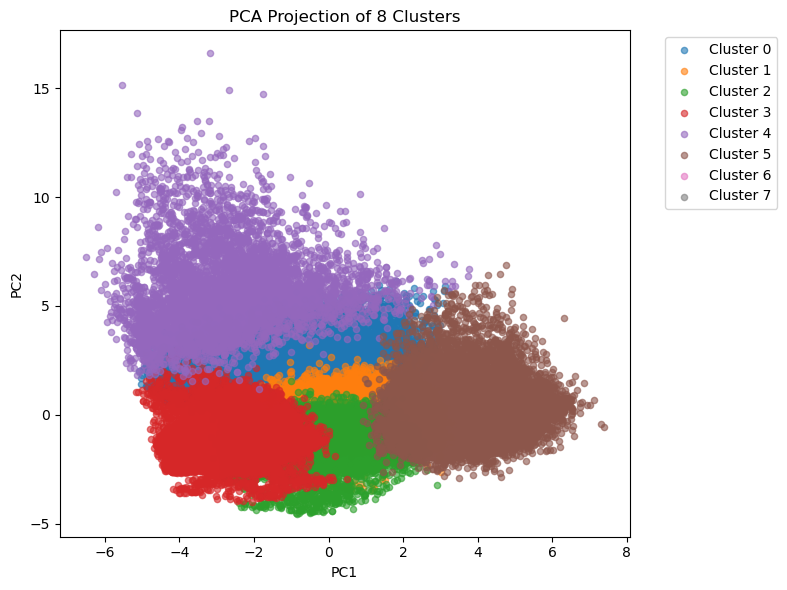

In [115]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# 1) Fit your final model with the chosen k (e.g. k=4)
k = 8
km = KMeans(n_clusters=6, random_state=42).fit(features_final)
labels = km.labels_

# 2) Reduce to 2D via PCA (for speed & interpretability)
pca2 = PCA(n_components=2, random_state=42)
proj = pca2.fit_transform(features_final)  # shape (n_samples, 2)

# 3) Scatter‐plot with cluster colors
plt.figure(figsize=(8,6))
for cluster_id in range(k):
    mask = labels == cluster_id
    plt.scatter(proj[mask,0], proj[mask,1], 
                label=f"Cluster {cluster_id}", 
                alpha=0.6, s=20)
plt.title(f"PCA Projection of {k} Clusters")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/2351887753.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_final['cluster'] = kmeans.fit_predict(features_final)



Cluster sizes:
cluster
1    17125
6    15519
5    15379
2    13513
7    12061
4    11835
0     9988
3     4580
Name: count, dtype: int64

Cluster-wise mean of features:
         avg_monthly_surplus  surplus_cv_signed  surplus_cv_abs  min_surplus  \
cluster                                                                        
0                 647.522859           0.337911        1.435369   -73.798394   
1                1054.340212           0.243749        0.334361   635.516873   
2                1188.724260           0.425354        0.425354   552.281919   
3                 401.465210          -2.938200        5.618502  -372.546387   
4                2682.042917           0.149047        0.149047  1910.846011   
5                 278.207019          -0.298636        3.033466  -322.696963   
6                 894.155623           0.281692        0.299286   552.709461   
7                 -78.211823           0.311469        2.097458  -283.198556   

         pct_months_negative_

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/2351887753.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feat, data=clustered_df, palette='Set2')


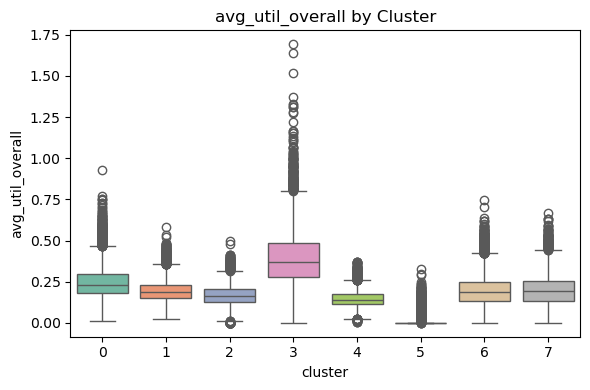

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/2351887753.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feat, data=clustered_df, palette='Set2')


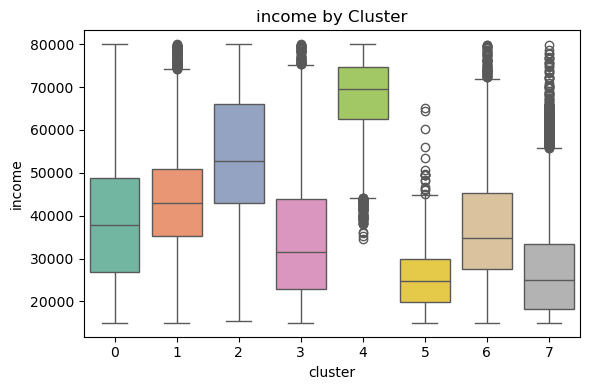

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/2351887753.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feat, data=clustered_df, palette='Set2')


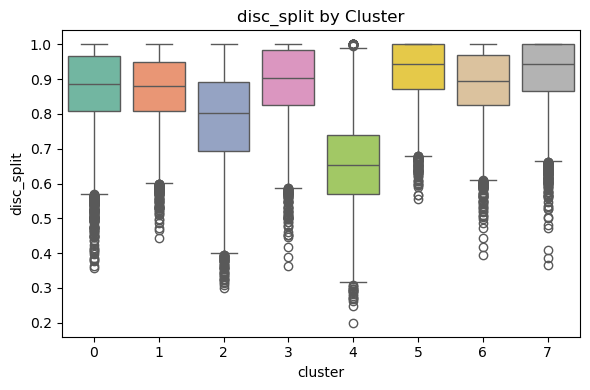

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/2351887753.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feat, data=clustered_df, palette='Set2')


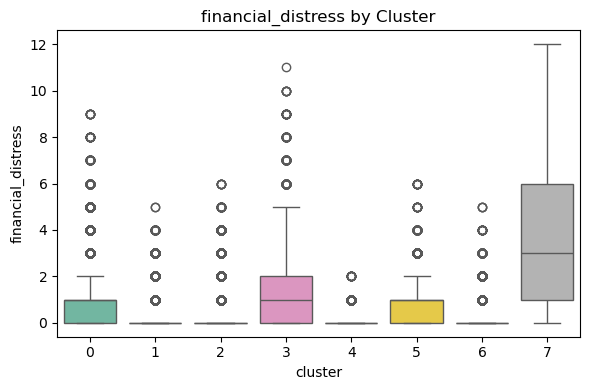

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/2351887753.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feat, data=clustered_df, palette='Set2')


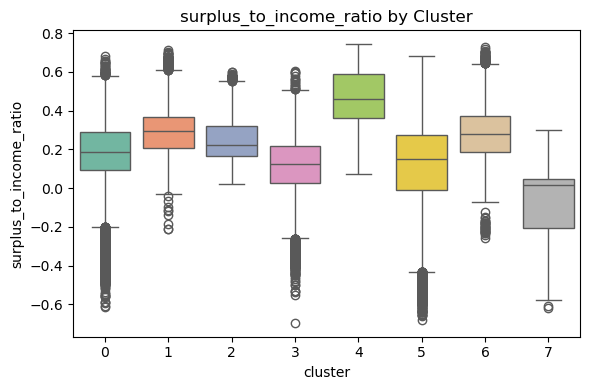

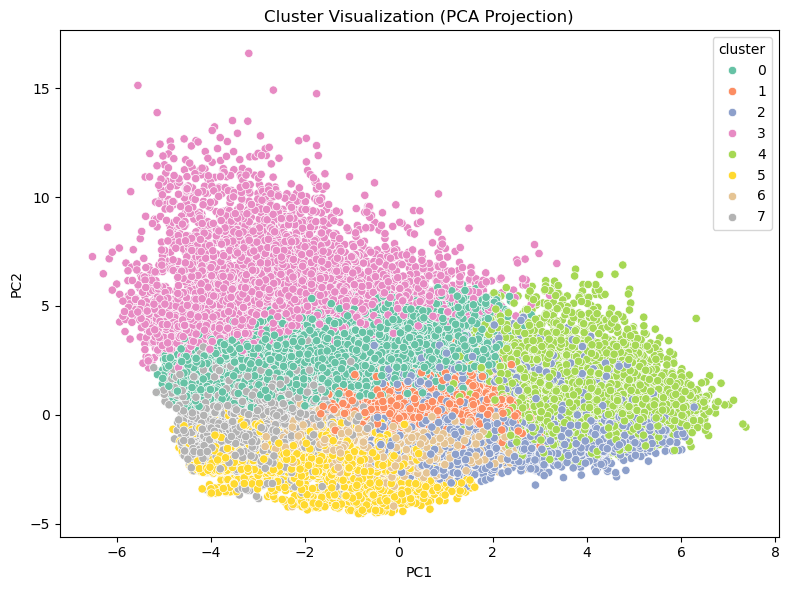

In [116]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# --- Step 1: KMeans clustering ---
kmeans = KMeans(n_clusters=8, random_state=42)
features_final['cluster'] = kmeans.fit_predict(features_final)

# --- Step 2: Merge with original features ---
clustered_df = features_df.copy()
clustered_df['cluster'] = features_final['cluster']

# --- Step 3: Summary statistics ---
print("\nCluster sizes:")
print(clustered_df['cluster'].value_counts())

print("\nCluster-wise mean of features:")
cluster_profiles = clustered_df.groupby('cluster').mean()
print(cluster_profiles)

# --- Step 4: Visualize selected features by cluster ---
important_features = [
    'avg_util_overall',
    'income',
    'disc_split',
    'financial_distress',
    'surplus_to_income_ratio'
]

for feat in important_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='cluster', y=feat, data=clustered_df, palette='Set2')
    plt.title(f"{feat} by Cluster")
    plt.tight_layout()
    plt.show()

# --- Step 5: PCA-based cluster scatter plot ---
pca = PCA(n_components=2, random_state=42)
components = pca.fit_transform(features_final.drop(columns='cluster'))

plt.figure(figsize=(8, 6))
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=features_final['cluster'], palette='Set2')
plt.title("Cluster Visualization (PCA Projection)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.tight_layout()
plt.show()

In [117]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
cluster_profiles

,avg_monthly_surplus,surplus_cv_signed,surplus_cv_abs,min_surplus,pct_months_negative_surplus,surplus_skewness,housing_expense_ratio,essentials_expense_ratio,surplus_to_income_ratio,avg_savings_rate_uncond,avg_investment_rate_uncond,sav_inv_tilt_uncond,avg_net_debt_change,debt_volatility,max_debt_spike,debt_to_income,hi_int_debt_ratio,avg_discretionary_spend,disc_spend_volatility,pct_months_zero_discretionary,tenure_Mortgage,tenure_Own outright,tenure_Renter,age_Aged 24 years and under,age_Aged 25 to 34 years,age_Aged 35 to 49 years,age_Aged 50 to 64 years,age_Aged 65 years and over,region_East,region_East Midlands,region_London,region_North East,region_North West,region_South East,region_South West,region_Wales,region_West Midlands,region_Yorkshire & Humber,occup_Clerical,occup_Elementary,occup_Managerial,occup_Operative,occup_Professional,occup_Service,occup_SkilledTrade,on_time_payment_rate,avg_days_past_due,max_days_past_due,delinq_severity_index,pct_serious_delinquencies,days_past_due_trend,credit_card_type1_util_mean,credit_card_type1_util_max,credit_card_type1_util_std,credit_card_type2_util_mean,credit_card_type2_util_max,credit_card_type2_util_std,overdraft_util_mean,overdraft_util_max,overdraft_util_std,total_available_credit,credit_concentration_ratio,credit_to_income_capacity,n_active_credit_products,credit_mix_herfindahl,avg_util_overall,util_surplus_corr,delinq_disc_spend_corr,timely_vs_netdebt_corr,chronic_revolver_flag,high_limit_low_util_flag,income,income_quintle,initial_savings,house_price,total_liab_end,financial_distress,severe_financial_distress,disc_split
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,647.522859,0.337911,1.435369,-73.798394,0.080830,-0.753819,0.203444,0.574094,0.169773,0.070554,0.040259,-0.243078,95.504974,966.924934,2281.071897,0.134813,0.815251,0.272659,789.630048,0.160951,0.223869,0.098518,0.677613,0.231177,0.284942,0.254906,0.177513,0.051462,0.124249,0.071786,0.180116,0.026932,0.108931,0.179215,0.116640,0.037445,0.092111,0.062575,0.071786,0.044954,0.048258,0.019824,0.724870,0.064678,0.025631,0.790023,1.437363,36.350964,5.749454,0.070810,0.377898,0.283788,0.448901,0.077714,0.148640,0.217146,0.033614,0.027807,0.124698,0.044709,11903.993746,0.610118,0.296620,2.297257,0.539503,0.244661,-0.041073,0.799571,-0.601633,0.003304,0.454245,38802.429041,3.355927,8192.758010,69100.824805,18399.177569,1.076592,0.969964,0.872078
1,1054.340212,0.243749,0.334361,635.516873,0.000842,-0.225312,0.144462,0.536829,0.293584,0.079360,0.045271,-0.239162,22.869448,266.965715,514.143396,0.082067,0.978722,0.288107,300.320425,0.013450,0.374657,0.257460,0.367883,0.155445,0.216701,0.248584,0.245898,0.133372,0.146453,0.055299,0.159007,0.015066,0.097460,0.230774,0.132730,0.026102,0.085664,0.051445,0.058628,0.026453,0.063299,0.015942,0.771095,0.040000,0.024584,0.937800,0.024177,1.011587,0.096706,0.000209,0.001522,0.211236,0.240214,0.016944,0.214609,0.244185,0.017319,0.031414,0.135532,0.050690,16177.718071,0.483692,0.378379,2.748321,0.418254,0.193588,0.169623,-0.010296,0.016718,0.000000,0.897343,42726.564328,3.774657,12172.940168,145526.165924,25473.556787,0.156496,0.010102,0.873010
2,1188.724260,0.425354,0.425354,552.281919,0.000105,0.076469,0.139619,0.456450,0.251960,0.118934,0.088820,-0.152173,-673.585104,398.364977,94.964622,0.222326,0.191186,0.197909,344.832059,0.035891,0.703767,0.165914,0.130319,0.046844,0.262858,0.337601,0.294309,0.058388,0.135499,0.031007,0.290905,0.005994,0.059498,0.263006,0.108414,0.016429,0.056612,0.032635,0.027085,0.009102,0.096870,0.007992,0.832606,0.011914,0.014431,0.932639,0.096594,2.978455,0.386377,0.003386,0.024836,0.189143,0.220822,0.017532,0.143220,0.167472,0.013395,0.037740,0.166863,0.061299,17852.695344,0.529637,0.332835,2.590690,0.459397,0.166318,0.496070,0.068045,-0.048535,0.000000,0.714867,54067.403847,4.416044,19503.496922,220182.083635,59138.842365,0.361800,0.001258,0.785313
3,401.465210,-2.938200,5.618502,-372.546387,0.126765,-0.63748

In [118]:
cluster_profiles.to_csv('Downloads/analysis_new_4.csv')

In [147]:
clustered_df.to_csv('Downloads/clustered_df.csv')

In [119]:
# to do next: can we provide tailored financial advice to customers in each cluster ?
# some possible advice include additional debt repayment, reduction in discretionary spending, increase savings/ investments
# can we do this in a mathematically rigorous manner (suggest a few approaches)
# what are the information we need in order to implement the suggested approaches?

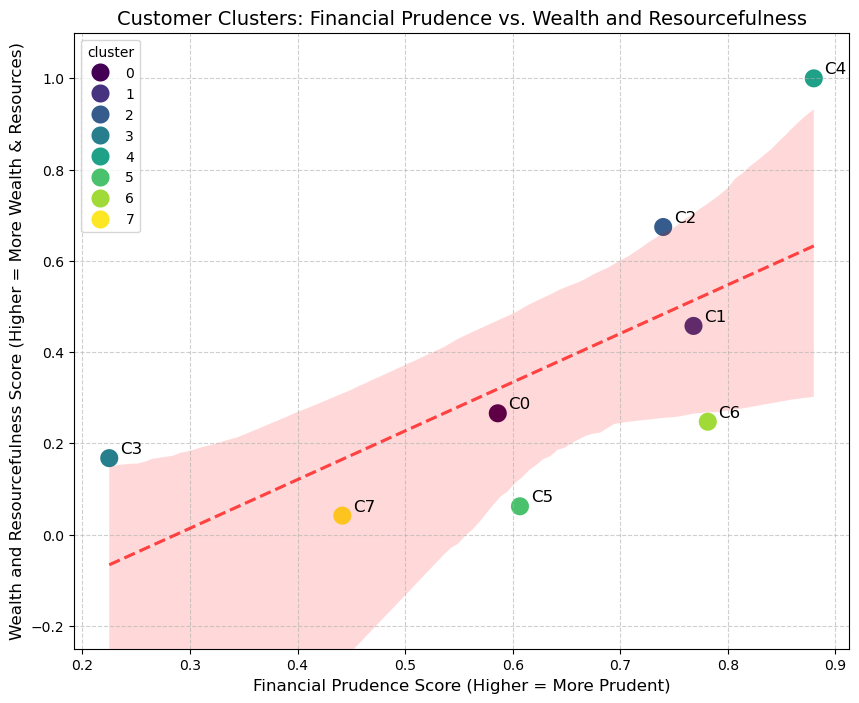

In [120]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
import numpy as np

# Load the data from the CSV file into a Pandas DataFrame.
# This DataFrame contains the mean values for various financial features for each customer cluster.
df = pd.read_csv('Downloads/analysis_new_4.csv')

# --- Define Features for Axes ---
# Features that contribute to the 'Financial Prudence' score.
# These features reflect debt management, savings habits, and spending control.
financial_prudence_features = [
    'debt_to_income',                # Lower debt is more prudent
    'on_time_payment_rate',          # Higher rate is more prudent
    'delinq_severity_index',         # Lower delinquency is more prudent
    'avg_discretionary_spend',       # Lower spend relative to income can indicate prudence
    'avg_savings_rate_uncond',       # Higher savings rate is more prudent
    'surplus_to_income_ratio',       # Higher surplus relative to income is more prudent
    'pct_months_negative_surplus',   # Lower percentage is more prudent
    'pct_months_zero_discretionary'  # Lower percentage could be more prudent (less distress)
]

# Features that contribute to the 'Wealth and Resourcefulness' score.
# These features reflect income, assets, and access to credit.
wealth_resourcefulness_features = [
    'income',
    'initial_savings',
    'house_price',
    'total_available_credit'
]

# --- Normalize Features ---
# Create copies of the DataFrame sections to avoid modifying the original DataFrame directly
# and to ensure proper scaling for each set of features.
df_prudence = df[financial_prudence_features].copy()
df_wealth = df[wealth_resourcefulness_features].copy()

# Initialize MinMaxScaler. This scaler transforms features by scaling each feature to a given range,
# typically between 0 and 1. This is important to ensure that all features contribute equally
# to the composite score, regardless of their original scale.
scaler = MinMaxScaler()

# Apply Min-Max scaling to the financial prudence features.
# The `fit_transform` method fits the scaler to the data and then transforms it.
df_prudence_scaled = pd.DataFrame(scaler.fit_transform(df_prudence), columns=df_prudence.columns)

# Invert scores for features where a *lower* value indicates *higher* prudence.
# For example, a lower 'debt_to_income' is more prudent, so we subtract it from 1 to
# ensure that a higher scaled value always means higher prudence.
df_prudence_scaled['debt_to_income'] = 1 - df_prudence_scaled['debt_to_income']
df_prudence_scaled['delinq_severity_index'] = 1 - df_prudence_scaled['delinq_severity_index']
df_prudence_scaled['pct_months_negative_surplus'] = 1 - df_prudence_scaled['pct_months_negative_surplus']
df_prudence_scaled['pct_months_zero_discretionary'] = 1 - df_prudence_scaled['pct_months_zero_discretionary']
df_prudence_scaled['avg_discretionary_spend'] = 1 - df_prudence_scaled['avg_discretionary_spend'] # Invert for prudence: lower spend is more prudent

# Calculate the composite 'financial_prudence_score' for each cluster.
# This is done by taking the mean of all scaled and inverted prudence features for each row (cluster).
df['financial_prudence_score'] = df_prudence_scaled.mean(axis=1)

# Apply Min-Max scaling to the wealth and resourcefulness features.
df_wealth_scaled = pd.DataFrame(scaler.fit_transform(df_wealth), columns=df_wealth.columns)

# Calculate the composite 'wealth_resourcefulness_score' for each cluster.
# This is done by taking the mean of all scaled wealth and resourcefulness features for each row (cluster).
df['wealth_resourcefulness_score'] = df_wealth_scaled.mean(axis=1)

# --- Prepare Data for Plotting ---
# Select the relevant columns for the scatter plot: cluster ID and the two newly created scores.
plot_df = df[['cluster', 'financial_prudence_score', 'wealth_resourcefulness_score']].copy()

# --- Generate the Scatter Plot ---
# Set the figure size for better readability.
plt.figure(figsize=(10, 8))

# Create a scatter plot using Seaborn.
# 'x' and 'y' define the axes. 'hue' is used to color-code points by 'cluster'.
# 's' sets the size of the markers, and 'palette' sets the color scheme.
sns.scatterplot(
    data=plot_df,
    x='financial_prudence_score',
    y='wealth_resourcefulness_score',
    hue='cluster',
    s=200,
    palette='viridis',
    legend='full' # Ensure the legend is displayed
)

# Add cluster labels next to each point for easy identification.
for i, row in plot_df.iterrows():
    plt.text(row['financial_prudence_score'] + 0.01, row['wealth_resourcefulness_score'] + 0.01,
             f'C{int(row["cluster"])}', fontsize=12)

# --- Add Linear Regression Line ---
# Use Seaborn's regplot to add a linear regression line.
# 'scatter=False' prevents it from drawing the scatter points again, as we already have them.
# 'color' sets the line color, and 'line_kws' allows for styling the line (e.g., linestyle, alpha).
sns.regplot(
    data=plot_df,
    x='financial_prudence_score',
    y='wealth_resourcefulness_score',
    scatter=False,
    color='red',
    line_kws={'linestyle': '--', 'alpha': 0.7},
    ax=plt.gca() # Ensure the line is drawn on the current axes
)

# --- Customize Plot Labels and Title ---
plt.title('Customer Clusters: Financial Prudence vs. Wealth and Resourcefulness', fontsize=14)
plt.xlabel('Financial Prudence Score (Higher = More Prudent)', fontsize=12)
plt.ylabel('Wealth and Resourcefulness Score (Higher = More Wealth & Resources)', fontsize=12)
plt.ylim((-0.25,1.10))
plt.grid(True, linestyle='--', alpha=0.6) # Add a grid for easier reading of values

# Show the plot
plt.show()

# sequential optimisation approach - more thought to go into this followed by code
1: cash flow stability and emergency fund (3 months expenses)
2: high interest debt reduction (empirical 40% dti)
3: credit score (somehow create a model and set a score threshold)
4. investments (mean variance optimisation according to risk appetite)

# what to do once identified objectives
1. reduce discretionary > lower housing costs (if young and stay alone) > lower essentials. IMPACT: how long will it take to establish 3 months expenses
2. drain savings but keep 3 months expenses to bring debt down, focusing on arrears first. After draining savings, reduce discretionary spending. IMPACT: you are currently paying xxx on interest monthly, over xx months, you will be punctual on payment and so pay 0 on interest, and it will take xx months to bring your dti down to 40%
3. investmemt / alternative goals 
4. 

ingredients needed: 
a column detailing debts in arrear currently
a column detailing debt paid to income per month


In [121]:
#print(cash_flow_df.columns.tolist())
print(df2.columns.tolist())

['income', 'incQ', 'dti', 'region', 'SOC_label', 'any_late', 'age_group', 'income quintile', 'tenure_label', 'proportion_of_income_spent_on_housing_cost', 'housing_cost', 'other essential spending', 'housing_cost_per_month', 'occup_class']


In [122]:
objective = pd.DataFrame()
objective['monthly_income']=cash_flow_df['income']/12
objective['required_buffer'] = 3 * (cash_flow_df['housing_cost_per_month'] + cash_flow_df['other essential spending'])
objective['current_savings'] = cash_flow_df['savings_account_12']
objective['current_arrears'] = liab_df['total_arrears_12']
objective['housing_cost'] = cash_flow_df['housing_cost_per_month']
objective['essential_cost'] = cash_flow_df['other essential spending']
objective['housing_tenure'] = df2['tenure_label']


In [123]:
objective['avg_disc_spend'] = 0.0
objective['avg_debt_paid'] = cash_flow_df['housing_cost_per_month']
for m in range(1,13):
    objective['avg_disc_spend'] += (1/12) * cash_flow_df[f'disc_spend_{m}']
    objective['avg_debt_paid'] += (1/12) * cash_flow_df[f'total_debt_paid_{m}']
    
    

In [124]:
objective.columns

Index(['monthly_income', 'required_buffer', 'current_savings',
       'current_arrears', 'housing_cost', 'essential_cost', 'housing_tenure',
       'avg_disc_spend', 'avg_debt_paid'],
      dtype='object')

In [125]:
df_new.columns 

Index(['customer_id', 'income', 'overdraft', 'overdraft_credit_limit',
       'overdraft_interest_rate', 'credit_card_type1',
       'credit_card_type1_credit_limit', 'credit_card_type1_interest_rate',
       'credit_card_type1_initial_balance', 'credit_card_type2',
       ...
       'short_term_loan_total_balance_6', 'short_term_loan_total_balance_7',
       'short_term_loan_total_balance_8', 'short_term_loan_total_balance_9',
       'short_term_loan_total_balance_10', 'short_term_loan_total_balance_11',
       'short_term_loan_total_balance_12', 'label', 'risk_level',
       'total_late_days'],
      dtype='object', length=218)

In [126]:
import pandas as pd
refined_objective = pd.DataFrame()
refined_objective['monthly_income']=cash_flow_df['income']/12
refined_objective['required_buffer'] = 3 * (cash_flow_df['housing_cost_per_month'] + cash_flow_df['other essential spending'])
refined_objective['housing_cost'] = cash_flow_df['housing_cost_per_month']
refined_objective['essential_cost'] = cash_flow_df['other essential spending']
refined_objective['housing_tenure'] = df2['tenure_label']
refined_objective['age_group'] = df2['age_group']
refined_objective['STL_monthly_repayment']= df_new['STL_monthly_repayment']
refined_objective['SOC_label']=df2['SOC_label']
refined_objective['region']=df2['region']
refined_objective['income_quintile']=df2['income quintile']
refined_objective['house_price']=asset_df['house_price']
refined_objective['saving_split']= p_sav
refined_objective['investment_split']= p_inv


for m in range(1,13):
    refined_objective[f'disc_spend_{m}'] = cash_flow_df[f'disc_spend_{m}']
    refined_objective[f'total_debt_paid_{m}'] = refined_objective['housing_cost']+cash_flow_df[f'total_debt_paid_{m}']
    refined_objective[f'short_term_loan_arrears_{m}'] = liab_df[f'short_term_loan_arrears_{m}']
    refined_objective[f'credit_card_type1_arrears_{m}'] = liab_df[f'credit_card_type1_arrears_{m}']
    refined_objective[f'credit_card_type2_arrears_{m}'] = liab_df[f'credit_card_type2_arrears_{m}']
    refined_objective[f'overdraft_arrears_{m}'] = liab_df[f'overdraft_arrears_{m}']
    refined_objective[f'short_term_loan_balance_{m}'] = liab_df[f'short_term_loan_liability_{m}']
    refined_objective[f'credit_card_type1_balance_{m}'] = liab_df[f'credit_card_type1_liability_{m}']
    refined_objective[f'credit_card_type2_balance_{m}'] = liab_df[f'credit_card_type2_liability_{m}']
    refined_objective[f'overdraft_balance_{m}'] = liab_df[f'overdraft_liability_{m}']                                                       
    refined_objective[f'total_arrears_{m}'] = liab_df[f'total_arrears_{m}']
    refined_objective[f'savings_account_{m}'] = cash_flow_df[f'savings_account_{m}']
    refined_objective[f'investment_account_{m}'] = cash_flow_df[f'investment_account_{m}']
    refined_objective[f'cash_flow_{m}'] = cash_flow_df[f'raw_cf_{m}']
    refined_objective[f'shortfall_{m}'] = cash_flow_df[f'shortfall_{m}']

/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/1822759008.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  refined_objective[f'investment_account_{m}'] = cash_flow_df[f'investment_account_{m}']
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/1822759008.py:32: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  refined_objective[f'cash_flow_{m}'] = cash_flow_df[f'raw_cf_{m}']
/var/folders/4b/5ltgsxnn5ld2nrphb_rsnkr40000gn/T/ipykernel_59594/1822759008.py:33: PerformanceWarning: DataFrame is highly 

In [127]:
toy_refined_objective = refined_objective[0:1000]
toy_refined_objective

,monthly_income,required_buffer,housing_cost,essential_cost,housing_tenure,age_group,STL_monthly_repayment,SOC_label,region,income_quintile,house_price,saving_split,investment_split,disc_spend_1,total_debt_paid_1,short_term_loan_arrears_1,credit_card_type1_arrears_1,credit_card_type2_arrears_1,overdraft_arrears_1,short_term_loan_balance_1,credit_card_type1_balance_1,credit_card_type2_balance_1,overdraft_balance_1,total_arrears_1,savings_account_1,investment_account_1,cash_flow_1,shortfall_1,disc_spend_2,total_debt_paid_2,short_term_loan_arrears_2,credit_card_type1_arrears_2,credit_card_type2_arrears_2,overdraft_arrears_2,short_term_loan_balance_2,credit_card_type1_balance_2,credit_card_type2_balance_2,overdraft_balance_2,total_arrears_2,savings_account_2,investment_account_2,cash_flow_2,shortfall_2,disc_spend_3,total_debt_paid_3,short_term_loan_arrears_3,credit_card_type1_arrears_3,credit_card_type2_arrears_3,overdraft_arrears_3,short_term_loan_balance_3,credit_card_type1_balance_3,credit_card_type2_balance_3,overdraft_balance_3,total_arrears_3,savings_account_3,investment_account_3,cash_flow_3,shortfall_3,disc_spend_4,total_debt_paid_4,short_term_loan_arrears_4,credit_card_type1_arrears_4,credit_card_type2_arrears_4,overdraft_arrears_4,short_term_loan_balance_4,credit_card_type1_balance_4,credit_card_type2_balance_4,overdraft_balance_4,total_arrears_4,savings_account_4,investment_account_4,cash_flow_4,shortfall_4,disc_spend_5,total_debt_paid_5,short_term_loan_arrears_5,credit_card_type1_arrears_5,credit_card_type2_arrears_5,overdraft_arrears_5,short_term_loan_balance_5,credit_card_type1_balance_5,credit_card_type2_balance_5,overdraft_balance_5,total_arrears_5,savings_account_5,investment_account_5,cash_flow_5,shortfall_5,disc_spend_6,total_debt_paid_6,short_term_loan_arrears_6,credit_card_type1_arrears_6,credit_card_type2_arrears_6,overdraft_arrears_6,short_term_loan_balance_6,credit_card_type1_balance_6,credit_card_type2_balance_6,overdraft_balance_6,total_arrears_6,savings_account_6,investment_account_6,cash_flow_6,shortfall_6,disc_spend_7,total_debt_paid_7,short_term_loan_arrears_7,credit_card_type1_arrears_7,credit_card_type2_arrears_7,overdraft_arrears_7,short_term_loan_balance_7,credit_card_type1_balance_7,credit_card_type2_balance_7,overdraft_balance_7,total_arrears_7,savings_account_7,investment_account_7,cash_flow_7,shortfall_7,disc_spend_8,total_debt_paid_8,short_term_loan_arrears_8,credit_card_type1_arrears_8,credit_card_type2_arrears_8,overdraft_arrears_8,short_term_loan_balance_8,credit_card_type1_balance_8,credit_card_type2_balance_8,overdraft_balance_8,total_arrears_8,savings_account_8,investment_account_8,cash_flow_8,shortfall_8,disc_spend_9,total_debt_paid_9,short_term_loan_arrears_9,credit_card_type1_arrears_9,credit_card_type2_arrears_9,overdraft_arrears_9,short_term_loan_balance_9,credit_card_type1_balance_9,credit_card_type2_balance_9,overdraft_balance_9,total_arrears_9,savings_account_9,investment_account_9,cash_flow_9,shortfall_9,disc_spend_10,total_debt_paid_10,short_term_loan_arrears_10,credit_card_type1_arrears_10,credit_card_type2_arrears_10,overdraft_arrears_10,short_term_loan_balance_10,credit_card_type1_balance_10,credit_card_type2_balance_10,overdraft_balance_10,total_arrears_10,savings_account_10,investment_account_10,cash_flow_10,shortfall_10,disc_spend_11,total_debt_paid_11,short_term_loan_arrears_11,credit_card_type1_arrears_11,credit_card_type2_arrears_11,overdraft_arrears_11,short_term_loan_balance_11,credit_card_type1_balance_11,credit_card_type2_balance_11,overdraft_balance_11,total_arrears_11,savings_account_11,investment_account_11,cash_flow_11,shortfall_11,disc_spend_12,total_debt_paid_12,short_term_loan_arrears_12,credit_card_type1_arrears_12,credit_card_type2_arrears_12,overdraft_arrears_12,short_term_loan_balance_12,credit_card_type1_balance_12,credit_card_type2_balance_12,overdraft_balance_12,total_arrears_12,savings_account_12,investment_account_12,cash_flow_12,shortfall_12
0,394

In [128]:
refined_objective.to_csv('Downloads/refined_objective.csv')
toy_refined_objective.to_csv('Downloads/toy_refined_objective.csv')

In [129]:
refined_objective['housing_tenure'].unique()

array(['Own outright', 'Mortgage', 'Renter'], dtype=object)

In [211]:
import pandas as pd
import numpy as np



# --- Define Thresholds and Parameters ---
SAVINGS_BUFFER_MONTHS = 3 # Number of months of essential + housing costs for buffer
DTI_THRESHOLD = 0.35 # 35% for Debt Service Ratio (Debt Payments / Income)
BUFFER_BUILD_MONTHS_TARGET_6M = 6 # Target timeframe (in months) to build savings buffer (first attempt)
BUFFER_BUILD_MONTHS_TARGET_12M = 12 # Target timeframe (in months) to build savings buffer (second attempt)
ESSENTIAL_HOUSING_REBUDGET_PCT = 0.15 # 15% initial reduction percentage for rebudgeting suggestion
ARREARS_IMPACT_INTEREST_RATE = 0.20 # Example yearly interest rate for arrears impact advisory (20%)


# --- Sequential Optimization Pipeline ---

# Dictionary to store recommendations for all customers
all_customer_recommendations = {}

# Loop through each customer in the DataFrame
for customer_id, customer_data in refined_objective.iterrows():
    print(f"\n--- Optimizing for Customer ID: {customer_id} ---")

    # Initialize recommendations dictionary for the current customer
    recommendations = {
        'cash_flow_stability': 'Not applicable yet.',
        'debt_management': 'Not applicable yet.',
        'wealth_maximization': 'Not applicable yet.'
    }

    # Flags to track if a layer's objectives are met, determining progression to the next layer
    is_layer1_stable = False
    is_layer2_stable = False

    # Variables to carry over from Layer 1 for Layer 2 calculations
    avg_current_discretionary_spend = np.mean([customer_data[f'disc_spend_{m}'] for m in range(1, 13)])
    hypothetical_disc_cut_for_overall_positive_cf = 0 # This will be set in Layer 1
    
    # ====================================================================================
    # --- LAYER 1: Cash Flow Stability Optimization ---
    # Objective: Ensure consistent positive cash flow and a sufficient emergency savings buffer.
    # ====================================================================================
    print("\n[Layer 1: Cash Flow Stability]")

    # 1.1 Initial Cash Flow Assessment (before any adjustments)
    monthly_cash_flow_before_disc = [customer_data[f'cash_flow_{m}'] for m in range(1, 13)]
    initial_avg_cf_before_disc = np.mean(monthly_cash_flow_before_disc)
    

    # Initialize hypothetical adjustments
    hypothetical_cf_increase_from_essential_housing = 0
    
    # --- Step 1: Address negative cash flow before discretionary spending (Essential/Housing) ---
    if initial_avg_cf_before_disc < 0:
        recommendations['cash_flow_stability'] = "⚠️ Cash flow stability issues found. Recommendations:"
        recommendations['cash_flow_stability'] += f"\n  - Detected negative cash flow (before discretionary spending) in {sum(1 for cf in monthly_cash_flow_before_disc if cf < 0)} month(s) totaling £{abs(sum(cf for cf in monthly_cash_flow_before_disc if cf < 0)):.2f} over the last year."
        
        is_young_renter = (customer_data['age_group'] == 'Aged 24 years and under' and customer_data['housing_tenure'] == 'Renter')

        if is_young_renter:
            recommendations['cash_flow_stability'] += "\n  - **Action (Young Renter):** Given your young age and renting status, consider the significant financial benefit of temporarily returning to live with parents/family to substantially reduce housing costs. This could quickly turn your cash flow positive."
            hypothetical_cf_increase_from_essential_housing = customer_data['housing_cost'] # Assume full housing cost reduction
        else:
            avg_essential_housing_cost = customer_data['essential_cost'] + customer_data['housing_cost']
            hypothetical_cf_increase_from_essential_housing = avg_essential_housing_cost * ESSENTIAL_HOUSING_REBUDGET_PCT
            recommendations['cash_flow_stability'] += f"\n  - **Action:** Re-evaluate your essential and housing costs. Aim to rebudget and reduce these expenses by approximately {ESSENTIAL_HOUSING_REBUDGET_PCT:.0%} (e.g., £{hypothetical_cf_increase_from_essential_housing:.2f} per month). This might involve seeking cheaper accommodation, optimizing utility usage, or finding more cost-effective essentials."
        
        # Calculate CF after hypothetical essential/housing cuts
        cf_after_essential_housing_cuts = initial_avg_cf_before_disc + hypothetical_cf_increase_from_essential_housing
        
        if cf_after_essential_housing_cuts < 0:
            recommendations['cash_flow_stability'] += "\n  - **Critical:** Even after considering significant essential/housing expense reductions, your cash flow remains deeply negative. It is highly recommended to **seek professional financial advice** immediately to explore all options, including income generation, debt restructuring, or welfare support."
            print(recommendations['cash_flow_stability'])
            all_customer_recommendations[customer_id] = recommendations
            print("\n" + "="*50)
            continue # Stop optimization for this customer
        else:
            recommendations['cash_flow_stability'] += f"\n    (These actions could lead to a positive average cash flow before discretionary of ~£{cf_after_essential_housing_cuts:.2f})."
    else:
        # If initial CF before discretionary was already positive
        cf_after_essential_housing_cuts = initial_avg_cf_before_disc
        recommendations['cash_flow_stability'] = "✅ Initial cash flow (before discretionary spending) is stable."


    # --- Step 2: Address overall negative cash flow (Discretionary spending) ---
    # Current overall cash flow (after essential/housing adjustments, but before discretionary cuts)
    current_overall_cf_after_essential_housing_adjusted = cf_after_essential_housing_cuts - avg_current_discretionary_spend
    
    if current_overall_cf_after_essential_housing_adjusted < 0:
        hypothetical_disc_cut_for_overall_positive_cf = abs(current_overall_cf_after_essential_housing_adjusted)
        # Ensure we don't recommend cutting more discretionary than they actually spend
        hypothetical_disc_cut_for_overall_positive_cf = min(hypothetical_disc_cut_for_overall_positive_cf, avg_current_discretionary_spend)
        
        recommendations['cash_flow_stability'] += f"\n  - **Action:** To achieve a consistent positive overall cash flow, reduce your average monthly discretionary spending by at least £{hypothetical_disc_cut_for_overall_positive_cf:.2f}."
        recommendations['cash_flow_stability'] += f" (Current average discretionary spend: £{avg_current_discretionary_spend:.2f})."
    
    # Calculate the current (or hypothetically achievable) surplus after all *necessary* cuts for positive overall CF
    potential_surplus_after_initial_cuts = cf_after_essential_housing_cuts - (avg_current_discretionary_spend - hypothetical_disc_cut_for_overall_positive_cf)
    
    # max_potential_monthly_surplus is the maximum surplus achievable by cutting ALL discretionary spending
    max_potential_monthly_surplus = cf_after_essential_housing_cuts # This is the surplus if discretionary is zeroed out


    # --- Step 3: Savings Buffer Plan (Aggressive Pursuit) ---
    current_savings_balance = customer_data['savings_account_12']
    required_buffer_amount = customer_data['required_buffer']
    shortfall_to_buffer = required_buffer_amount - current_savings_balance

    if shortfall_to_buffer <= 0:
        recommendations['cash_flow_stability'] += "\n✅ Emergency savings buffer is already sufficient."
        is_layer1_stable = True
    else:
        recommendations['cash_flow_stability'] += f"\n  - **Action:** Your current savings (£{current_savings_balance:.2f}) are below the target buffer of £{required_buffer_amount:.2f}."

        # Attempt 1: 6-month target
        monthly_contribution_6m = shortfall_to_buffer / BUFFER_BUILD_MONTHS_TARGET_6M
        
        if max_potential_monthly_surplus >= monthly_contribution_6m:
            # If buffer can be built in 6 months by maximizing all cuts
            required_additional_disc_cut_for_buffer = max(0, monthly_contribution_6m - potential_surplus_after_initial_cuts)
            
            recommendations['cash_flow_stability'] += f"\n    - To achieve your emergency fund within {BUFFER_BUILD_MONTHS_TARGET_6M} months, save at least £{monthly_contribution_6m:.2f} per month."
            if required_additional_disc_cut_for_buffer > 0:
                recommendations['cash_flow_stability'] += f" This will require an additional reduction of £{required_additional_disc_cut_for_buffer:.2f} from your discretionary spending (beyond cuts needed for overall positive CF)."
            else:
                recommendations['cash_flow_stability'] += " This can be achieved with your current potential surplus."
            is_layer1_stable = True
        else:
            # Attempt 2: 12-month target
            monthly_contribution_12m = shortfall_to_buffer / BUFFER_BUILD_MONTHS_TARGET_12M
            if max_potential_monthly_surplus >= monthly_contribution_12m:
                # If buffer can be built in 12 months by maximizing all cuts
                required_additional_disc_cut_for_buffer = max(0, monthly_contribution_12m - potential_surplus_after_initial_cuts)
                
                recommendations['cash_flow_stability'] += f"\n    - If a {BUFFER_BUILD_MONTHS_TARGET_6M}-month plan is too aggressive, you can aim to build your emergency fund within {BUFFER_BUILD_MONTHS_TARGET_12M} months by saving at least £{monthly_contribution_12m:.2f} per month."
                if required_additional_disc_cut_for_buffer > 0:
                    recommendations['cash_flow_stability'] += f" This will require an additional reduction of £{required_additional_disc_cut_for_buffer:.2f} from your discretionary spending (beyond cuts needed for overall positive CF)."
                else:
                    recommendations['cash_flow_stability'] += " This can be achieved with your current potential surplus."
                is_layer1_stable = True
            else:
                # Attempt 3: Cannot achieve within defined targets even with max cuts
                recommendations['cash_flow_stability'] += f"\n    - Based on your potential monthly surplus (even after maximizing all possible cuts), it might be challenging to build the full buffer within {BUFFER_BUILD_MONTHS_TARGET_12M} months."
                recommendations['cash_flow_stability'] += "\n      **Recommendation:** Keep this emergency fund objective in mind as your income grows, and prioritize increasing your monthly surplus through additional income streams or further long-term expense optimization."
                is_layer1_stable = False # Layer 1 is not fully stable

    print(recommendations['cash_flow_stability'])

    # ====================================================================================
    # --- LAYER 2: Debt Management & Arrears Optimization ---
    # Objective: Eliminate arrears and achieve a healthy debt service ratio.
    # This layer ONLY executes if Layer 1 (Cash Flow Stability) is achieved.
    # ====================================================================================
    if is_layer1_stable:
        print("\n[Layer 2: Debt Management & Arrears]")

        # 2.1 Check for current and historical arrears
        current_arrears_present = customer_data['total_arrears_12'] > 0 # Check current month
        historical_arrears_present = any(customer_data[f'total_arrears_{m}'] > 0 for m in range(1, 12)) # Check previous 11 months

        # Placeholder for actual arrears amount (as dummy data only has presence flag)
        # In a real scenario, this would be a specific financial amount from your data.
        # For demonstration, let's assume a default arrears amount if present.
        placeholder_arrears_amount = 500 # Example amount if arrears are present
        total_arrears_amount_due = placeholder_arrears_amount if current_arrears_present else 0

        # Calculate available savings AFTER accounting for the 3-month buffer
        available_savings_for_debt = max(0, current_savings_balance - required_buffer_amount)

        # Calculate remaining discretionary that can be cut, after Layer 1's requirements
        # This is the current average discretionary minus any hypothetical cuts already applied in Layer 1
        remaining_discretionary_that_can_be_cut = avg_current_discretionary_spend - hypothetical_disc_cut_for_overall_positive_cf
        # If Layer 1 recommended additional cuts for buffer, those are implicitly included in potential_surplus_after_initial_cuts
        # Here, we consider if there's any 'buffer' of discretionary left, i.e., up to the point of max_potential_monthly_surplus
        remaining_discretionary_that_can_be_cut = max(0, avg_current_discretionary_spend - (cf_after_essential_housing_cuts - potential_surplus_after_initial_cuts))
        
        # We need to refine remaining_discretionary_that_can_be_cut so it accurately reflects what's left for debt
        # It's the current discretionary minus what was cut to ensure basic positive CF, and what was cut for the buffer target.
        # So, the maximum discretionary left to cut is whatever isn't *already* being cut for Layer 1's objectives.
        # This is simplified as `avg_current_discretionary_spend` minus what was cut to achieve `potential_surplus_after_initial_cuts`.
        actual_discretionary_after_layer1_cuts = avg_current_discretionary_spend - (max_potential_monthly_surplus - potential_surplus_after_initial_cuts)
        remaining_discretionary_that_can_be_cut = max(0, actual_discretionary_after_layer1_cuts)
        # This is the amount of discretionary spending that *can still be reduced* to generate more cash.

        # Check if debt is well-managed
        if not current_arrears_present and not historical_arrears_present and debt_service_ratio < DTI_THRESHOLD:
            is_layer2_stable = True
            recommendations['debt_management'] = f"✅ Debt is well-managed with no arrears and a healthy debt service ratio ({debt_service_ratio:.2%})."
        else:
            recommendations['debt_management'] = "⚠️ Debt management issues found. Recommendations:"
            
            # --- Arrears Clearance Strategy ---
            if current_arrears_present:
                recommendations['debt_management'] += f"\n  - **CRITICAL: You currently have debts in arrears amounting to an estimated £{total_arrears_amount_due:.2f}.** Clearing these is the top priority to avoid further penalties and damage to your credit score. Arrears can incur high interest, for example, at a yearly rate of {ARREARS_IMPACT_INTEREST_RATE:.0%}, significantly increasing your debt burden over time."
                
                # Detail specific types of arrears if present
                arrears_types = []
                if customer_data['short_term_loan_arrears_12'] > 0: arrears_types.append("short-term loan")
                if customer_data['credit_card_type1_arrears_12'] > 0: arrears_types.append("credit card type 1")
                if customer_data['credit_card_type2_arrears_12'] > 0: arrears_types.append("credit card type 2")
                if customer_data['overdraft_arrears_12'] > 0: arrears_types.append("overdraft")
                if arrears_types:
                    recommendations['debt_management'] += f" Specific arrears include: {', '.join(arrears_types)}."

                if available_savings_for_debt >= total_arrears_amount_due:
                    recommendations['debt_management'] += f"\n    - **Action 1: Use Savings.** You have £{available_savings_for_debt:.2f} available above your emergency buffer. We highly recommend using these funds to clear your arrears immediately."
                    total_arrears_amount_due = 0 # Arrears hypothetically cleared
                else:
                    recommendations['debt_management'] += f"\n    - **Action 1: Use Savings.** You have £{available_savings_for_debt:.2f} available above your emergency buffer. Use these funds to reduce your arrears as much as possible."
                    total_arrears_amount_due -= available_savings_for_debt
                    total_arrears_amount_due = max(0, total_arrears_amount_due) # Ensure it doesn't go negative
                    
                    if total_arrears_amount_due > 0 and remaining_discretionary_that_can_be_cut > 0:
                        potential_cut_for_arrears = min(total_arrears_amount_due, remaining_discretionary_that_can_be_cut)
                        recommendations['debt_management'] += f"\n    - **Action 2: Further Discretionary Cuts.** You still need to clear £{total_arrears_amount_due:.2f}. To generate additional funds, consider reducing your remaining monthly discretionary spending by up to £{potential_cut_for_arrears:.2f}. This should be possible given your current spending habits."
                        total_arrears_amount_due -= potential_cut_for_arrears
                        total_arrears_amount_due = max(0, total_arrears_amount_due)

                    if total_arrears_amount_due > 0:
                        recommendations['debt_management'] += f"\n    - **Action 3: Professional Help.** After utilizing available savings and maximizing discretionary cuts, you still have £{total_arrears_amount_due:.2f} in arrears. It is strongly recommended to **seek professional debt advice** or explore formal debt management plans (e.g., Debt Consolidation, Debt Management Plan, Individual Voluntary Arrangement) to address this shortfall and prevent further financial distress."
            elif historical_arrears_present:
                recommendations['debt_management'] += "\n  - **Action:** While not currently in arrears, historical arrears were detected. Focus on consistent on-time payments to prevent future issues and improve your credit history."

            # --- Debt Service Ratio Management ---
            # Recalculate avg_monthly_debt_payment in case arrears were cleared hypothetically
            # (though the DTI calculation relies on historical payment data, so this part assumes original DTI check)
            # DTI logic remains largely the same, focusing on reducing DTI if it's high.
            avg_monthly_debt_payment = np.mean([customer_data[f'total_debt_paid_{m}'] for m in range(1, 13)])
            monthly_income = customer_data['monthly_income']
            debt_service_ratio = (avg_monthly_debt_payment / monthly_income) if monthly_income > 0 else float('inf')


            if debt_service_ratio >= DTI_THRESHOLD:
                recommendations['debt_management'] += f"\n  - **Action:** Your average monthly debt service ratio ({debt_service_ratio:.2%}) is above the target of {DTI_THRESHOLD:.0%}. This indicates a significant portion of your income is allocated to debt payments. "
                
                # Calculate disposable income available for extra debt payments, assuming Layer 1 is stable
                # and considering any further discretionary cuts made for arrears.
                # Use max_potential_monthly_surplus as the 'available income' if no specific debt payment needed
                # (since arrears are handled separately).
                
                # This needs to be carefully derived from the available cash flow after essential/housing and current debt payments.
                # For DTI reduction, the best approach is to point to the available surplus for payments.
                # If arrears are cleared, we are essentially looking at the surplus generated by Layer 1's recommendations.
                
                surplus_for_debt_reduction = max(0, max_potential_monthly_surplus - avg_monthly_debt_payment) # Surplus after max cuts, minus typical debt payment
                if surplus_for_debt_reduction > 0:
                    recommendations['debt_management'] += f"Allocate your surplus cash flow (approx. £{surplus_for_debt_reduction:.2f} per month) towards making additional payments, focusing on high-interest unsecured debts (e.g., credit cards, overdrafts). This will help bring your DTI down to a healthier level."
                else:
                    recommendations['debt_management'] += "Consider exploring debt consolidation or counseling options if you have high-interest debts, as your current income may not easily cover debt burdens even after essential/housing and discretionary optimization."
            
            # Layer 2 stability check for progression: Arrears must be cleared and DTI healthy
            if total_arrears_amount_due == 0 and debt_service_ratio < DTI_THRESHOLD:
                is_layer2_stable = True
            else:
                is_layer2_stable = False # Either arrears remain or DTI is too high


        print(recommendations['debt_management'])
    else:
        # Skip Layer 2 if Layer 1 was not stable
        recommendations['debt_management'] = "⚪ Skipping Layer 2: Debt Management (Layer 1 not stable)."
        print(recommendations['debt_management'])


    # ====================================================================================
    # --- LAYER 3: Wealth Maximization Optimization ---
    # Objective: Strategic savings and investments for long-term growth and specific goals.
    # This layer ONLY executes if Layer 1 & Layer 2 are both achieved.
    # ====================================================================================
    if is_layer1_stable and is_layer2_stable:
        print("\n[Layer 3: Wealth Maximization]")

        # Calculate remaining disposable income available for investment/additional savings
        # This is approximated as income minus essential costs, housing costs, and optimal debt payments.
        remaining_disposable_for_investment = customer_data['monthly_income'] - customer_data['essential_cost'] - customer_data['housing_cost'] - avg_monthly_debt_payment
        remaining_disposable_for_investment = max(0, remaining_disposable_for_investment) # Ensure it's not negative

        current_investments_balance = customer_data['investment_account_12']
        current_savings_balance = customer_data['savings_account_12'] # Already confirmed to be sufficient in Layer 1

        recommendations['wealth_maximization'] = "✅ Ready for wealth maximization. Recommendations:"

        if remaining_disposable_for_investment > 0:
            recommendations['wealth_maximization'] += f"\n  - You have approximately £{remaining_disposable_for_investment:.2f} disposable income monthly after essential, housing, and debt obligations."

            # **CRITICAL GAPS HERE: Risk Tolerance & Specific Goals**
            # To provide truly personalized investment advice, external information like the customer's
            # risk tolerance and specific financial goals (e.g., buying a house, retirement age, child's education)
            # would be needed. Without this, recommendations remain general.

            # General advice for allocation between investing and additional savings
            investment_amount = remaining_disposable_for_investment * 0.7 # Example: 70% to investments
            savings_amount = remaining_disposable_for_investment * 0.3  # Example: 30% to further savings
            
            recommendations['wealth_maximization'] += f"\n  - Consider allocating your additional disposable income towards:"
            recommendations['wealth_maximization'] += f"\n    - **Investing:** Approximately £{investment_amount:.2f} per month for long-term growth. Diversified, low-cost index funds or ETFs are generally recommended for most investors."
            recommendations['wealth_maximization'] += f"\n    - **Additional Savings:** Approximately £{savings_amount:.2f} per month for medium-term goals (e.g., a new car, holiday) or future liquidity beyond the emergency buffer."
            recommendations['wealth_maximization'] += f"\n  - Your current investments total: £{current_investments_balance:.2f}. Your current savings total: £{current_savings_balance:.2f} (already above the required buffer)."

            recommendations['wealth_maximization'] += "\n  - **To refine these recommendations and align them with your specific needs, we would need to know:**"
            recommendations['wealth_maximization'] += "\n    - Your specific financial goals (e.g., buying a house in X years, retirement age, child's education fund) and their timelines."
            recommendations['wealth_maximization'] += "\n    - Your comfort level with investment risk (your risk tolerance)."
        else:
            recommendations['wealth_maximization'] += "\n  - No additional disposable income identified for immediate wealth maximization, but cash flow and debt are stable. Continue to monitor your finances and identify opportunities for increasing income or further optimizing spending."


        print(recommendations['wealth_maximization'])
    else:
        # Skip Layer 3 if previous layers were not stable
        recommendations['wealth_maximization'] = "⚪ Skipping Layer 3: Wealth Maximization (Previous layers not stable)."
        print(recommendations['wealth_maximization'])

    # Store the final recommendations for the current customer
    all_customer_recommendations[customer_id] = recommendations
    print("\n" + "="*50)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



✅ Debt is well-managed with no arrears and a healthy debt service ratio (10.39%).

[Layer 3: Wealth Maximization]
✅ Ready for wealth maximization. Recommendations:
  - You have approximately £1644.52 disposable income monthly after essential, housing, and debt obligations.
  - Consider allocating your additional disposable income towards:
    - **Investing:** Approximately £1151.17 per month for long-term growth. Diversified, low-cost index funds or ETFs are generally recommended for most investors.
    - **Additional Savings:** Approximately £493.36 per month for medium-term goals (e.g., a new car, holiday) or future liquidity beyond the emergency buffer.
  - Your current investments total: £2710.54. Your current savings total: £19235.96 (already above the required buffer).
  - **To refine these recommendations and align them with your specific needs, we would need to know:**
    - Your specific financial goals (e.g., buying a house in X years, retirement age, child's education fund) 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



✅ Initial cash flow (before discretionary spending) is stable.
  - **Action:** Your current savings (£1467.23) are below the target buffer of £2965.88.
    - To achieve your emergency fund within 6 months, save at least £249.77 per month. This will require an additional reduction of £249.77 from your discretionary spending (beyond cuts needed for overall positive CF).

[Layer 2: Debt Management & Arrears]
✅ Debt is well-managed with no arrears and a healthy debt service ratio (25.13%).

[Layer 3: Wealth Maximization]
✅ Ready for wealth maximization. Recommendations:
  - You have approximately £433.96 disposable income monthly after essential, housing, and debt obligations.
  - Consider allocating your additional disposable income towards:
    - **Investing:** Approximately £303.77 per month for long-term growth. Diversified, low-cost index funds or ETFs are generally recommended for most investors.
    - **Additional Savings:** Approximately £130.19 per month for medium-term goals (e.g

In [224]:
# Select the row with index 14447
customer_14447_data = cash_flow_df.loc[14448]

# Now you can inspect this row:
print(customer_14447_data)

income                                  65506.99
housing_cost_per_month                790.791259
other essential spending             2883.478627
total_debt_paid_1                    3129.777473
total_debt_paid_2                    3158.496543
total_debt_paid_3                    3155.589565
total_debt_paid_4                    3191.710699
total_debt_paid_5                    3209.991553
total_debt_paid_6                    3288.253587
total_debt_paid_7                      3301.7395
total_debt_paid_8                    3406.046683
total_debt_paid_9                     3385.01156
total_debt_paid_10                   3312.631293
total_debt_paid_11                   3642.395828
total_debt_paid_12                    3690.83479
initial_savings                      11069.55662
income_decile                                  9
age_group                    Aged 35 to 49 years
disc_split                              0.810103
net_debt_1                           -849.998403
debt_for_essentials_

In [136]:
liab_df.columns.tolist()

['credit_card_type1_liability_1',
 'credit_card_type1_arrears_1',
 'credit_card_type2_liability_1',
 'credit_card_type2_arrears_1',
 'overdraft_liability_1',
 'overdraft_arrears_1',
 'short_term_loan_liability_1',
 'short_term_loan_arrears_1',
 'total_liability_1',
 'total_arrears_1',
 'credit_card_type1_liability_2',
 'credit_card_type1_arrears_2',
 'credit_card_type2_liability_2',
 'credit_card_type2_arrears_2',
 'overdraft_liability_2',
 'overdraft_arrears_2',
 'short_term_loan_liability_2',
 'short_term_loan_arrears_2',
 'total_liability_2',
 'total_arrears_2',
 'credit_card_type1_liability_3',
 'credit_card_type1_arrears_3',
 'credit_card_type2_liability_3',
 'credit_card_type2_arrears_3',
 'overdraft_liability_3',
 'overdraft_arrears_3',
 'short_term_loan_liability_3',
 'short_term_loan_arrears_3',
 'total_liability_3',
 'total_arrears_3',
 'credit_card_type1_liability_4',
 'credit_card_type1_arrears_4',
 'credit_card_type2_liability_4',
 'credit_card_type2_arrears_4',
 'overdraf

In [144]:
asset_df.columns.tolist()

['income',
 'initial_liquid_asset',
 'liquid_asset_1',
 'liquid_asset_2',
 'liquid_asset_3',
 'liquid_asset_4',
 'liquid_asset_5',
 'liquid_asset_6',
 'liquid_asset_7',
 'liquid_asset_8',
 'liquid_asset_9',
 'liquid_asset_10',
 'liquid_asset_11',
 'liquid_asset_12',
 'age_group',
 'house_price',
 'lt_liability_0',
 'lt_liability_1',
 'lt_liability_2',
 'lt_liability_3',
 'lt_liability_4',
 'lt_liability_5',
 'lt_liability_6',
 'lt_liability_7',
 'lt_liability_8',
 'lt_liability_9',
 'lt_liability_10',
 'lt_liability_11',
 'lt_liability_12']

In [145]:
asset_df['house_price'].describe()

count    100000.000000
mean     132061.077243
std      134602.992747
min           0.000000
25%           0.000000
50%      132384.544498
75%      231341.818683
max      522732.325252
Name: house_price, dtype: float64

In [150]:
refined_objective['SOC_label'].unique()

array(['Associate professional and technical',
       'Managers, directors and senior officials',
       'Professional occupations', 'Elementary occupations',
       'Caring, leisure and other services', 'Skilled trades',
       'Administrative and secretarial',
       'Process, plant and machine operatives',
       'Sales and customer services'], dtype=object)

In [114]:
print(features_df.columns.to_list())

['avg_monthly_surplus', 'surplus_cv_signed', 'surplus_cv_abs', 'min_surplus', 'pct_months_negative_surplus', 'surplus_skewness', 'housing_expense_ratio', 'essentials_expense_ratio', 'surplus_to_income_ratio', 'avg_savings_rate_uncond', 'avg_investment_rate_uncond', 'sav_inv_tilt_uncond', 'avg_net_debt_change', 'debt_volatility', 'max_debt_spike', 'debt_to_income', 'hi_int_debt_ratio', 'avg_discretionary_spend', 'disc_spend_volatility', 'pct_months_zero_discretionary', 'tenure_Mortgage', 'tenure_Own outright', 'tenure_Renter', 'age_Aged 24 years and under', 'age_Aged 25 to 34 years', 'age_Aged 35 to 49 years', 'age_Aged 50 to 64 years', 'age_Aged 65 years and over', 'region_East', 'region_East Midlands', 'region_London', 'region_North East', 'region_North West', 'region_South East', 'region_South West', 'region_Wales', 'region_West Midlands', 'region_Yorkshire & Humber', 'occup_Clerical', 'occup_Elementary', 'occup_Managerial', 'occup_Operative', 'occup_Professional', 'occup_Service', '

In [115]:
p_sav

array([0.43914106, 0.72158809, 0.56692278, ..., 0.72406385, 0.78747117,
       0.38532047])

In [116]:
p_inv

array([0.56085894, 0.27841191, 0.43307722, ..., 0.27593615, 0.21252883,
       0.61467953])

In [125]:
df2.groupby(['region','tenure_label']).agg({'house_price':'mean'})

house_price
region             tenure_label               
East               Mortgage      231471.895736
                   Own outright  264501.237824
                   Renter             0.000000
East Midlands      Mortgage      178093.987019
                   Own outright  202761.828243
                   Renter             0.000000
London             Mortgage      245038.504830
                   Own outright  315313.184179
                   Renter             0.000000
North East         Mortgage      169440.301990
                   Own outright  178690.423208
                   Renter             0.000000
North West         Mortgage      178644.980039
                   Own outright  207664.655495
                   Renter             0.000000
South East         Mortgage      261585.489062
                   Own outright  300462.469884
                   Renter             0.000000
South West         Mortgage      220036.873197
                   Own outright  249588.290444
                   Renter             0.000000
Wales              Mortgage      183095.706001
                   Own outright  191904.790426
                   Renter             0.000000
West Midlands      Mortgage      192176.398451
                   Own outright  212165.652802
                   Renter             0.000000
Yorkshire & Humber Mortgage      186420.184881
                   Own outright  204575.520182
                   Renter             0.000000

In [123]:
df2.columns.to_list()

['income',
 'incQ',
 'dti',
 'region',
 'SOC_label',
 'any_late',
 'age_group',
 'income quintile',
 'tenure_label',
 'proportion_of_income_spent_on_housing_cost',
 'housing_cost',
 'other essential spending',
 'housing_cost_per_month',
 'occup_class',
 'house_price']

In [122]:
df2['house_price']=asset_df['house_price']